`morphen`, a collection of python tools for astronomical image analysis. <br>
By Geferson Lucatelli

This notebook highlights the module intended for image fitting, using the Sersic function.

# Multi Sersic Image Fitting
This notebook contains a tutorial to perform a series of analysis from radio interferometric images.


The main goal is to use a combination of Sersic functions to model the brightness emission of a radio source. 


The code behind uses GPU acceleration when available (through `JaX`), thus fast, and it is semi-automated. 

Specific details can be found here: 
[`image_decomposition/README.md`](https://github.com/lucatelli/morphen/blob/main/image_decomposition/README.md)

General Objectives:
1. Characterize the radio emission from radio maps.
2. Find the relevant structures of radio emission in the maps.
3. A fast and semi-automated image fitting decomposition implementation using the Sersic Law.
4. Plotting capabilities. 
5. Signal processing / Image analysis.
6. Others.

Multiple libraries, functions, etc, are placed in the library file: 
[`../libs/libs.py`](https://github.com/lucatelli/morphen/blob/main/libs/libs.py).



The module [`../morphen.py`](https://github.com/lucatelli/morphen/blob/main/morphen.py)
helps to deal with different kinds of tasks. You can run it on a notebook (or as a `CLI`, but still experimental).


Specific Objectives:
1. Calculate image properties from each detected structure:
   - Total integrated flux density
   - Peak brightness
   - Effective sizes (deconvolved and convolved)
   - Concentration Index
   - Asymmetry
   - Clumpiness (in dev)
   - Others
2. Obtain unbiased disentangled measurements for the flux density coming from compact and diffuse emission regions:
   - Determine the total flux density in compact regions alone.
   - Determine the total flux density in diffuse regions alone.
3. Using conversion factors, estimate SFR rates from the flux density of diffuse emission.


#### ISSUES:
#### ***Using version 1.1.0 of `LMFIT` (`pip install lmfit==1.1.0`) is a MUST!!!.***
Please, do not use LMFIT version above 1.1.0. 

Actual reasons: Unknown

Possible reason: the communication of LMFIT (and SciPy) with JaX capabilities for LMFIT > 1.1.0 is not working as intended. Specifically,
when converting JaX arrays to Numpy arrays to be passed to LMFIT.  
One of the behaviours is that the minimisation process gets stuck at the boundaries of the parameters. 

We require a deeper investigation of what is causing this.


Index:

1. [Introduction/Imports](#imports) <br>
2. [Data Manipulation](#data_manipulation) <br>
    2.1 [Preparing Images](#preparing_images) <br>
3. [Source Extraction](#source_extraction) <br>
4. [Multi-Sersic Fitting](#multi_sersic_fitting) <br>

<a id='imports'></a>
# Importing required libraries. 

We are going to import the file `morphen.py` as a module, and import the library `../libs/libs.py`. 


All python functions are located in the file `../libs/libs.py`, and `morphen.py` is a wrapper
for simplify the all required analysis. 

In this tutorial, we are going to import those file as module. 
We are also going to use all the imports made within those files, so 
we avoid conflicts with the imports made here.


In [1]:
import sys
sys.path.append('../libs/')
sys.path.append('../')
import morphen as mp
import libs as mlibs
import numpy as np




                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
   Radio Morphen              |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

Note now that we can use existing imported packages from `libs.py` as `mlibs.np`, etc..

In [2]:
mlibs.np.__version__

'1.24.3'

In [3]:
mp.__version__

'0.3.1b'

## Reading Imaging Data

The way you read data is up to you, but here we provide a simple interface through `morphen` to easily read the data.

For this notebook, we are going to use a set of example data, that can be found in this repository: https://github.com/lucatelli/data_examples
(under `data_examples_fitting/`). For that, clone the entire repo. 

Additionally, the same data can be found in this link: 
()

```
import os
os.system('wget ()')
os.system('tar -xvf data_examples.tar.xz')
```

<br>

With this, you can experiment with the general usage of `morphen`. 

In [4]:
# import os
# os.system('wget https://filedn.com/lNSVniBJI40jEXAJtSnTjPQ/astrodata/LIRGI_sample/data_examples/data_examples.tar.xz')
# os.system('tar -xvf data_examples.tar.xz')

In [5]:
# First, define the path to the data.
root_path = '../../data_examples/data_examples_fitting/vla_only/UGC5101_X/'

In [6]:
#To easily list files in a directory, use the glob module. For that, we have to
# simply use a prefix of your images.
# In this example, images produced by WSClean have the prefix '-MFS-image.fits'
prefix_images = '*MFS-image.fits'

In [7]:
imagelist = mlibs.glob.glob(root_path+prefix_images)


In [8]:
imagelist

['../../data_examples/data_examples_fitting/vla_only/UGC5101_X/selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.fits',
 '../../data_examples/data_examples_fitting/vla_only/UGC5101_X/selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..0.5-MFS-image.fits']

In [9]:
#In most of cases, sorting a list of images is not important. However, if you would like 
#to sort the list of images by restoring beam size, you cas use the following function: `mlibs.sort_list_by_beam_size`
#This function will also return the associated residual images if they exist at the same directory. 
#Residual images are important to get error estimates for flux densities, and for modelling the background noise.

imagelist,residuallist = \
    mlibs.sort_list_by_beam_size(imagelist=imagelist,
                                 return_df = False)


100%|██████████| 2/2 [00:00<00:00, 32.35it/s]

0 >> selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..0.5-MFS-image.fits
1 >> selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.fits


In [10]:
residuallist

array(['../../data_examples/data_examples_fitting/vla_only/UGC5101_X/selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..0.5-MFS-residual.fits',
       '../../data_examples/data_examples_fitting/vla_only/UGC5101_X/selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-residual.fits'],
      dtype=object)

Now, we can use the function `mp.read_data` to read the data the data.


In [11]:
# lets select another image from our list of images. 
idx = -1 #select one index from the list. 
input_data=mp.read_data(filename=imagelist[idx],
                        residualname=residuallist[idx])

++>> Image File: selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.fits
++>> Residual File: selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-residual.fits
-->> No PSF File was provided.


In [12]:
#Some basic information cab be obtained from `input_data` object.
#2D numpy array of the source image
input_data.image_data_2D

array([[ 3.02492890e-06,  3.17884712e-07, -2.60909928e-06, ...,
        -4.35704897e-06, -6.60618980e-06, -7.34033665e-06],
       [ 5.43647684e-06,  4.45252681e-06,  3.11180679e-06, ...,
        -6.45954151e-06, -7.37405571e-06, -5.72745375e-06],
       [ 6.54576706e-06,  7.49127048e-06,  7.89675596e-06, ...,
        -6.01709007e-06, -5.43050692e-06, -2.27464398e-06],
       ...,
       [-9.56238000e-06, -8.10077381e-06, -5.80174446e-06, ...,
        -5.42785529e-06, -4.71634939e-06, -5.75049580e-06],
       [-1.13677434e-05, -1.04898727e-05, -8.53862184e-06, ...,
        -8.91438685e-06, -6.58776798e-06, -5.22190976e-06],
       [-1.15884286e-05, -1.07414480e-05, -9.27955534e-06, ...,
        -1.32532987e-05, -9.38525864e-06, -5.71169903e-06]])

In [13]:
#2D numpy array of the residual image
input_data.residual_data_2D

array([[ 3.02496960e-06,  3.17923195e-07, -2.60906472e-06, ...,
        -4.35701440e-06, -6.60615115e-06, -7.34029572e-06],
       [ 5.43649776e-06,  4.45254636e-06,  3.11182475e-06, ...,
        -6.45952105e-06, -7.37403388e-06, -5.72743193e-06],
       [ 6.54579890e-06,  7.49130140e-06,  7.89678688e-06, ...,
        -6.01705688e-06, -5.43047327e-06, -2.27461123e-06],
       ...,
       [-9.56237363e-06, -8.10076745e-06, -5.80173901e-06, ...,
        -5.42785301e-06, -4.71634530e-06, -5.75049035e-06],
       [-1.13677324e-05, -1.04898627e-05, -8.53861275e-06, ...,
        -8.91437503e-06, -6.58775662e-06, -5.22189839e-06],
       [-1.15884122e-05, -1.07414317e-05, -9.27953897e-06, ...,
        -1.32532832e-05, -9.38524227e-06, -5.71168312e-06]])

In [14]:
# MAD std of the residual image
input_data.rms_img

6.751820729028619e-06

In [15]:
#we then can set
image_data = input_data.image_data_2D
residual_data = input_data.residual_data_2D

#### Ploting the radio map
To facilitate our lives, the function `mlibs.eimshow` is an enhanced version 
of `plt.imshow` that allows us to plot radio images with the correct axis, proper scaling, contours, etc. 
It was tested at some extent, and the default parameters works pretty well for radio maps.


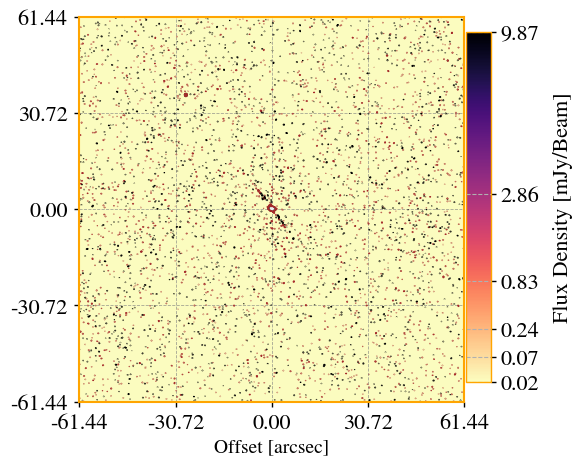

In [16]:
ax=mlibs.eimshow(input_data.filename)

##### Image too large to see the structure of the radio source? 
You can easily crop the image.

  >> Center -->  [1536 1541    0    0]


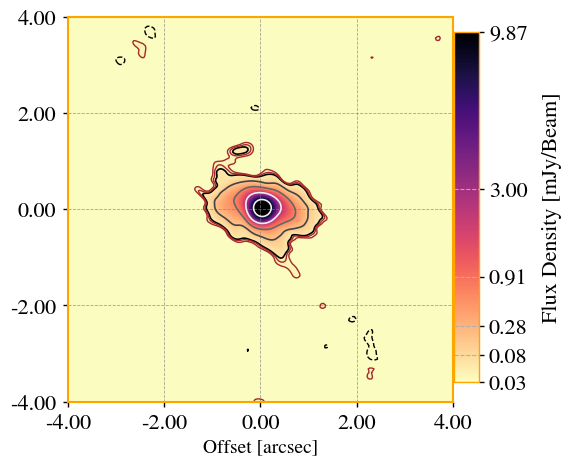

In [17]:
ax=mlibs.eimshow(input_data.filename, 
                 crop=True,box_size=(100),
                 center=None)

##### There are other several options to customize the plot.

  >> Center -->  [1536 1541    0    0]


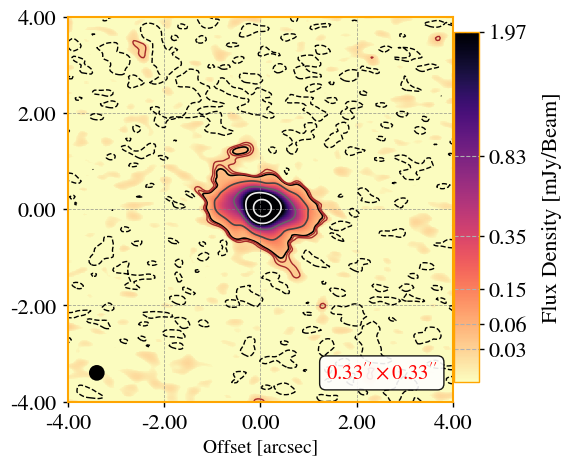

In [18]:
ax=mlibs.eimshow(input_data.filename,
                 add_beam=True,
                 crop=True,box_size=(100),
                 vmin_factor=1.0,vmax_factor=0.1, #level factor (max from peak, and min from std)
                 neg_levels=mlibs.np.asarray([-1]), # negative contours to draw -- which negative std level?
                 CM='magma_r',
       )

  >> Center -->  [1536 1541    0    0]


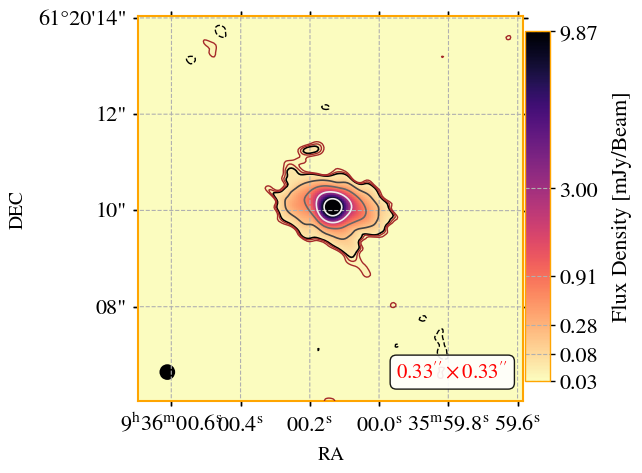

In [19]:
#change the projection of the image.
ax=mlibs.eimshow(input_data.filename,
                 add_beam=True,
                 crop=True,box_size=(100),
                 projection='celestial'
       )

  >> Center -->  [1536 1541    0    0]


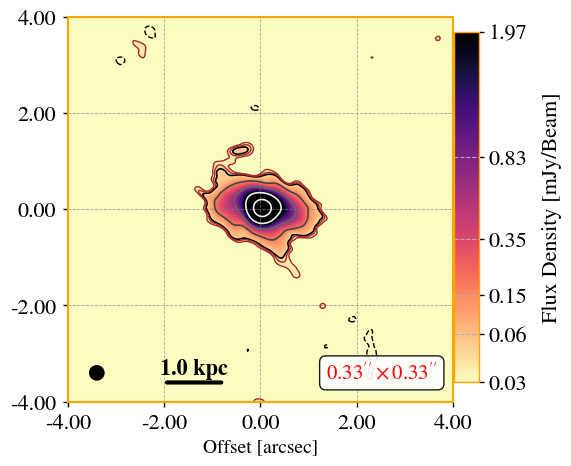

In [20]:
#If you provide at which redshift the source is located, you can also add a scale bar using
# astropy.units module.
ax=mlibs.eimshow(input_data.filename,
                 add_beam=True,
                 crop=True,box_size=(100),
                 vmin_factor=3.0,vmax_factor=0.1, #level factor (max from peak, and min from std)
                 neg_levels=mlibs.np.asarray([-3]), # negative contours to draw -- which negative std level?
                 CM='magma_r',
                 source_distance=mlibs.find_z_NED('UGC5101'), #in z
                 scalebar_length = 1.0*mlibs.u.kpc
       )

#### Performing image cutouts. 
If your image is too large to perform statistical analysis (e.g., you can reduce it to speed up things), you may perform a simple cutout.

[1536 1541    0    0]
09:35:51.600, +61.21.11.700, 9.999e+09Hz, I
09:35:51.600  +61 21 11.700
143.96499999999997 61.35325


<Axes: xlabel='Offset [arcsec]'>

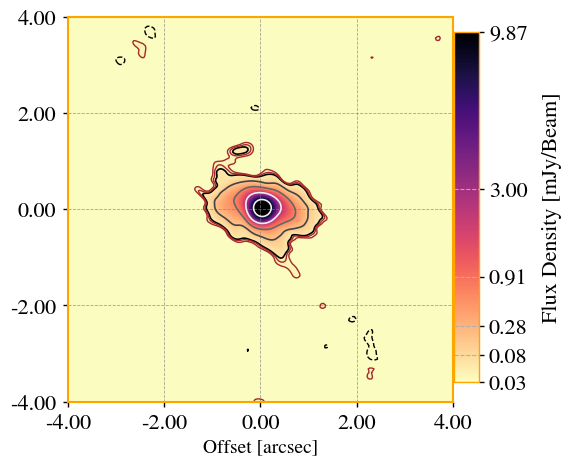

In [21]:
cutout_size = 200
ra,dec,new_filename = mlibs.cutout_2D_radec(imagename=input_data.filename,
                                            residualname=input_data.residualname,
                                            cutout_size = cutout_size,
                                            special_name='')
mlibs.eimshow(new_filename)

You also can use the following if you wanna use those coordinates as a reference to cut other images to the same size and centre

In [22]:
for i in mlibs.tqdm(range(len(imagelist))):
    mlibs.cutout_2D_radec(imagename=imagelist[i],
                    residualname=residuallist[i],
                    ra_f=ra,dec_f=dec,
                    cutout_size = cutout_size,
                    special_name='')

100%|██████████| 2/2 [00:00<00:00, 51.40it/s]


But, then, you may need to reload the image files again.

In [23]:
prefix_images = '*MFS-image.cutout.fits'
imagelist = mlibs.glob.glob(root_path+prefix_images)
imagelist,residuallist = \
    mlibs.sort_list_by_beam_size(imagelist=imagelist,return_df = False)
    
# lets select another image from our list of images. 
idx = -1 #select one index from the list. 
input_data=mp.read_data(filename=imagelist[idx],
                        residualname=residuallist[idx])
    

100%|██████████| 2/2 [00:00<00:00, 95.75it/s]

0 >> selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..0.5-MFS-image.cutout.fits
1 >> selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.cutout.fits
++>> Image File: selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.cutout.fits
++>> Residual File: selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-residual.cutout.fits
-->> No PSF File was provided.


<Axes: xlabel='Offset [arcsec]'>

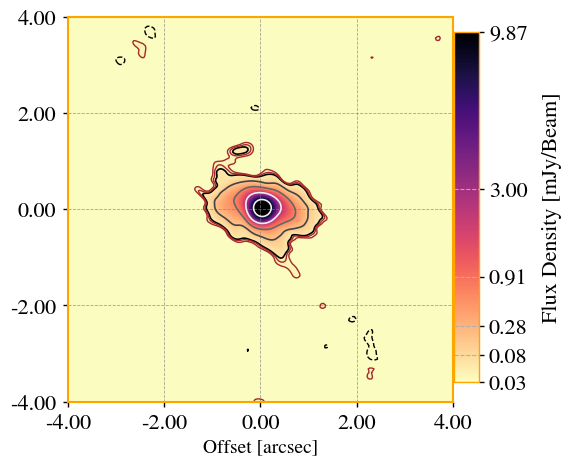

In [24]:
mlibs.eimshow(input_data.filename)

# 2 - Source Extraction
Now, it is time to prepare ourselves for the image fitting. 

Before we head to the Sérsic fitting, we should inspect the structure of the emission. 
For that, we can perform a simple source extraction from the image and compute basic prior information, which includes:

1. Finding relevant regions of emission, and applying deblending where required. We will have the locations `(x0,y0)` of these regions.
2. Then, we compute first order sizes and effective intensities of these regions, for example $R_{50}$, $I_{50}$ and, additionally the Petrosian radius $R_p$ (experimental).
3. It is also relevant to quantify the axis ratio and position angles of these structures. 

We use this prior information to construct a physically constrained Sérsic model. 

Note however that, necessarily, we do not require accurate shape properties from the image using this source extraction part. We are looking for initial physical constraints for our model, and those parameters will be optimised. 

To do this, we use the class `mp.source_extraction`, which allow us to find relevant regions of emission and determine our prior information. 
Only after that, one should proceed to the Sérsic fitting. 

Let's load our data again, if required.

In [25]:
# lets select another image from our list of images. 
idx = -1
input_data=mp.read_data(filename=imagelist[idx],
                        residualname=residuallist[idx])

++>> Image File: selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.cutout.fits
++>> Residual File: selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-residual.cutout.fits
-->> No PSF File was provided.


In [26]:
image_data = input_data.image_data_2D
residual_data = input_data.residual_data_2D

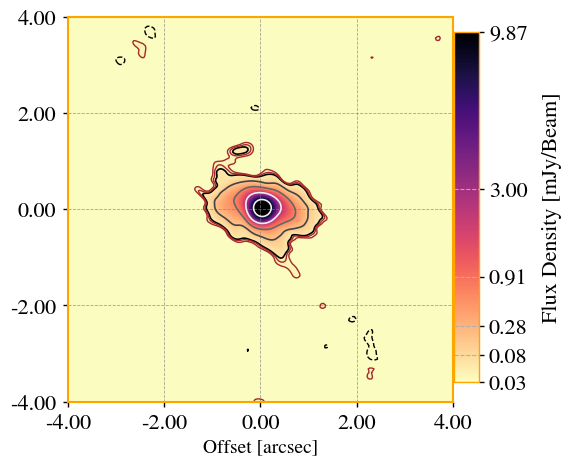

In [27]:
ax=mlibs.eimshow(input_data.filename,
        vmin_factor=3.0,vmax_factor=0.5, #level factor (max from peak, and min from std)
        neg_levels=np.asarray([-3]), # negative contours to draw -- which negative std level?
        CM='magma_r',
       )

#### Masking
Masking is critical to obtain accurate information of the emission structure, so that we can avoid adding noise information to the statistics.


For details of why we use the masking approach below, see Lucatelli et al. (2024) and [`../image_analysis/morphen_image_analysis.ipynb`](https://github.com/lucatelli/morphen/blob/main/image_analysis/morphen_image_analysis.ipynb)

Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
 ==>  Dilation size is 7 [px]


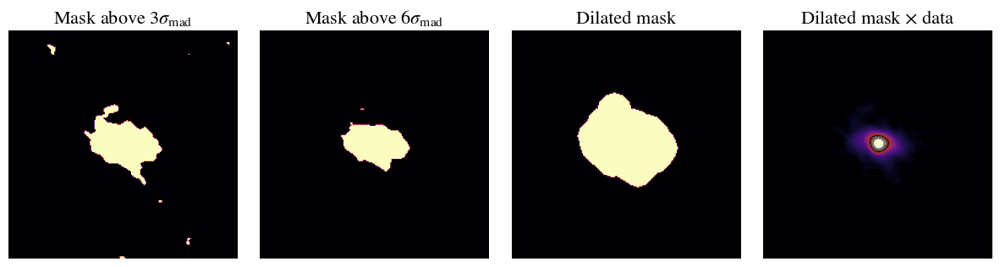

In [28]:
std = mlibs.mad_std(input_data.residual_data_2D)
_, mask = mlibs.mask_dilation(mlibs.ctn(imagelist[-1]), PLOT=True,dilation_type='disk',
                        sigma=6, iterations=2, dilation_size=None)

### Testing the Source-Extraction
The source extraction uses the `SEP` package, which is a python implementation of the SExtractor algorithm.

Note however that SEP was not extensively tested FOR RADIO IMAGES, and we require some more testing and improvements. 

You will need to play with the parameters below until you are happy. 

Lets now run a source extraction in our image to extract relevant information. Parameters that are critical for the source detection are the `SEP` arguments for the source extraction `bwf`, `bhf`, `fwf` and `fhf`:
```
- bwf : int
    Box width fraction in terms of the beam size
    for the background estimation.
- bhf : int
    Box height fraction in terms of the beam size
    for the background estimation.
- fwf : int
    Filter width fraction in terms of the beam size
    for the background estimation.
- fhf : int
    Filter height fraction in terms of the beam size
    for the background estimation.
```
Currently, we are also implementing a Photutils algorithm (within PetroFit) for source detection, but more testing is required. We also plan to include AstroDendro and PyBDSF capabilities for this task.


WARNING: This is implementation is in an early stage, so it is not completely automated. It is required that the user interacts with it in order to check if the source detection is feasible. That usually involves, from the default parameters below, run the source extraction in the image and check if it went well. If not (e.g. false detections, artefacts, etc), play around with the parameters until okay. 
Improvements are being made so that this can be escalated to multiple images. 



In [29]:
#this is a set of parameters that may work OKAY
bwf, bhf = 2, 2 # standard value that works for a wide range of images. But, additional check is required!!!!
fwf, fhf = 2, 2 # standard value that works for a wide range of images. But, additional check is required!!!!
clean_param = 0.5
deblend_cont = 1e-3
deblend_nthresh = 15
sigma_mask = 10
sigma = 10
# ell_size_factor = 2.5
ell_size_factor = 0.3*mlibs.get_ell_size_factor(psf_current = mlibs.get_beam_size_px(input_data.filename)[0])

To check if the source detection is good, you may pass the argument `dry_run=True` which will only display the regions detected, without performing any calculations. 

So, lets run a `dry_run` source detection. This will only show the detected sources, without returning any prior properties (faster).

This is useful in case you do not know for sure the noise structure of the image. Suppose that the number of structures detected are many (false detections, due to poor SNR). That will take some time to compute their properties. 

8.143560698176874
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
 ==>  Dilation size is 7 [px]
INFO: Total number of Sources/Structures (deblended) =  1


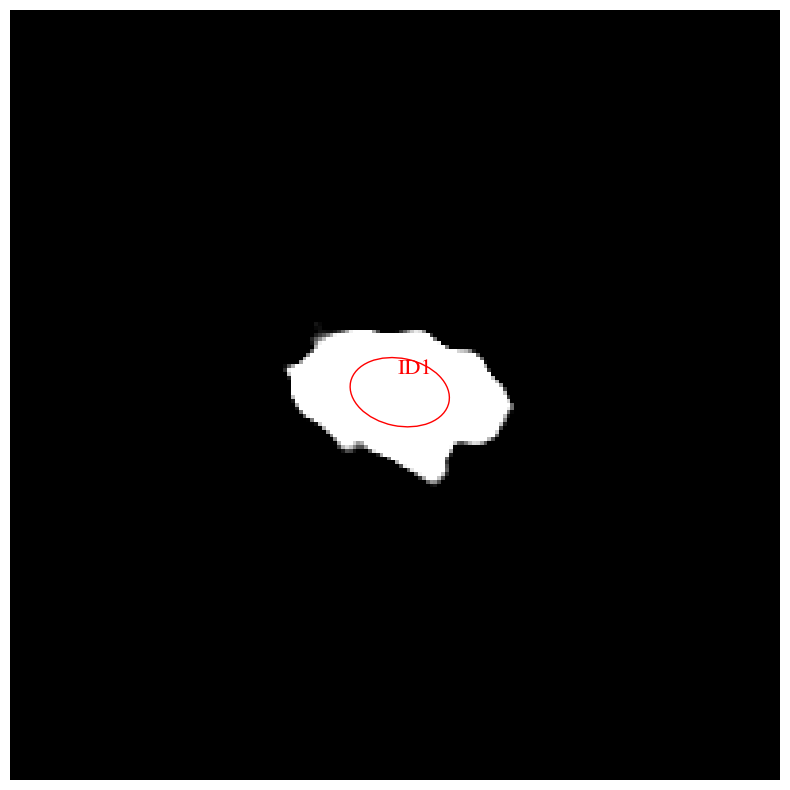

In [30]:
SE = mp.source_extraction(input_data, 
                          ell_size_factor = ell_size_factor, sigma = sigma,
                          bwf = bwf,bhf = bhf,fwf = fwf, fhf = fhf,
                          clean_param = clean_param, 
                          deblend_cont = deblend_cont, 
                          deblend_nthresh=deblend_nthresh,minarea_factor=1.0,
                          apply_mask=True,sigma_mask=sigma_mask,
                          show_petro_plots=True,
                          dry_run=True)
# plt.imshow(input_data.image_data_2D)

In [31]:
#print detection positions of each structure
SE.objects['xc'],SE.objects['yc']

(array([100]), array([100]))

### Decomposition of the Radio Emission
Before running the source extraction again, with `dry_run=False`, lets pay attention to another thing.

By a 'structure' or 'source', we mean a spatial region responsible for emitting radio emission: 
1. This region/source/structure can be simple, mono-component such as a blob or a compact structure.
2. Or this region/source/structure can be composite/complicated, having a compact structure surrounded by other structures, such as diffuse emission. So, this structure is not 'mono-component', but 'multi-component'.
  
In principle, the detection algorithm used here will not distinguish those cases.
This is not deblending, because they are actually overlapping structures. 
Hence, they are identified as just a source. So, we have to investigate the following question: ***Is a single model component (a single Sersic function) enough to model each detected individual source?***

We differentiate a detected region by its `ID`, so structure `ID`. 

In the example above, we may say conclude that structure `ID1` is more complex than a mono-component. 

Lets see the data again:

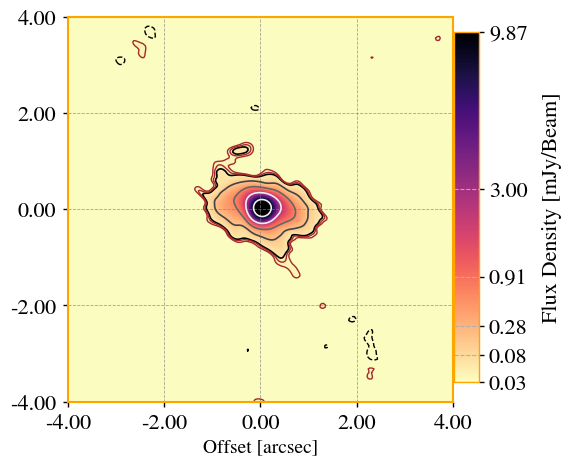

In [32]:
ax=mlibs.eimshow(input_data.filename)

It is clear that some material is surrounding the central structure (`ID1`).

### So the answer to our question:
### ***Is a single model component (a single Sersic function) enough to model each detected individual source?*** is: 
### ***Probably not!*** 

We see that `ID1` is a composite source, containing a compact structure surrounded by some asymmetric and more diffuse emission. In this case, when modelling this source with the Sersic decomposition, we have to tell the algorithm that `ID1` is composite and requires more than one model component. 

In the `mp.source_extraction` class, the argument used for this is `ids_to_add`, 
which is a list of IDs where we want to add extra model components. 
In our case, to add another model component to `ID1`, we use `ids_to_add = ['1']`. So, our source `ID1` will be decomposed into two model components.

***Note that at the current stage of `morphen`, this is a manual step. In a future version this will be fully automated.***



If you are happy with the source detection, have decided how many components (`COMP_`s) do you need, and have attributed the components to corresponding source `ID`s, you may proceed. Remember to set `dry_run = False`.

8.143560698176874
 ==>  Dilation size is 4 [px]
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
 ==>  Dilation size is 7 [px]
INFO: Total number of Sources/Structures (deblended) =  1


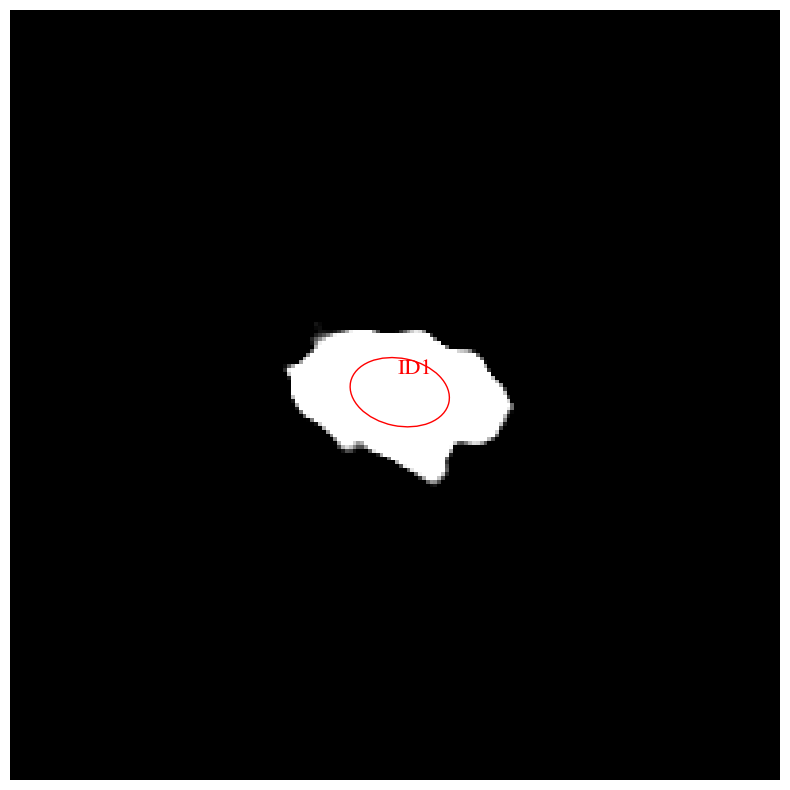

1


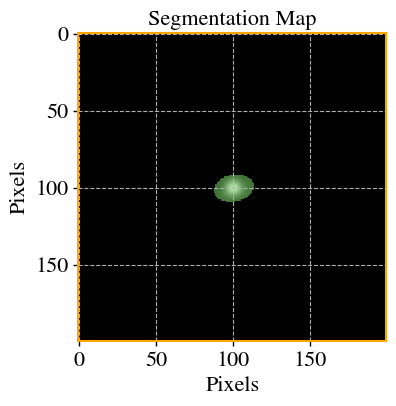

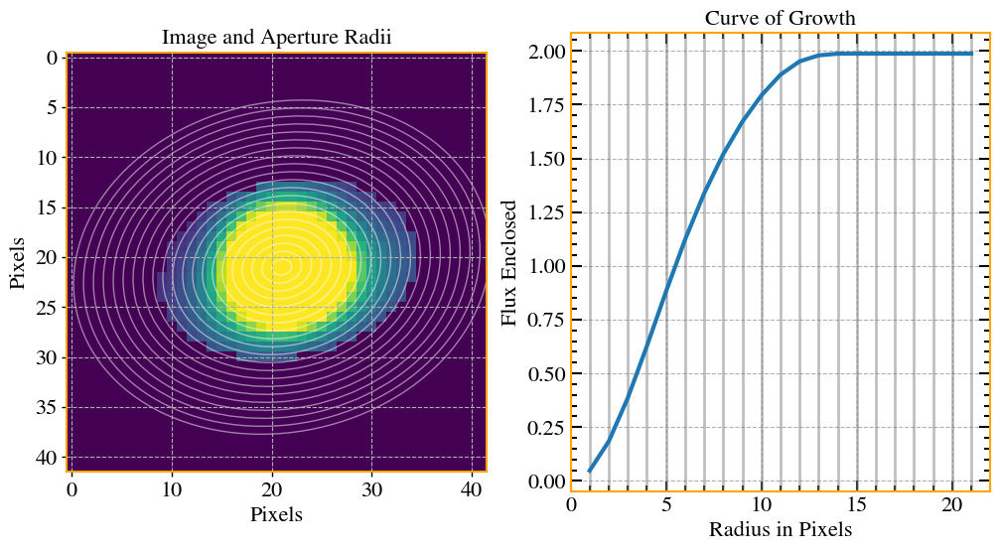

1


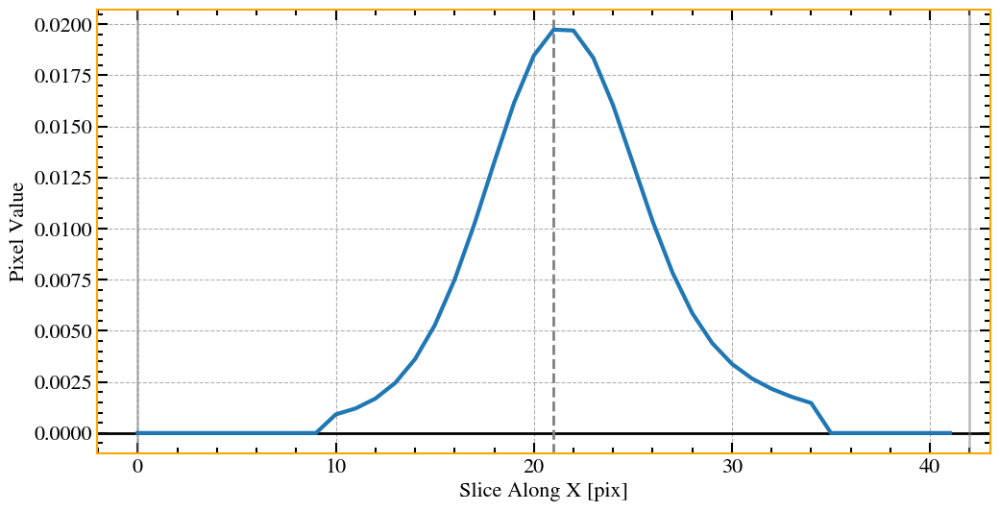

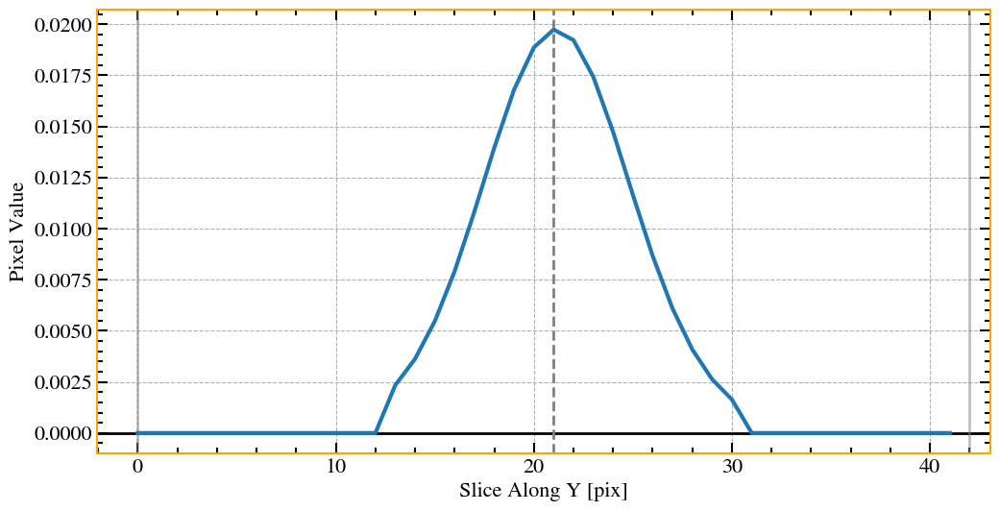

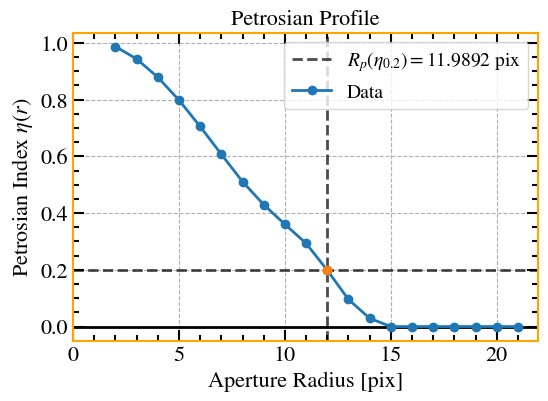

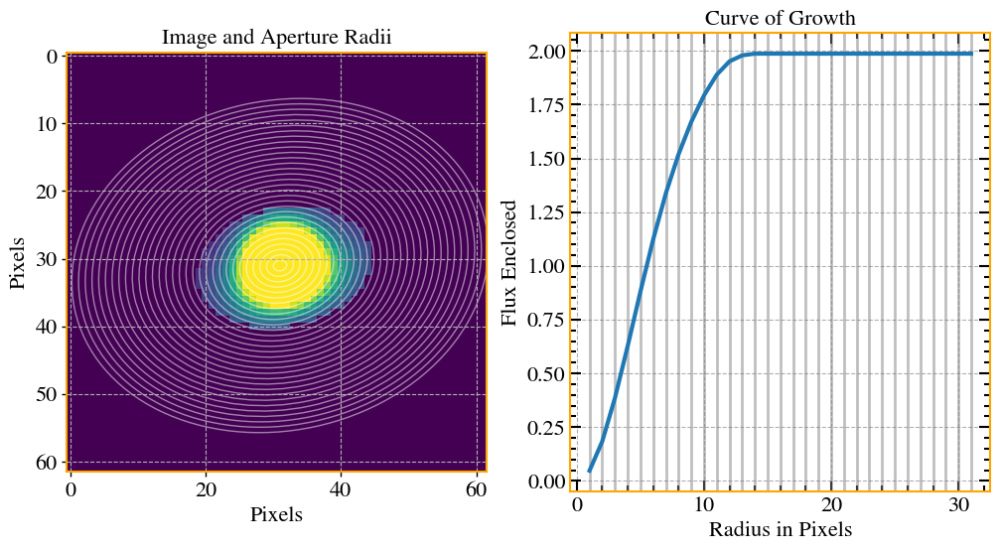

PSF SIZE is 200
INFO: Using Elliptical Gaussian for Gaussian beam convolution.
++==>>  PSF major/minor axis = ', 0.32574242792707164arcsec X 0.32574242792707164arcsec
# of structures (IDs) to be fitted = 1
# of model components (COMPS) to be fitted = 2


2024-02-06 00:26:12	WARN	componentlist::close	componentlist closed


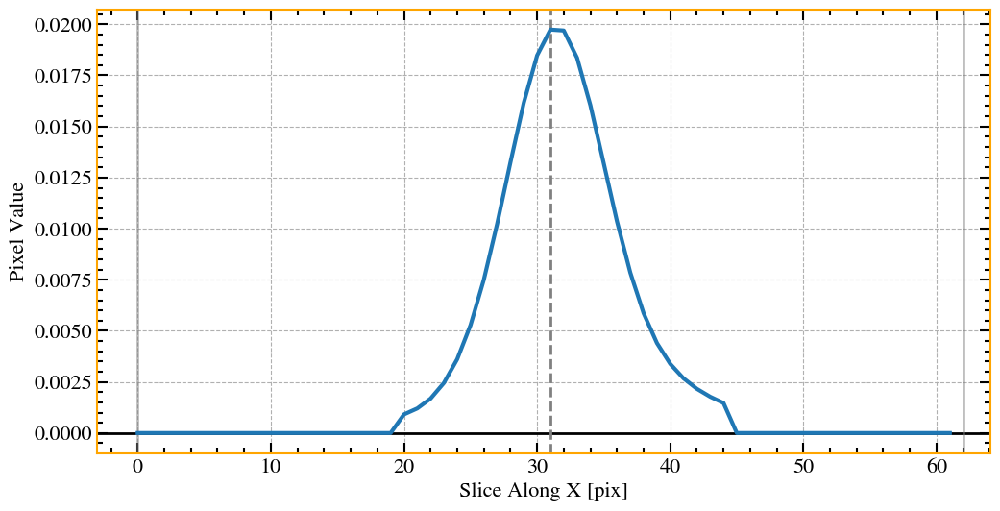

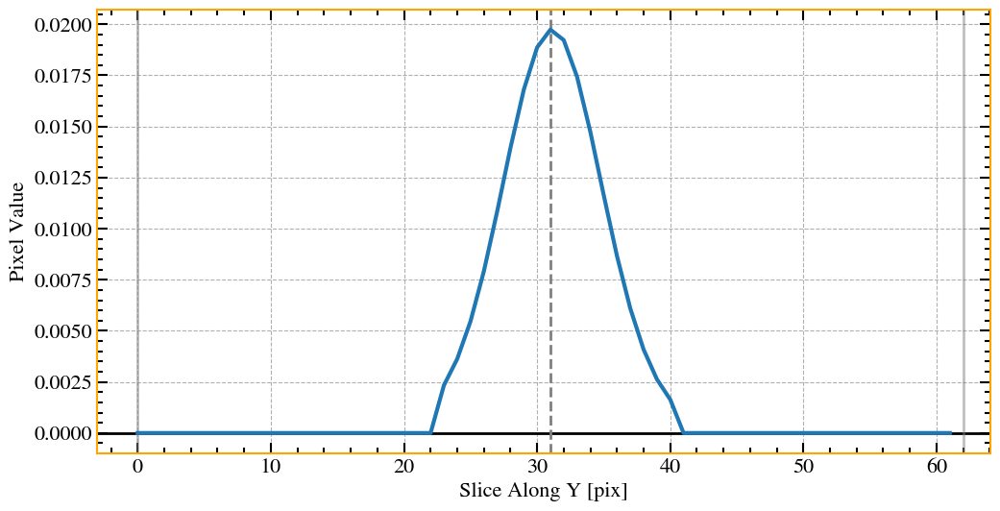

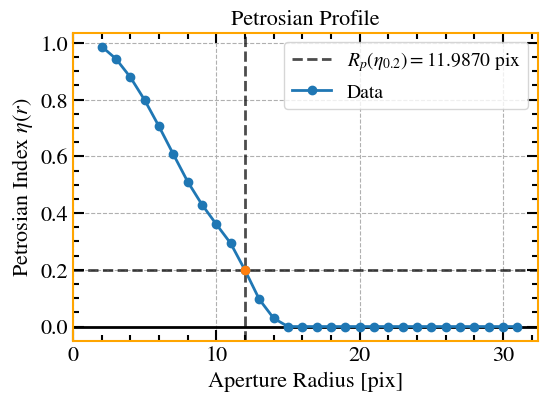

In [34]:
SE = mp.source_extraction(input_data, ids_to_add=['1'],
                          ell_size_factor = ell_size_factor, sigma=sigma,
                          bwf=bwf, bhf=bhf, fwf=fwf, fhf=fhf,
                          clean_param=clean_param, 
                          deblend_cont=deblend_cont, 
                          deblend_nthresh=deblend_nthresh,
                          apply_mask=True,sigma_mask=sigma_mask,
                          show_petro_plots=True,
                          dry_run=False)

When using `mp.source_extraction` (`SE`) with `dry_run = False`, it returns a dictionary with basic photometric information of each source (`SE.sources_photometries`). 

If in the previous step no extra component was added (i.e. `ids_to_add = []`), this dictionary will have the same number of model components as the number of detection sources/structures/regions. 

When another extra component is added, components that are added to a source ID will contain similar information as the parent ID. 
For example, in our case originally we had `ID_1 -> COMP_1`, then `COMP_2` will be a copy of `COMP_1` with the following modifications:
<!-- - the positions of `COMP_1`, `(x0,y0)` are copied onto `COMP_2`. -->
- the starting constraint of the effective radius of `COMP_2` is 3 times of that of `COMP_1`.
- the starting constraint of the effective intensity of `COMP_2` is 0.1 times of that of `COMP_1`.

Now, in our example, we have `ID_1 -> (COMP_1, COMP_2)`.


We can check the dictionary containing such photometric properties:

In [35]:
SE.sources_photometries

{'c1_PA': -12.044617910322692,
 'c1_q': 0.7856206136648418,
 'c1_area': 363.0,
 'c1_Re': 10.749255261864239,
 'c1_x0c': 100.65458051813644,
 'c1_y0c': 100.2831523363917,
 'c1_label': 1,
 'c1_R50': 5.500900180036007,
 'c1_R20': 3.0704140828165634,
 'c1_R80': 8.549509901980397,
 'c1_C1': 0.4447442703055592,
 'c1_Snu': 1.9869328307092635,
 'c1_Rp': 11.986997399479895,
 'c1_Rpidx': 23,
 'c1_rlast': 31,
 'c1_I50': 0.007775938243139535,
 'ncomps': 2,
 'c2_PA': -12.044617910322692,
 'c2_q': 0.7856206136648418,
 'c2_area': 363.0,
 'c2_Re': 10.749255261864239,
 'c2_x0c': 100.65458051813644,
 'c2_y0c': 100.2831523363917,
 'c2_label': 1,
 'c2_R50': 16.502700540108023,
 'c2_R20': 3.0704140828165634,
 'c2_R80': 8.549509901980397,
 'c2_C1': 0.4447442703055592,
 'c2_Snu': 1.9869328307092635,
 'c2_Rp': 11.986997399479895,
 'c2_Rpidx': 23,
 'c2_rlast': 31,
 'c2_I50': 0.0007775938243139535}

More information can be found in the function responsible to generate a new model component from a parent one. 

In [36]:
mlibs.add_extra_component??

Signature: mlibs.add_extra_component(petro_properties, copy_from_id)
Source:   
def add_extra_component(petro_properties, copy_from_id):
    """
    Create another component from a dictionary (petro_properties) having
    photometric properties for N detected components in an image.

    Params
    ------
    petro_properties: dict
        Contain parameters of a number o N components obtained
        by a petrosian analysis of all detected sources.
        Example (these are actually the keys() from the dictionary):
        ['c1_PA', 'c1_q', 'c1_area', 'c1_Re',
        'c1_x0c', 'c1_y0c', 'c1_label', 'c1_R50',
        'c1_Snu', 'c1_Rp', 'c1_Rpidx', 'c1_rlast',
        'c1_I50']
    copy_from: int
        From which component copy parameters from.
        This is useful, for example, the source has two components detected,
        1 compact and the other a structure that can not be modelled by a single
        sersic function. Then, we need one function to model the compact structure,


#### A more complicated example, to show the feasibility of this method, is shown at the end of this notebook.

# Sersic Multi-Fit
Now, we are ready to proceed for to the fitting part. 

We can use the source extraction object `SE` to feed it into the multi-sersic fitting. 

Relevant arguments:
```
    fix_n : list (same shape as the number of components)
        List of booleans to fix the Sersic index.
        Default is None, will attibute True to all elements. 
    fix_value_n : list (same shape as the number of components)
        List of values to fix the Sersic index.
        Default is None, will attribute 0.5 to all elements.
    dr_fix : list (same shape as the number of components)
        List of values to fix radially (dr) the positions x0,y0. This will be the max boundary for each direction x and y.
        Default is None, will attribute 10 to all elements.

```
By default, the code fixes all Sersic indeces to `n=0.5` for all model components. 

It also fixes all components to its detected positions `(x0,y0)` during the source extraction step, but gives an interval of +/-10 px during the optimisation. 

You can modify these options by passing the arguments `dr_fix = [3,50]`, meaning that `COMP_1` is very spatially constrained, and can vary only +/- 3 pixels, while `COMP_2` is spatially constrained to a larger bound, the algorithm will search in the boundary of +/- 50 pixels during optimisation.

Another important observation is that, since we want to decompose the radio structure in terms of compact and diffuse emission, we must specify which model components corresponds to compact structures and diffuse structures. 

In our case, `COMP_1` (always the brightest part of the source, an assumption that holds for compact structures) is our compact model, and `COMP_2` will be our diffuse model. 

Do not worry about the diffuse labels, just focus on the compact labels. We pass this information via the argument `comp_ids`. The algorithm will determine automatically the labels for diffuse structures by exclusion (in our case, will be `2`). 

If your model has a single model component (e.g. in the previous step, you have used `ids_to_add = []`), diffuse structures will be considered to be the residual. 

A comprehensive example using 8 model components (YES, THAT IS RIGHT, EIGHT!!) is provided at the end of this notebook.


2024-02-06 00:27:13 - INFO -  ++>> Fitting without a mask.


Fitting selfcal_image_UGC05101.calibrated.avg12s_trial_1_3072x3072_0.04asec_100000.briggs.multiscale..1.0-MFS-image.cutout.fits
rms res =  0.8475561554451448
rms data =  8.574025840098152 ; rms res =  7.266968377720917 ; ratio =  0.8475561554451448
 ==>  Dilation size is 4 [px]


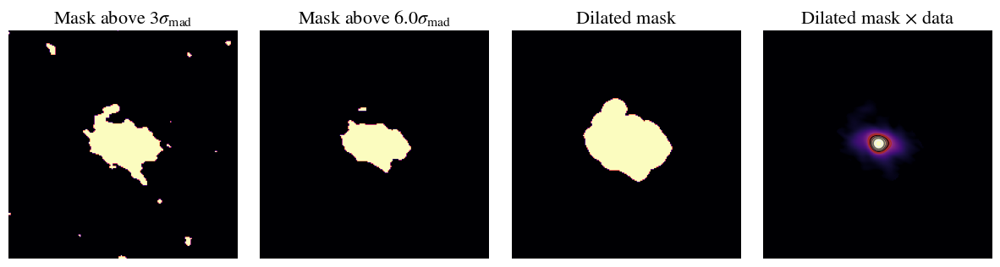

PSF BEAM SIZE is >=>  8
PSF SIZE is >=>  200
INFO: Using Elliptical Gaussian for Gaussian beam convolution.
++==>>  PSF major/minor axis = ', 0.32574242792707164arcsec X 0.32574242792707164arcsec


2024-02-06 00:27:14	WARN	componentlist::close	componentlist closed
2024-02-06 00:27:13.676594: I external/xla/xla/pjrt/tfrt_cpu_pjrt_client.cc:458] TfrtCpuClient created.
2024-02-06 00:27:13.817987: I external/xla/xla/stream_executor/cuda/cuda_gpu_executor.cc:910] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-06 00:27:13.819207: I external/xla/xla/service/service.cc:168] XLA service 0x559e317a2810 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-02-06 00:27:13.819230: I external/xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 2070, Compute Capability 7.5
2024-02-06 00:27:13.820095: I external/xla/xla/pjrt/gpu/se_gpu_pjrt_client.cc:627] Using BFC allocator.
2024-02-06 00:27:13.820126: I external/xla/xla/pjrt/gpu/gp

Limiting  x0
Limiting  y0
Fixing Sersic Index of component 0  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 1  to 0.5.
{'f1_x0': {'value': 100.65458051813644, 'min': 97.65458051813644, 'max': 103.65458051813644}, 'f1_y0': {'value': 100.2831523363917, 'min': 97.2831523363917, 'max': 103.2831523363917}, 'f1_PA': {'value': -12.044617910322692, 'min': -102.0446179103227, 'max': 77.9553820896773}, 'f1_ell': {'value': 0.21437938633515818, 'min': 0.04287587726703164, 'max': 0.42875877267031637}, 'f1_n': {'value': 0.5, 'min': 0.49, 'max': 0.51}, 'f1_In': {'value': 0.007775938243139535, 'min': 7.775938243139535e-05, 'max': 3.8879691215697676}, 'f1_Rn': {'value': 5.500900180036007, 'min': 0.27504500900180034, 'max': 8.251350270054012}, 'f1_cg': {'value': 0.0, 'min': -0.01, 'max': 0.01}, 'f2_x0': {'value': 100.65458051813644, 'min': 50.65458051813644, 'max': 150.65458051813644}, 'f2_y0': {'value': 100.2831523363917, 'min': 50.283152336391694, 'max': 150.2831523363917}, 'f2_PA

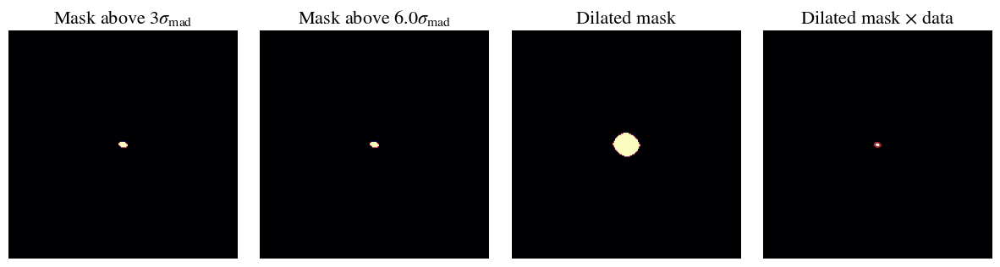

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...
25 100 75


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:168: RuntimeWarning: Mean of empty slice.
  remove_indexes = np.where(np.logical_or(abs(y - y.mean()) >
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:169: RuntimeWarning: Mean of empty slice.
  abs(y - y.mean()).mean() * 1.5, \
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:170: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()) >
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:171: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()).mean() * 1.5) == True)[0]
/media/sagauga/xfs_evo/cloud/

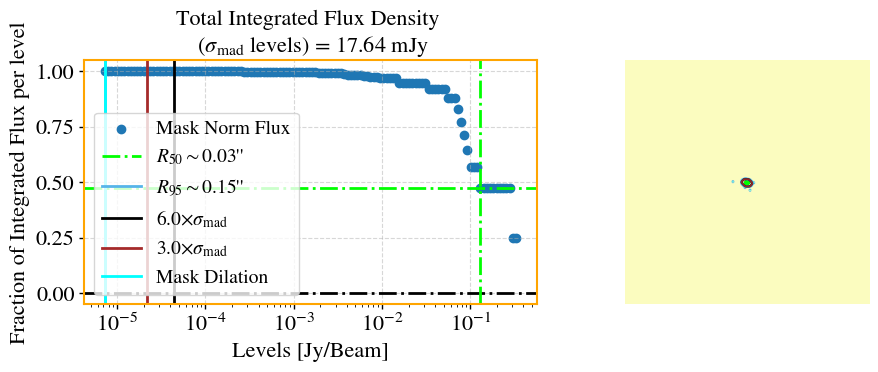

     >> CALC: Computing Petrosian properties.
eta = 0.15
epsilon = 2
r_half_light (old vs new) = 1.21
r_total_flux (old vs new) = 3.45
R50 =  1.2072414482896578
Rp= 3.447689537907581
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 63.63it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  17.636414359204004 +/- 0.03365408564131655 mJy
Fractional error flux =  0.0019082158626962246
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 4 [px]


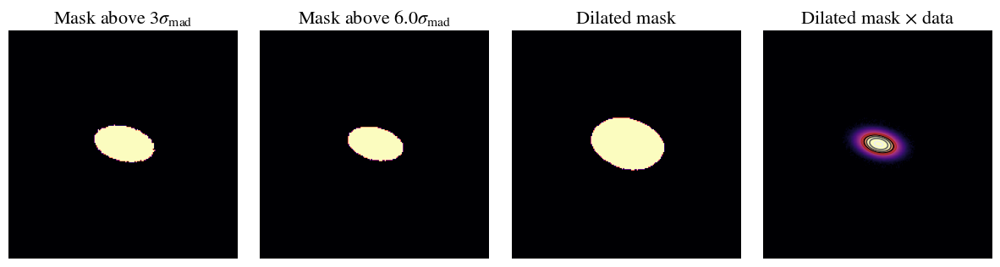

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...
25 100 75


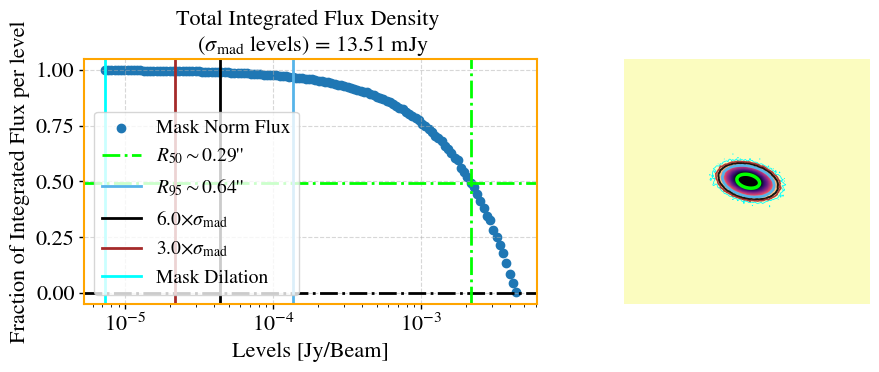

     >> CALC: Computing Petrosian properties.
Rlast     >>  39
Rp        >>  20.915983196639328
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 9.61
r_total_flux (old vs new) = 38.94
R50 =  9.610322064412882
Rp= 19.47269453890778
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 59.54it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  13.520537947908997 +/- 0.22233474870861675 mJy
Fractional error flux =  0.016444223563086977
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 4 [px]


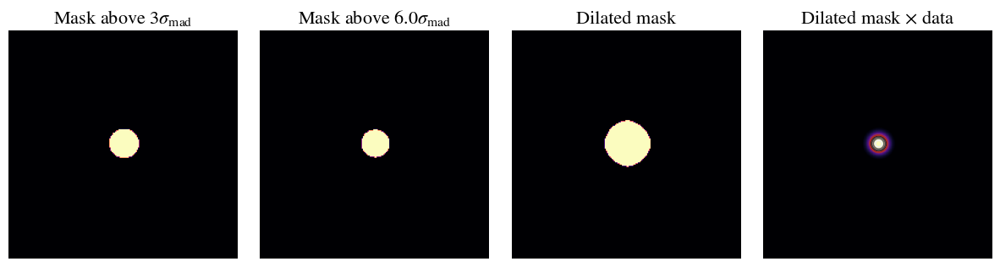

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...
25 100 75


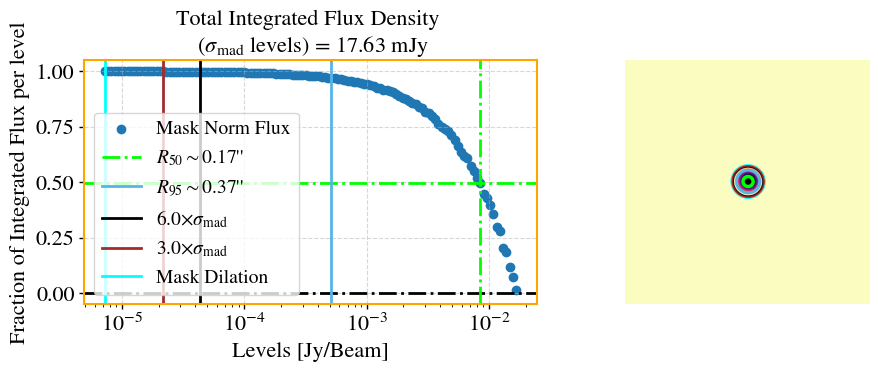

     >> CALC: Computing Petrosian properties.
eta = 0.15
epsilon = 2
r_half_light (old vs new) = 4.28
r_total_flux (old vs new) = 19.26
R50 =  4.276655331066213
Rp= 9.62992598519704
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 63.39it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  17.634915767433654 +/- 0.1288862065836993 mJy
Fractional error flux =  0.007308580788444314
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 4 [px]


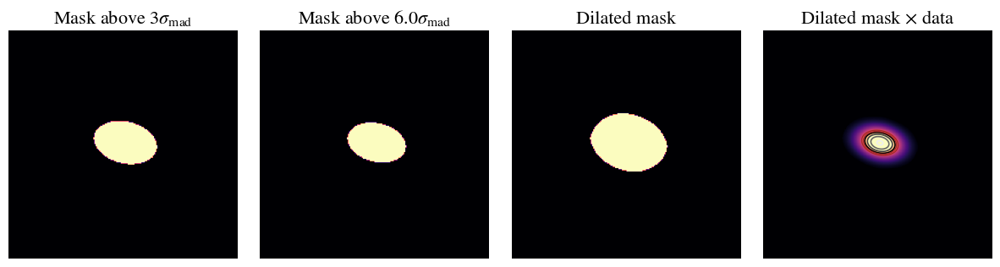

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...
25 100 75


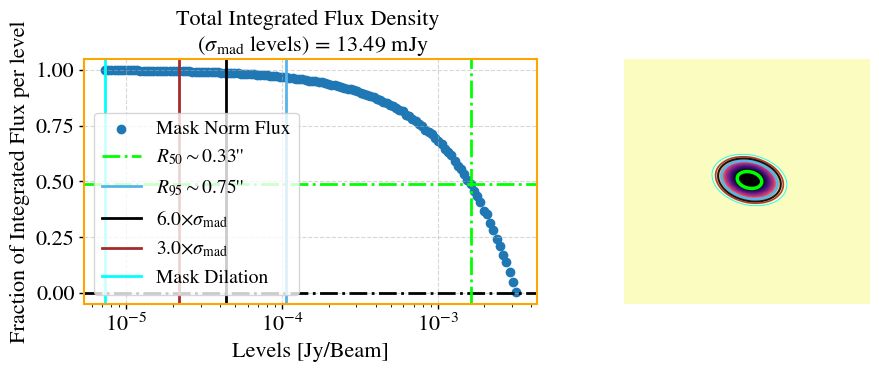

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


     >> CALC: Computing Petrosian properties.
Rlast     >>  42
Rp        >>  22.61732346469294
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 10.46
r_total_flux (old vs new) = 38.34
R50 =  10.460292058411683
Rp= 21.067213442688537
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 71.95it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  13.516390667093123 +/- 0.25204572721769003 mJy
Fractional error flux =  0.018647413605121534
-----------------------------------------------------------------
*************************************
{'comp_ID_1': {'Spk_class': 'C', 'I50_class': 'D', 'AC1_deconv_class': 'C', 'AC2_deconv_class': 'C', 'final_class': 'C'}, 'comp_ID_2': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_class': 'D', 'AC2_deconv_class': 'D', 'final_class': 'D'}}
['1']
  ++>> Total component IDs modelled: ['1' '2']
  ++>> IDs attributed to compact structures: ['1']
  ++>> IDs attributed to extended structures: ['2']
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
 ==>  Dilation size is 4 [px]
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
 ==>  Dilation size is 4 [px]
Not able to determine cel

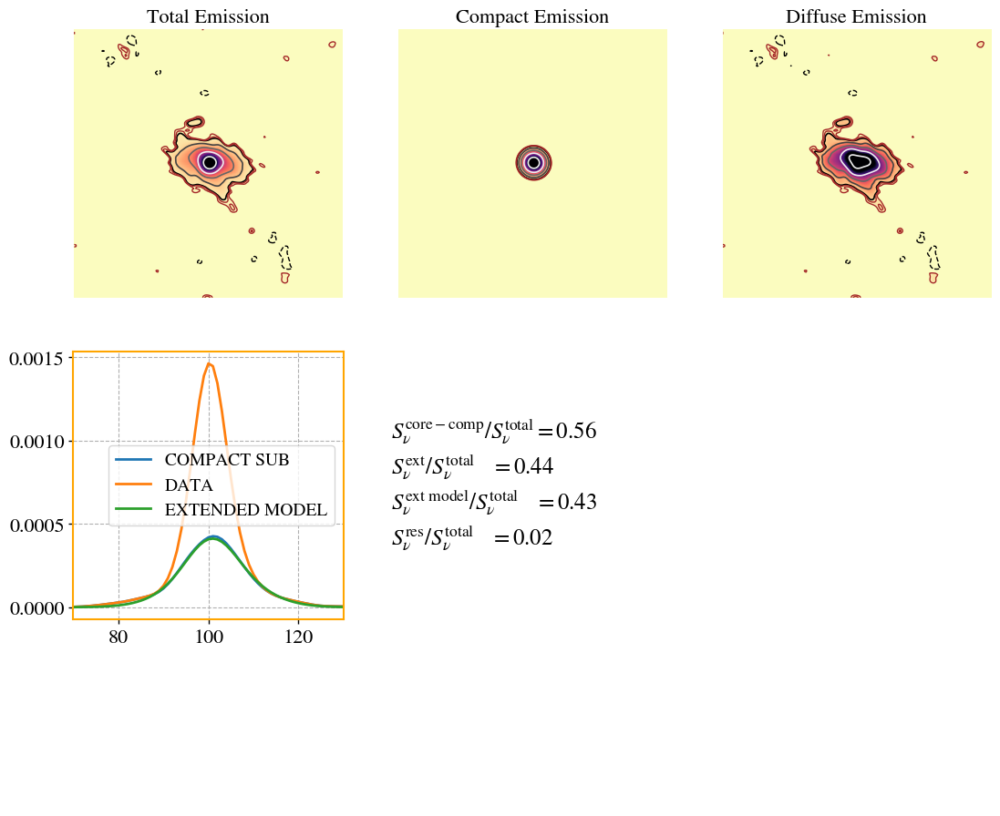

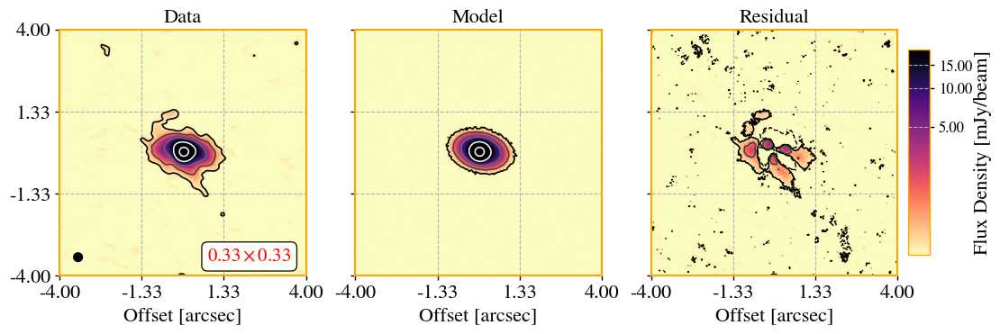

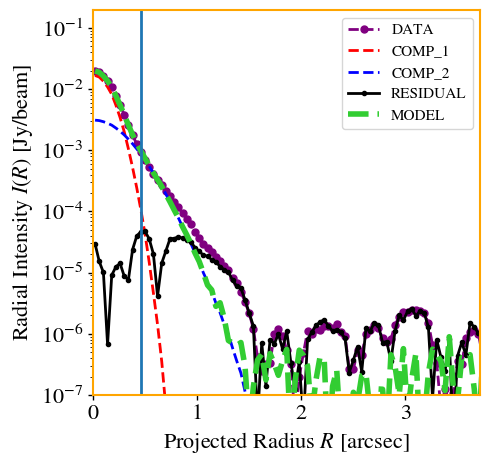

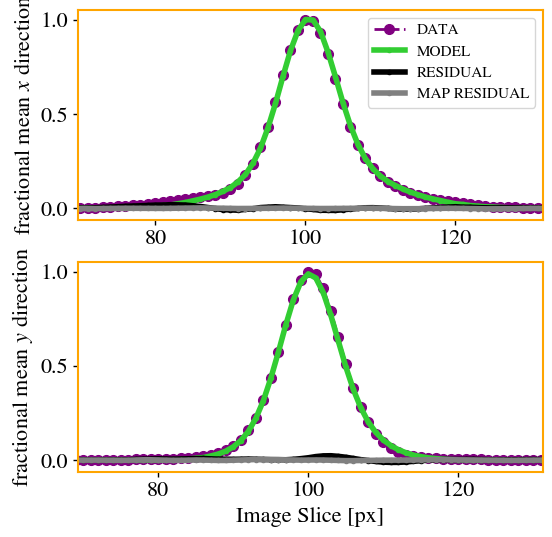

Using rms provided...
25 100 75


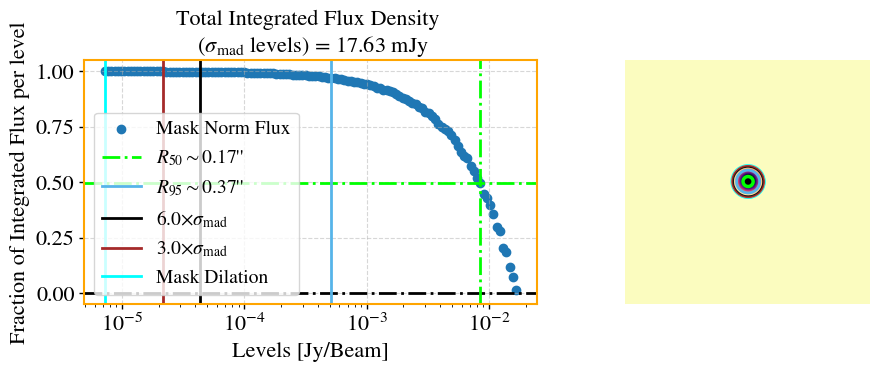

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:168: RuntimeWarning: Mean of empty slice.
  remove_indexes = np.where(np.logical_or(abs(y - y.mean()) >
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:169: RuntimeWarning: Mean of empty slice.
  abs(y - y.mean()).mean() * 1.5, \
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:170: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()) >
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:171: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()).mean() * 1.5) == True)[0]
/media/sagauga/xfs_evo/cloud/

Using rms provided...
25 100 75


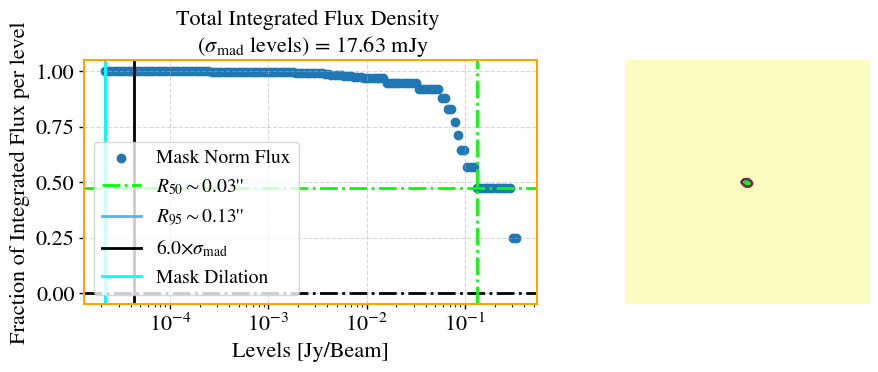

Using rms provided...
25 100 75


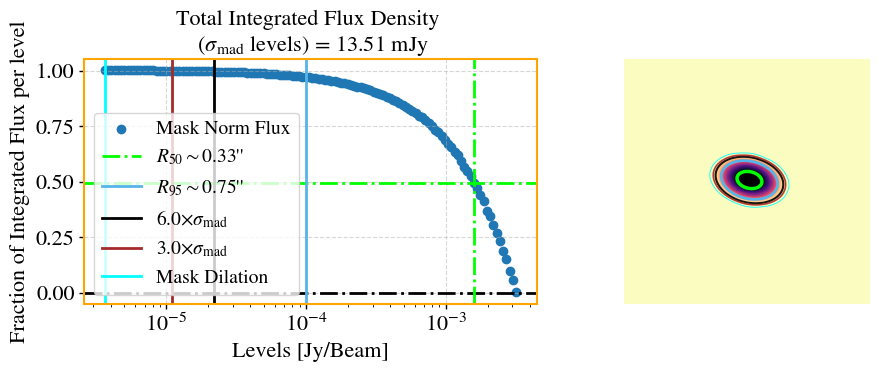

Using rms provided...
25 100 75


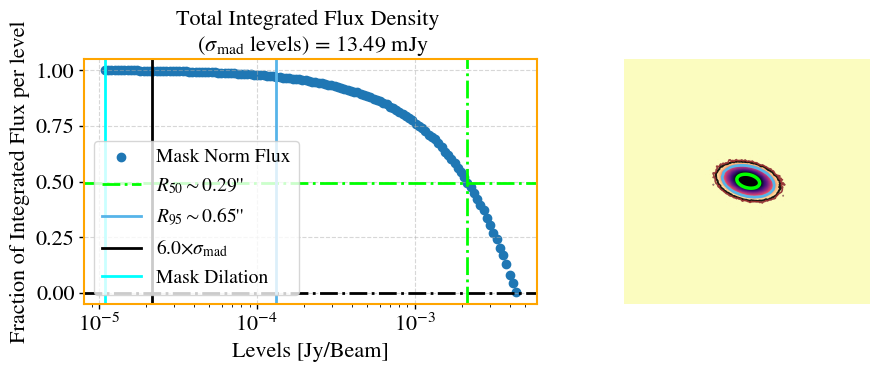

2024-02-06 00:27:26 - INFO - +--------------------------------+
2024-02-06 00:27:26 - INFO - | Core-Compact Component Sizes |
2024-02-06 00:27:26 - INFO - +--------------------------------+
2024-02-06 00:27:26 - INFO -  >=> Beam Size = 8.00 px
2024-02-06 00:27:26 - INFO -  >=> Beam Size = 257.44  pc
2024-02-06 00:27:26 - INFO -  >=> Rn Main Compact = 34.23  pc
2024-02-06 00:27:26 - INFO -  >=> C50 Compact Deconv Radii = 25.68  pc
2024-02-06 00:27:26 - INFO -  >=> C50 Compact Conv Radii = 133.42  pc
2024-02-06 00:27:26 - INFO -  >=> C95 Compact Deconv Radii = 102.70  pc
2024-02-06 00:27:26 - INFO -  >=> C95 Compact Conv Radii = 300.53  pc
2024-02-06 00:27:26 - INFO - +----------------------------+
2024-02-06 00:27:26 - INFO - | Extended Component Sizes |
2024-02-06 00:27:26 - INFO - +----------------------------+
2024-02-06 00:27:26 - INFO -  >=> C50 Extended Deconv Radii = 229.66  pc [flagged=False]
2024-02-06 00:27:26 - INFO -  >=> C50 Extended Conv Radii = 268.07  pc [flagged=False]


In [37]:
smfr = mp.sersic_multifit_radio(input_data,
                                SE, #source extraction object, from previous step
                                convolution_mode='GPU',
                                which_residual = 'shuffled', #natural or shuffled (natural is experimental!)
                                fix_geometry=True, #for stability purposes, keep True for now. 
                                comp_ids=['1'],# which component label is compact?
                                dr_fix=[3,50],#for each component, radial element size to fix (x0,y0) positions
                                fix_value_n=[0.5,0.5],#for each component, the Sersic index value to be fixed. 
                                fix_n=[True,True],#for each component, fix or not the Sersic index. 
                                aspect='elliptical',#elliptical or circular gaussian for beam convolution? 
                                z = mlibs.find_z_NED('UGC5101'))

array([[ 4.01156974e-08,  5.00684081e-08,  5.60217650e-08, ...,
         7.02943765e-08,  8.41632257e-08,  8.48233057e-08],
       [ 3.83826375e-08,  5.24372474e-08,  6.42816715e-08, ...,
         1.01799444e-07,  1.18032318e-07,  1.17959928e-07],
       [ 2.78299268e-08,  4.48689867e-08,  6.26201455e-08, ...,
         1.31855501e-07,  1.49919956e-07,  1.49347045e-07],
       ...,
       [-3.87217476e-08, -6.37246202e-08, -9.75995107e-08, ...,
         6.73122003e-08,  1.01563856e-07,  1.16769407e-07],
       [-1.42503120e-08, -2.46718947e-08, -4.19825881e-08, ...,
         3.25741709e-08,  6.05433002e-08,  7.52737463e-08],
       [ 5.94109562e-09,  9.01927510e-09,  7.53991625e-09, ...,
        -3.18157678e-09,  1.90883789e-08,  3.32510197e-08]], dtype=float32)

### Analysing Results


All results are stored in the object `smfr`. 
Model images (convolved and deconvolved) are saved as `.fits` files having a copy of the header 
from the original image file data. Example of these files are: 
 - `*_dec_model.fits` >> Deconvolved total model image.
 - `*_model.fits` >> Convolved total model image.
 - `*_residual.fits` >> Residual model image. 
 - `*_dec_model_component_i.fits` >> Deconvolved model image for model component `i`. `i` vary from 1 to the total number of model components.
 - `*_model_component_i.fits` >> Convolved model image for model component `i`.
 - `*_compact.fits` >> Convolved image containing all compact structures.
 - `*_extended.fits` >> Convolved image containing the extended structures. This is obtained by `extended = data - compact`.
 - `*_fit.pickle` >> Contains a pickle object with all the `LMFIT` results.
 - `*_fit_modeldict.pickle` >> Contains a pickle object with all model components images (convolved and deconvolved). Note, this is a big file, and probably will be removed in a future version.
 - `*_model_mini_params.csv` >> contain the best-fit minimised parameters and (when possible) standard errors.
 - `*_mini_corr.csv` >> When successful, this contains the correlation matrix for the model parameters. 


First, we can inspect the model images, residual and diffuse emission.

## The structure of the diffuse emission
Lets visualise the model images of our fitting. 

Text(0.5, 1.0, 'Data')

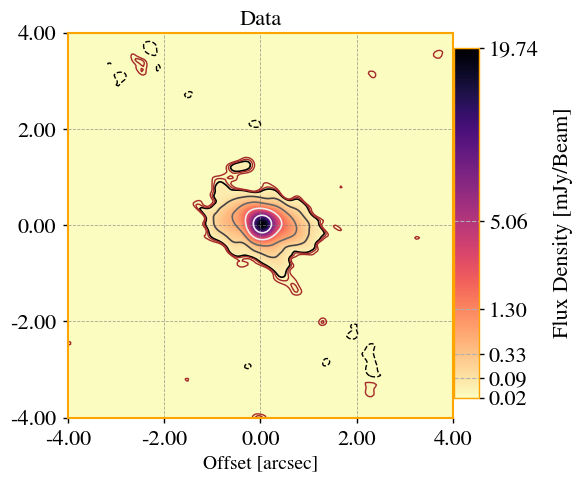

In [40]:
# center = nd.maximum_position(input_data.image_data_2D)
center = (int(smfr.results_fit['f1_x0'][0]),int(smfr.results_fit['f1_y0'][0]))
rms = input_data.rms_res
ax = mlibs.eimshow(input_data.filename,
             crop=False,box_size=150,vmax_factor=1.0,
             vmax=input_data.image_data_2D.max(),rms=rms)
ax.set_title('Data')

Text(0.5, 1.0, 'Diffuse Emission')

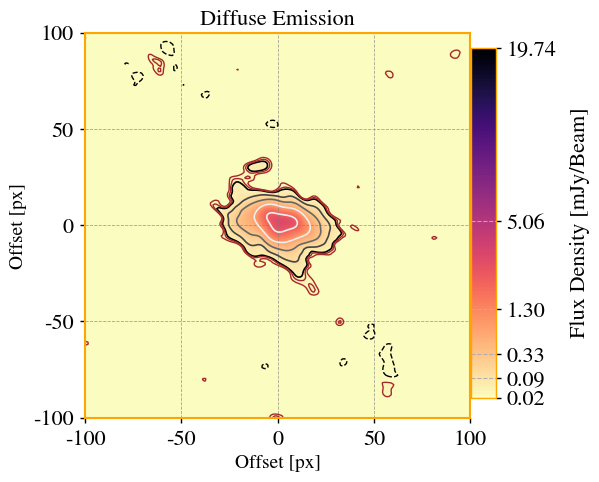

In [41]:
ax = mlibs.eimshow(input_data.image_data_2D- smfr.compact_model,
        crop=False,box_size=150,vmax_factor=1.0,
        rms=rms,vmax=input_data.image_data_2D.max())
ax.set_title('Diffuse Emission')

Text(0.5, 1.0, 'Compact Deconvolved')

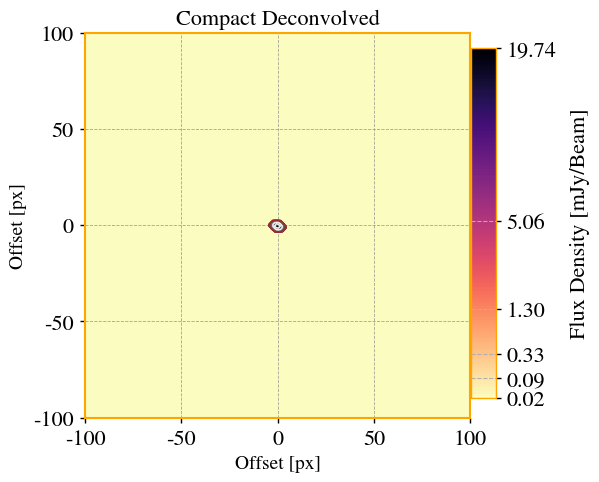

In [42]:
ax=mlibs.eimshow(smfr.models[0]['model_c1'],
           crop=False,box_size=50,rms=rms,
           vmax=input_data.image_data_2D.max())
ax.set_title('Compact Deconvolved')

Text(0.5, 1.0, 'Compact Convolved')

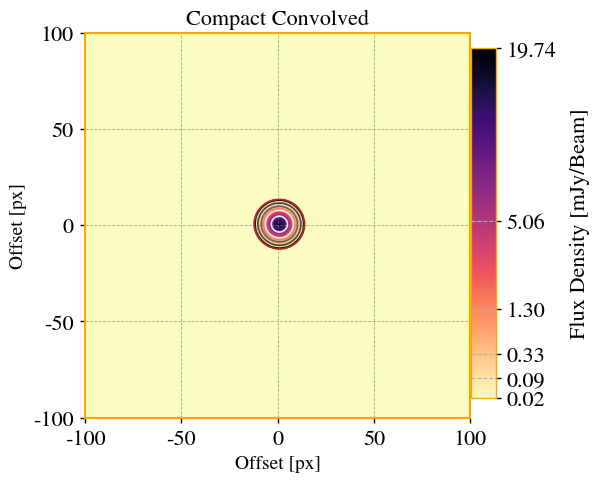

In [43]:
ax=mlibs.eimshow(smfr.models[0]['model_c1_conv'],
           crop=False,box_size=50,rms=rms,
           vmax=input_data.image_data_2D.max())
ax.set_title('Compact Convolved')

Text(0.5, 1.0, 'Model Deconvolved')

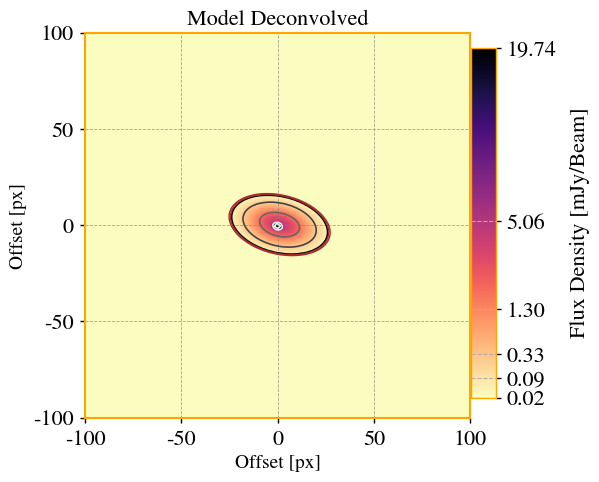

In [44]:
ax=mlibs.eimshow(smfr.models[0]['model_total'],
           crop=False,box_size=150,rms=rms,
           vmax=input_data.image_data_2D.max())
ax.set_title('Model Deconvolved')

Text(0.5, 1.0, 'Model Convolved')

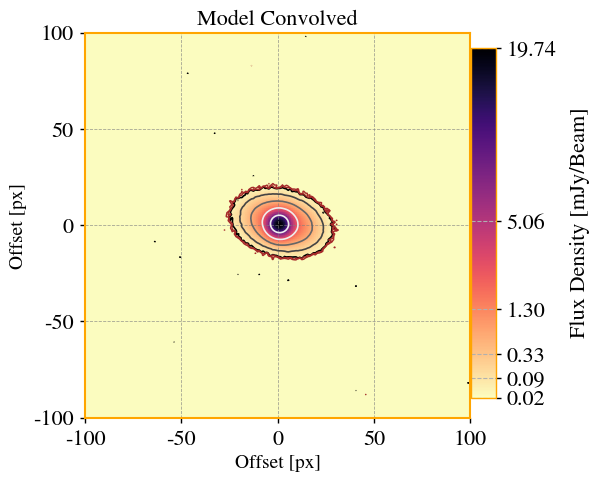

In [45]:
ax=mlibs.eimshow(smfr.models[0]['model_total_conv'],
           crop=False,box_size=150,rms=rms,
           vmax=input_data.image_data_2D.max())
ax.set_title('Model Convolved')

Text(0.5, 1.0, 'Residual')

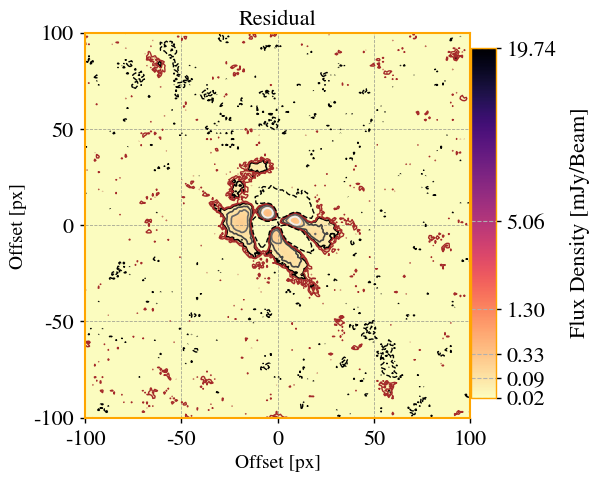

In [46]:
ax = mlibs.eimshow(input_data.image_data_2D- smfr.models[0]['model_total_conv'],
             center=center,
             crop=False,box_size=150,vmax_factor=1.0,vmin_factor=3,
             rms=rms,
             vmax=input_data.image_data_2D.max()
            )
ax.set_title('Residual')

In [48]:
print(f"Total flux density in model = {smfr.results_fit['flux_density_model'][0]:.2f} mJy")
print(f"Total flux density in data = {smfr.results_fit['flux_data'][0]:.2f} mJy")
print(f"Total flux density in residual = {smfr.results_fit['flux_res'][0]:.2f} mJy")


Total flux density in model = 31.16 mJy
Total flux density in data = 31.75 mJy
Total flux density in residual = 0.60 mJy


#### Analysing fit statistics (model parameters)

In [70]:
smfr.lmfit_results[0]

name,value,standard error,relative error,initial value,min,max,vary
f1_x0,99.1547712,0.00710917,(0.01%),99.15481107344361,97.6545805,103.654581,True
f1_y0,98.8198574,0.01901176,(0.02%),98.81960698703371,97.2831523,103.283152,True
f1_PA,-14.5035215,2.35624617,(16.25%),-14.523416670659438,-102.044618,77.9553821,True
f1_ell,0.33317574,0.03052518,(9.16%),0.3336328173560053,0.04287588,0.42875877,True
f1_n,0.50932160,0.46018567,(90.35%),0.5057872169672614,0.49000000,0.51000000,True
f1_In,0.18943934,0.06685583,(35.29%),0.1888559178439399,7.7759e-05,3.88796912,True
f1_Rn,1.06371821,0.17272313,(16.24%),1.068234679622974,0.27504501,8.25135027,True
f1_cg,-0.00951834,0.56088047,(5892.63%),-0.0029441264787140172,-0.01000000,0.01000000,True
f2_x0,100.271620,0.01216987,(0.01%),100.27218291854926,50.6545805,150.654581,True
f2_y0,99.5661501,0.00774095,(0.01%),99.56627155065075,50.2831523,150.283152,True


### Check decomposition results: Compact vs Extended
Now, we can investigate the integrated fluxes between core-compact structures in relation to diffuse ones. 

Note that we consider that the diffuse flux density is the sum between the flux density from the extended model component and the flux density of the residual map.

In [55]:
print(f"Total flux in compact = {smfr.results_fit['flux_density_compact'][0]:.2f} mJy")
print(f"Total flux in extended = {smfr.results_fit['flux_density_extended_model'][0] + smfr.results_fit['flux_res'][0]:.2f} mJy")

# The total flux density in the diffuse regions are saved in:
print(f"Total flux in extended (alternative computation) = {smfr.results_fit['flux_density_ext2'][0]:.2f} mJy")


Total flux in compact = 17.64 mJy
Total flux in extended = 14.12 mJy
Total flux in extended (alternative computation) = 14.12 mJy


In the above output, `flux_density_ext2` represents an alternative way to compute the total flux density. 
This is calculated using the model itself to create a mask above $6\sigma$ and then summing the flux density within this mask.
The traditional way (`flux_density_extended_model`) uses the mask from the data itself, and then sum the flux density within this mask.

For good quality images, both methods should give similar results. For noisy images, they diverge, and the `flux_density_extended_model` method is more reliable.


### Physical Sizes of the components
For completeness, we calculate convolved and deconvolved physical properties. 
The properties of the deconvolved model images, referent to compact structures, are stored inside `smfr.results_compact_deconv_morpho`, while properties of convolved model images for compact structures in `smfr.results_compact_conv_morpho`. 

Similarly, we have for the extended structures: `smfr.results_ext_deconv_morpho` and `smfr.results_ext_conv_morpho`. 

Each one of these measurements stores the same quantities that were calculated with `radio_image_analysis` previously, for the full radio emission, but now for individual model components. 

In [57]:
# list(smfr.results_compact_conv_morpho.keys())

If you have provided the redshift of the source during the minimisation, the physical sizes can be accessed with:

In [63]:
print(f"1px = {smfr.results_compact_conv_morpho['pix_to_pc'][0]} pc")

1px = 32.1803902504463 pc


If not, you can use the following to calculate the physical sizes.

In [64]:
# Lets calculate the pixel size in physical units (pc).
print(f"Redshift of UGC5101 = {mlibs.find_z_NED('UGC5101')}")
pix_to_pc = mlibs.pixsize_to_pc(z=mlibs.find_z_NED('UGC5101'),
                          cell_size=mlibs.get_cell_size(input_data.filename))
print(f"1 px = {pix_to_pc:.2f} pc")

Redshift of UGC5101 = 0.039367
1 px = 32.18 pc


#### Compact Components
First, let's analyse the results for our compact model(s)/structure(s).
The minimisation results object `smfr` stores three distinct results.
1. A data array containing information of all minimisation parameters: `smfr.fit_results`. This contains the best-fit parameters and standard errors (when possible). The sizes of each model component are labelled as `f1_Rn`, `f2_Rn`, etc, where the index represents the ID of the model component.
2. Four dictionaries, containing the statistical results for the sum of all:
    - Deconvolved compact structures: `smfr.results_compact_deconv_morpho`
    - Convolved compact structures: `smfr.results_compact_conv_morpho`
    - Deconvolved extended structures: `smfr.results_ext_deconv_morpho`
    - Convolved extended structures: `smfr.results_ext_conv_morpho`
    
    Note that they represent the sum of all model components in each case. So, if your model has 3 components compact components, the results will be the sum of all 3 components for sizes, fluxes densities, etc. However, these sizes may not be reliable. 
3. To workaround the last issue, we also provide two data arrays, containing the physical properties of each model component fitted to the data (convolved and deconvolved):
    - `smfr.components_conv_props`
    - `smfr.components_deconv_props`
    
    These arrays contain the physical properties of each model component, and are more reliable than the previous ones, as we can get statistical information of each model component.

Lets check the physical properties from the fitting parameters.

In [83]:
# The effective radius in terms of the Sersic Rn parameter.
# This is a deconvolved quantity.
print(f"#############################")
print(f"Component 1 (in this case, the compact component)")
print(f"-----------------------------")
print(f"Rn ={smfr.results_fit['f1_Rn'][0] * pix_to_pc : .0f} pc")
print(f"In ={smfr.results_fit['f1_In'][0]} Jy/beam")
print(f"q (axis ratio) ={1-smfr.results_fit['f1_ell'][0]}")
print(f"-----------------------------")
print(f"#############################")
print(f"Component 2 (in this case, the diffuse component)")
print(f"Rn ={smfr.results_fit['f2_Rn'][0] * pix_to_pc : .0f} pc")
print(f"In ={smfr.results_fit['f2_In'][0]} Jy/beam")
print(f"q (axis ratio) ={1-smfr.results_fit['f2_ell'][0]}")

#############################
Component 1 (in this case, the compact component)
-----------------------------
Rn = 34 pc
In =0.18943933650914843 Jy/beam
q (axis ratio) =0.6668242589301147
-----------------------------
#############################
Component 2 (in this case, the diffuse component)
Rn = 297 pc
In =0.0022129418989838452 Jy/beam
q (axis ratio) =0.5712412273296836


We can also get the derived properties from the model images.

In [84]:
print(f"#############################")
print(f"Component 1 (in this case, the compact component)")
print(f"-----------------------------")
# The deconvolved effective radius measured in the deconvolved model image. 
print(f"Deconv R50 ={smfr.results_compact_deconv_morpho['C50radii'][0] * pix_to_pc : .0f} pc")
# The convolved effective radius measured in the convolved model image. 
print(f"Conv R50 ={smfr.results_compact_conv_morpho['C50radii'][0] * pix_to_pc : .0f} pc")
# The deconvolved effective radius measured in the deconvolved model image. 
print(f"Deconv R95 ={smfr.results_compact_deconv_morpho['C95radii'][0] * pix_to_pc : .0f} pc (full estimated size)")
# The convolved effective radius measured in the convolved model image. 
print(f"Conv R95 ={smfr.results_compact_conv_morpho['C95radii'][0] * pix_to_pc : .0f} pc (full estimated size)")

#############################
Component 1 (in this case, the compact component)
-----------------------------
Deconv R50 = 26 pc
Conv R50 = 133 pc
Deconv R95 = 103 pc (full estimated size)
Conv R95 = 301 pc (full estimated size)


In [85]:
print(f"#############################")
print(f"Component 2 (in this case, the extended component)")
print(f"-----------------------------")
# The deconvolved effective radius measured in the deconvolved model image. 
print(f"Deconv R50 ={smfr.results_ext_deconv_morpho['C50radii'][0] * pix_to_pc : .0f} pc")
# The convolved effective radius measured in the convolved model image. 
print(f"Conv R50 ={smfr.results_ext_conv_morpho['C50radii'][0] * pix_to_pc : .0f} pc")
# The deconvolved effective radius measured in the deconvolved model image. 
print(f"Deconv R95 ={smfr.results_ext_deconv_morpho['C95radii'][0] * pix_to_pc : .0f} pc (full estimated size)")
# The convolved effective radius measured in the convolved model image. 
print(f"Conv R95 ={smfr.results_ext_conv_morpho['C95radii'][0] * pix_to_pc : .0f} pc (full estimated size)")

#############################
Component 2 (in this case, the extended component)
-----------------------------
Deconv R50 = 230 pc
Conv R50 = 268 pc
Deconv R95 = 520 pc (full estimated size)
Conv R95 = 606 pc (full estimated size)


Lets investivate the statistical information of individual components, irrespective if they are compact or extended.

In [89]:
components_conv_props_df = mlibs.pd.DataFrame(smfr.components_conv_props[0]).T
components_deconv_props_df = mlibs.pd.DataFrame(smfr.components_deconv_props[0]).T

In [91]:
components_deconv_props_df

,peak_of_flux,total_flux,inner_flux,low_flux,mid_flux,uncertain_flux,inner_flux_f,low_flux_f,mid_flux_f,uncertain_flux_f,...,arcsec_to_pc,bmaj_pc,bmin_pc,BA_pc,pix_to_pc,cell_size,area_beam_2Rp,area_beam_R50,comp_ID,model_file
model_c_deconv_1_props,0.330533,0.017639,0.016247,0.0,0.001387,0.000005,0.921084,0.0,0.078632,0.000284,...,211.757153,68.978289,68.978289,5391.247345,8.470286,0.04,0.445436,0.111359,1,selfcal_image_UGC05101.calibrated.avg12s_trial...
model_c_deconv_2_props,0.004391,0.01352,0.012126,0.000055,0.001272,0.000067,0.896924,0.004055,0.094099,0.004921,...,211.757153,68.978289,68.978289,5391.247345,8.470286,0.04,9.547149,2.386787,2,selfcal_image_UGC05101.calibrated.avg12s_trial...


In [92]:
components_conv_props_df

,peak_of_flux,total_flux,inner_flux,low_flux,mid_flux,uncertain_flux,inner_flux_f,low_flux_f,mid_flux_f,uncertain_flux_f,...,arcsec_to_pc,bmaj_pc,bmin_pc,BA_pc,pix_to_pc,cell_size,area_beam_2Rp,area_beam_R50,comp_ID,model_file
model_c_conv_1_props,0.016663,0.017635,0.015983,0.000001,0.001649,0.000002,0.906335,0.000047,0.093519,0.000099,...,211.757153,68.978289,68.978289,5391.247345,8.470286,0.04,4.101967,1.025492,1,selfcal_image_UGC05101.calibrated.avg12s_trial...
model_c_conv_2_props,0.003191,0.013516,0.012133,0.000005,0.001376,0.000003,0.897625,0.000333,0.101837,0.000204,...,211.757153,68.978289,68.978289,5391.247345,8.470286,0.04,13.274668,3.318667,2,selfcal_image_UGC05101.calibrated.avg12s_trial...


### Compute SFR Estimates for Diffuse Structures and the Brightness Temperature
For star formation rates, some assumptions are made, as discussed in the paper. 

Here, we take just an approximation, since we are using only one frequency. 
But we are interested in the amount of energy that is coming from diffuse structures, and try to translate that to SFR.

We use the fitting results to compute the SFR. Within `smfr`, information is stored regarding the total flux density in the extended structures (`'flux_density_ext2'`) and the sizes.

The class `radio_star_formation` from `morphen` deals with the calculations, provided the object `smfr`. Note also that you need to provide the redshift of the galaxy. 

In [95]:
SFR = mp.radio_star_formation(input_data,smfr,z=mlibs.find_z_NED('UGC5101'))

2024-02-06 01:10:45 - INFO - Using frequency of 10.00 GHz for star formation estimate.
2024-02-06 01:10:45 - INFO - +-----------------+
2024-02-06 01:10:45 - INFO - | SFR Estimates |
2024-02-06 01:10:45 - INFO - +-----------------+
2024-02-06 01:10:45 - INFO -  ==> SFR =133.73 +/- 5.90 Mo/yr
2024-02-06 01:10:45 - INFO - +------------------+
2024-02-06 01:10:45 - INFO - | sSFR Estimates |
2024-02-06 01:10:45 - INFO - +------------------+
2024-02-06 01:10:45 - INFO -  >=> Deconvolved A50 sSFR = 807.12 Mo/(yr kpc^2)
2024-02-06 01:10:45 - INFO -  >=> Convolved A50 sSFR = 592.38 Mo/(yr kpc^2)
2024-02-06 01:10:45 - INFO -  >=> Deconvolved A95 sSFR = 157.30 Mo/(yr kpc^2)
2024-02-06 01:10:45 - INFO -  >=> Convolved A95 sSFR = 115.92 Mo/(yr kpc^2)
2024-02-06 01:10:45 - INFO - +--------------------------+
2024-02-06 01:10:45 - INFO - | Brightness Temperature |
2024-02-06 01:10:45 - INFO - +--------------------------+
2024-02-06 01:10:45 - INFO -  ==> TB Rn Fit = 0.68 e5 K
2024-02-06 01:10:45 - I

### Estimating the brightness temperatures for all model components

The brightness temperature is calculated using the formula:
$$
T_b = \frac{2 \ln 2}{\pi k_B} \frac{c^{2} (1+z)}{\phi_{\rm maj} \phi_{\rm min}} \frac{S_\nu}{\nu^2}
$$
where $k_B$ is the Boltzmann constant, $z$ the redshift and $\phi_{\rm maj}$, $\phi_{\rm min}$ are the deconvolved semi-major and minor axis of the source.

We are going to use the circular radii approximation, obtained from every deconvolved component. These cicular radii, `C50radii` are derived from the area $A_{50}$, $C_{50} = \sqrt{A_{50}/\pi}$. The conversion from $C_{50}$ to $(\phi_{\rm maj},\phi_{\rm min})$ is given by:
$$
\phi_{\rm min} = 2 C_{50} (1 - e) = 2 C_{50} q
$$
$$
\phi_{\rm maj} = 2 C_{50}
$$
where the axis ratio $q$ is assessed from `components_deconv_props_df['qmo']`.

In [115]:
components_deconv_props_df['qmo']

model_c_deconv_1_props    0.656603
model_c_deconv_2_props    0.576983
Name: qmo, dtype: object

In [107]:
components_deconv_props_df['total_flux_mask']

model_c_deconv_1_props    0.017636
model_c_deconv_2_props    0.013521
Name: total_flux_mask, dtype: object

In [104]:
theta1_R50fit = 2 * components_deconv_props_df['cell_size'] * components_deconv_props_df['C50radii']
theta2_R50fit = (2 * (1 - components_deconv_props_df['qm']) * components_deconv_props_df['cell_size'] * components_deconv_props_df['C50radii'])

In [109]:

TB_R50fit  = mlibs.Tb_source(Snu=components_deconv_props_df['total_flux_mask'],
                            freq=10, #in GHz
                            theta1=theta1_R50fit, theta2=theta2_R50fit,
                            z=mlibs.find_z_NED('UGC5101'))

In [117]:
print(TB_R50fit,'x 10^5 K')

model_c_deconv_1_props    2.358279
model_c_deconv_2_props    0.018352
dtype: object x 10^5 K



### Performance Notes
For this example, we have run the minimisation in five system configurations. The runing times are:
- GPU (Jax) + i7-13700K (16 cores) --==>> 30 seconds
- CPU Only (no Jax) + i7-13700K (single core) --==>> ~ 300 seconds
- CPU Only (Jax) + i7-3770 (8 cores) --==>> 220 seconds
- CPU Only (no Jax) + i7-3770 (single core) --==>> ~ 600 seconds
- CPU Only (Jax) + threadripper 2990wx (32 cores) --==>> XXX seconds


Note that when using a GPU, these processes are run in a single core mode.


## Example 2: Multi-Sersic Fit with multiple model components.

In [125]:
root_path = '../../data_examples/data_examples_fitting/vla_only/MCG12_C/cb/'
prefix_images = '*MFS-image.fits'
imagelist = mlibs.glob.glob(root_path+prefix_images)
imagelist,residuallist = \
    mlibs.sort_list_by_beam_size(imagelist=imagelist,
                                 return_df = False)


100%|██████████| 5/5 [00:00<00:00, 93.70it/s]

0 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..-0.5-MFS-image.fits
1 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.0-MFS-image.fits
2 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-image.fits
3 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..1.0-MFS-image.fits
4 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..2.0-MFS-image.fits


In [126]:
residuallist

array(['../../data_examples/data_examples_fitting/vla_only/MCG12_C/cb/final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..-0.5-MFS-residual.fits',
       '../../data_examples/data_examples_fitting/vla_only/MCG12_C/cb/final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.0-MFS-residual.fits',
       '../../data_examples/data_examples_fitting/vla_only/MCG12_C/cb/final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-residual.fits',
       '../../data_examples/data_examples_fitting/vla_only/MCG12_C/cb/final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..1.0-MFS-residual.fits',
       '../../data_examples/data_examples_fitting/vla_only/MCG12_C/cb/final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..2.0-MFS-residual.fits'],
      dtype=object)

In [130]:
# lets select another image from our list of images. 
idx = 2
input_data=mp.read_data(filename=imagelist[idx],
                        residualname=residuallist[idx])

++>> Image File: final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-image.fits
++>> Residual File: final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-residual.fits
-->> No PSF File was provided.


In [131]:
image_data = input_data.image_data_2D
residual_data = input_data.residual_data_2D

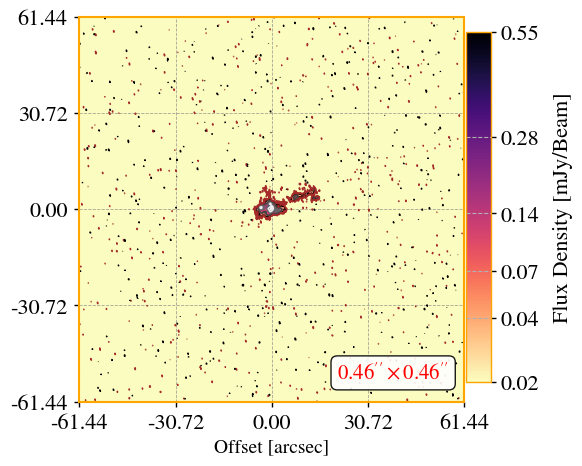

In [132]:
ax=mlibs.eimshow(input_data.filename,add_beam=True,crop=False,box_size=50,
        vmin_factor=3.0,vmax_factor=0.3, #level factor (max from peak, and min from std)
        neg_levels=np.asarray([-3]), # negative contours to draw -- which negative std level?
        CM='magma_r',
       )

[1020 1026    0    0]
00:54:03.995, +73.05.05.320, 5.999e+09Hz, I
00:54:03.995  +73 05 05.320
13.516645833333333 73.08481111111111


<Axes: xlabel='Offset [arcsec]'>

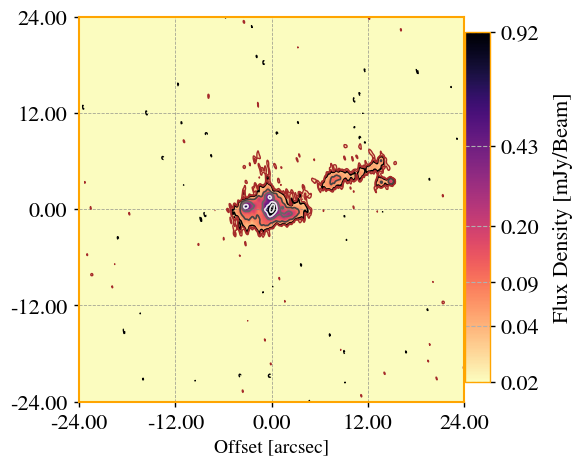

In [133]:
cutout_size = 800
ra,dec,new_filename = mlibs.cutout_2D_radec(imagename=input_data.filename,
                                            residualname=input_data.residualname,
                                            cutout_size = cutout_size,
                                            special_name='')
mlibs.eimshow(new_filename)

In [134]:
for i in mlibs.tqdm(range(len(imagelist))):
    mlibs.cutout_2D_radec(imagename=imagelist[i],
                    residualname=residuallist[i],
                    ra_f=ra,dec_f=dec,
                    cutout_size = cutout_size,
                    special_name='')

100%|██████████| 5/5 [00:00<00:00, 31.81it/s]


In [145]:
prefix_images = '*MFS-image.cutout.fits'
imagelist = mlibs.glob.glob(root_path+prefix_images)
imagelist,residuallist = \
    mlibs.sort_list_by_beam_size(imagelist=imagelist,return_df = False)
    
# lets select another image from our list of images. 
idx = 2 #select one index from the list. 
input_data=mp.read_data(filename=imagelist[idx],
                        residualname=residuallist[idx])
    

100%|██████████| 5/5 [00:00<00:00, 139.94it/s]

0 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..-0.5-MFS-image.cutout.fits
1 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.0-MFS-image.cutout.fits
2 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-image.cutout.fits
3 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..1.0-MFS-image.cutout.fits
4 >> final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..2.0-MFS-image.cutout.fits
++>> Image File: final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-image.cutout.fits
++>> Residual File: final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-residual.cutout.fits
-->> No PSF File was provided.


<Axes: xlabel='Offset [arcsec]'>

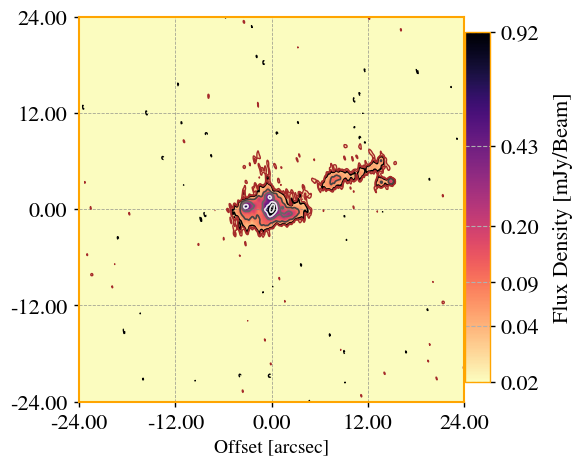

In [146]:
mlibs.eimshow(input_data.filename)

Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
 ==>  Dilation size is 7 [px]


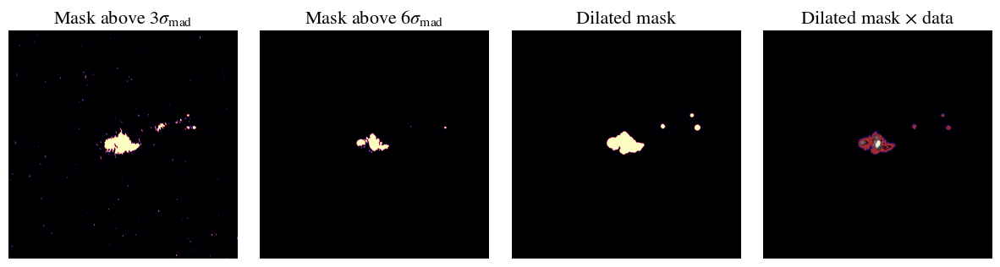

In [147]:
std = mlibs.mad_std(input_data.residual_data_2D)
_, mask = mlibs.mask_dilation(mlibs.ctn(imagelist[0]), PLOT=True,dilation_type='disk',
                        sigma=6, iterations=1, dilation_size=None)

7.590642487575569
INFO: Total number of Sources/Structures (deblended) =  6


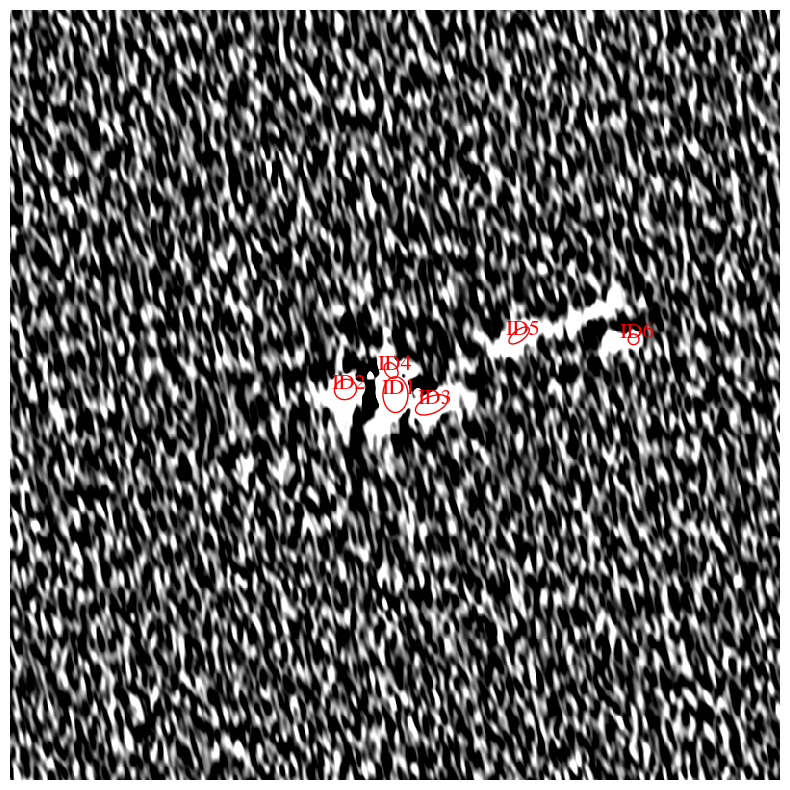

In [154]:
#this is a set of parameters that may work OKAY
bwf, bhf = 1.0, 1.0 # standard value that works for a wide range of images. But, additional check is required!!!!
fwf, fhf = 1.0, 1.0 # standard value that works for a wide range of images. But, additional check is required!!!!
clean_param = 0.5
deblend_cont = 1e-9
sigma = 8
deblend_nthresh = 5
sigma_mask = sigma

# ell_size_factor = 2.5
ell_size_factor = 0.3*mlibs.get_ell_size_factor(psf_current = mlibs.get_beam_size_px(input_data.filename)[0])
SE = mp.source_extraction(input_data, 
                          ell_size_factor = ell_size_factor, sigma = sigma,
                          bwf = bwf,bhf = bhf,fwf = fwf, fhf = fhf,
                          clean_param = clean_param, 
                          deblend_cont = deblend_cont, 
                          deblend_nthresh=deblend_nthresh,minarea_factor=1.0,
                          apply_mask=False,sigma_mask=sigma_mask,
                          show_petro_plots=True,
                          dry_run=True)
# plt.imshow(input_data.image_data_2D)

To demonstrate the flexibility of `morphen` Sersic fitting, we start by assuming that we just want to add an additional 
model component to the source `ID1`, as some diffuse emission is surrounding that structure. Below, we input this information with 
`ids_to_add = ['1']`.

7.590642487575569
INFO: Total number of Sources/Structures (deblended) =  6


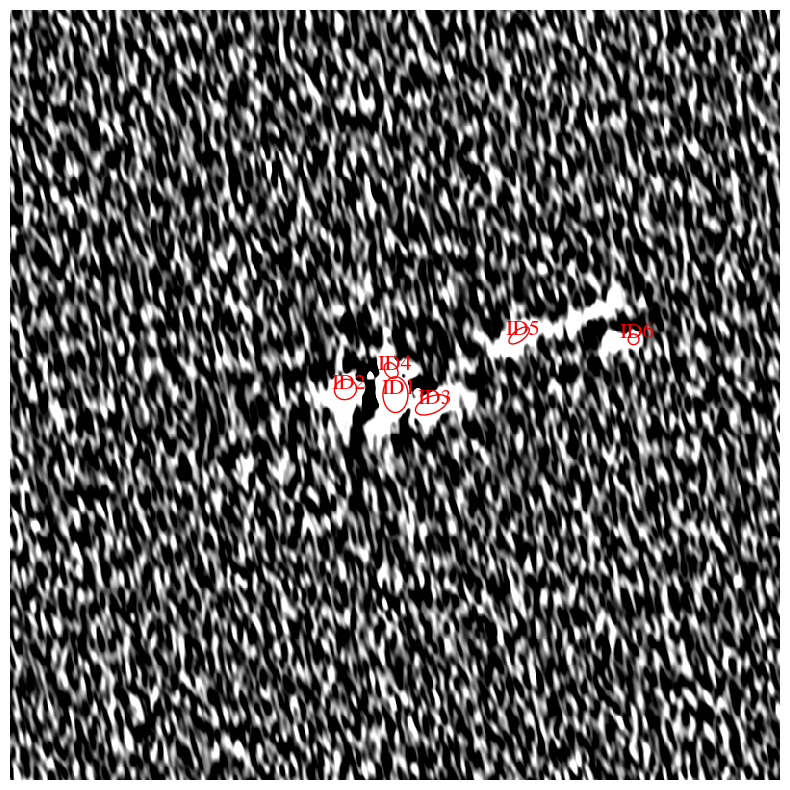

1


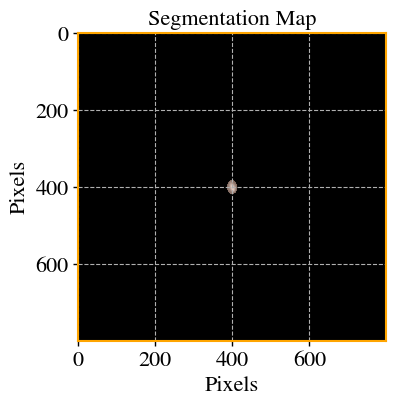

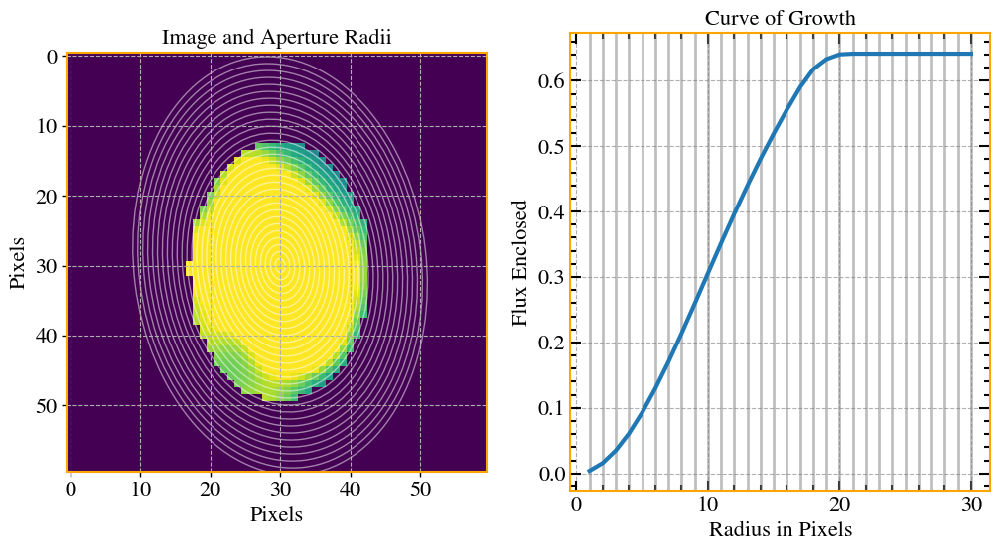

1


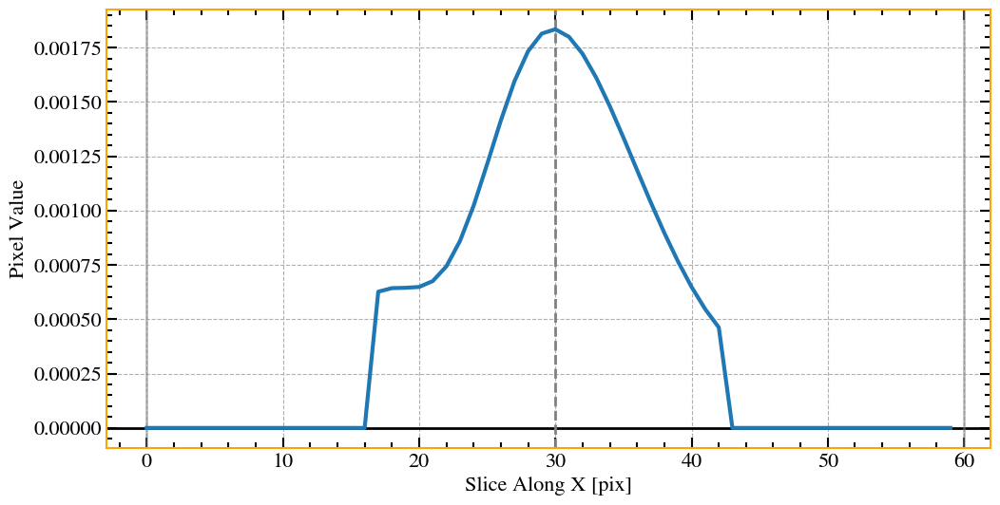

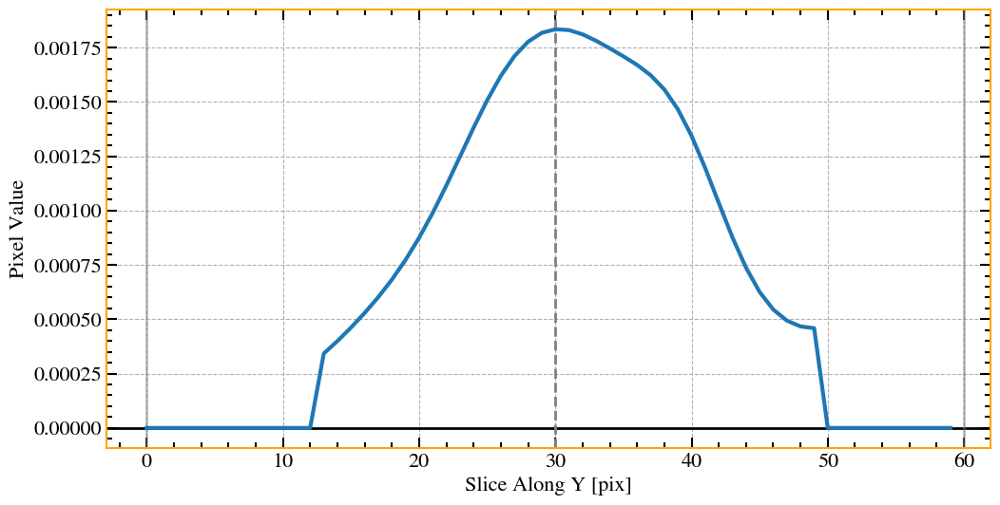

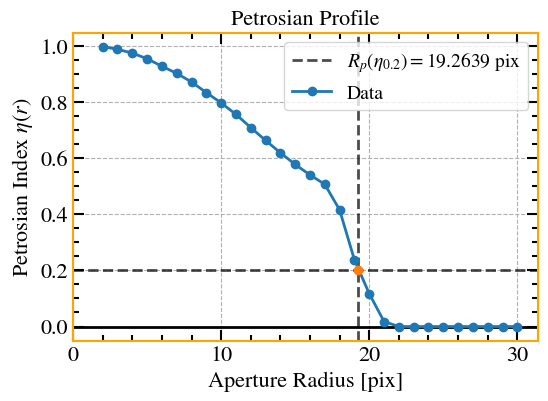

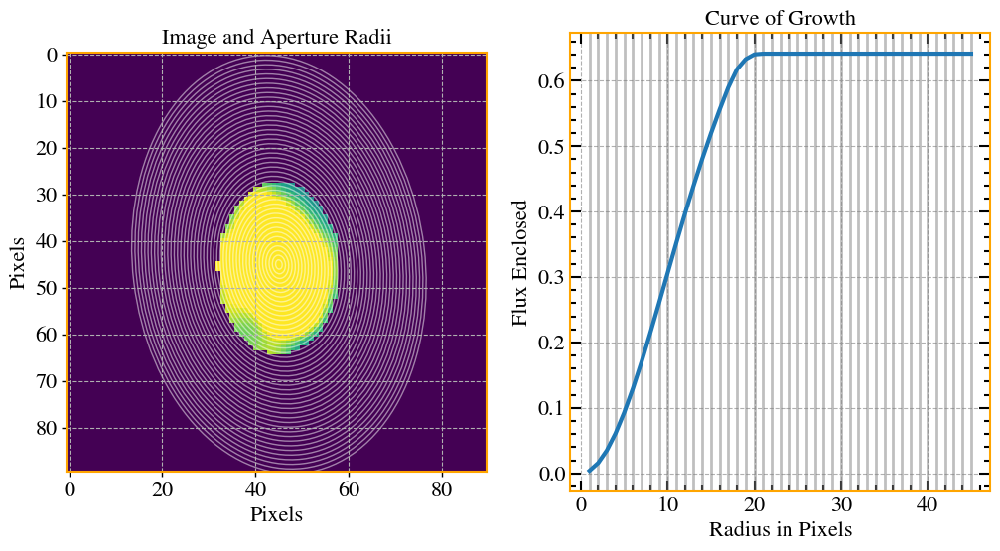

1


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


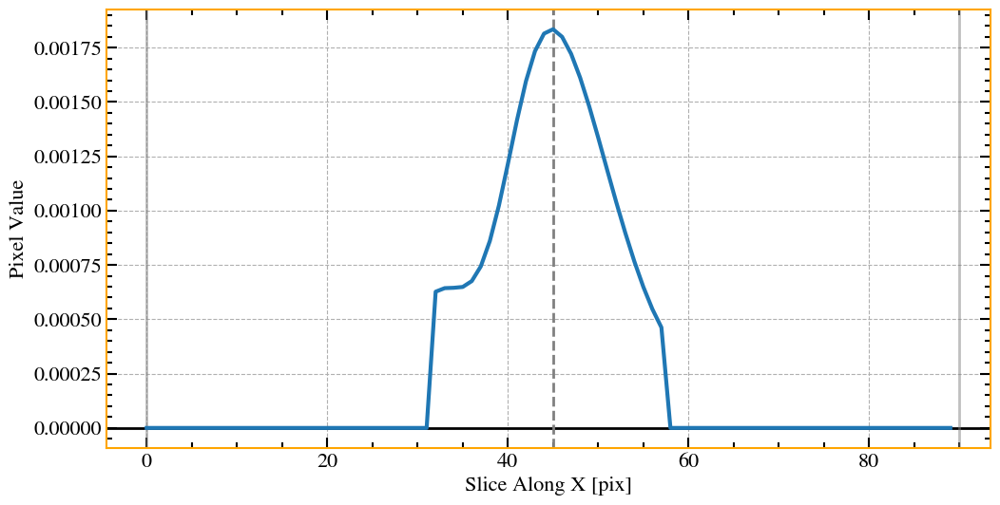

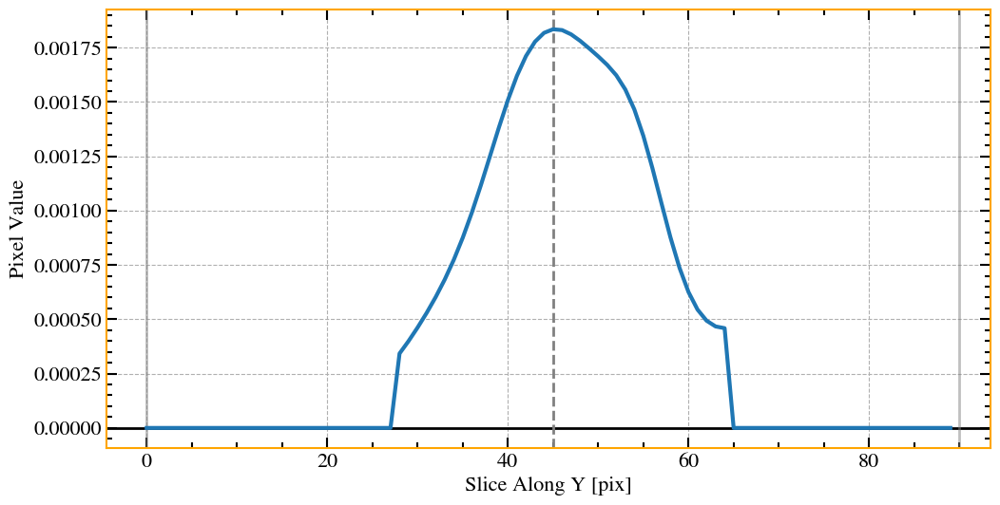

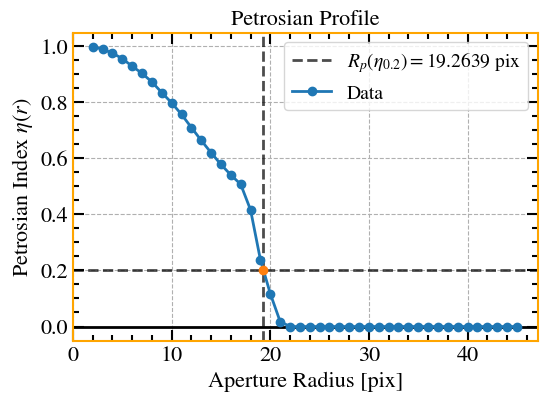

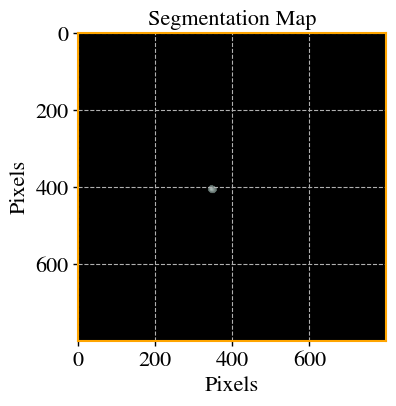

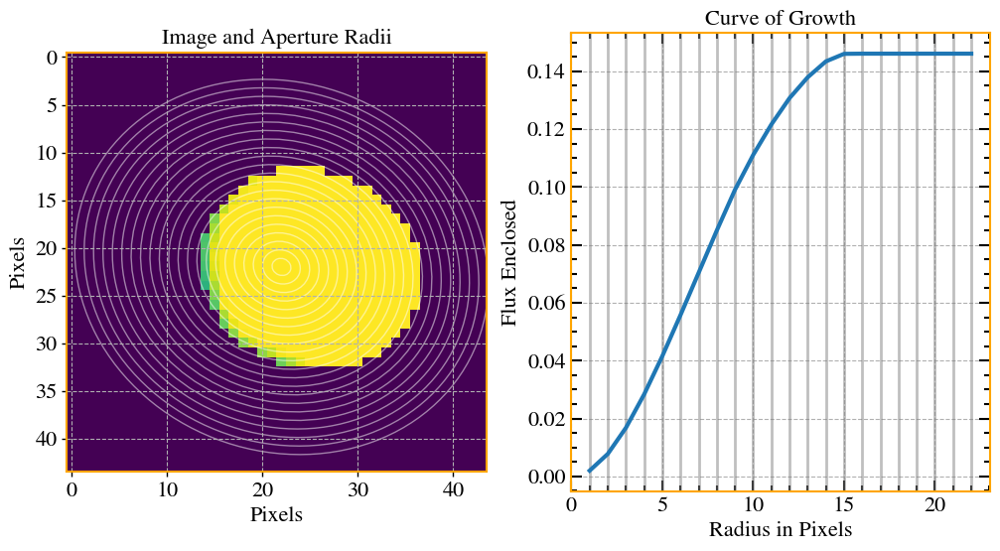

1


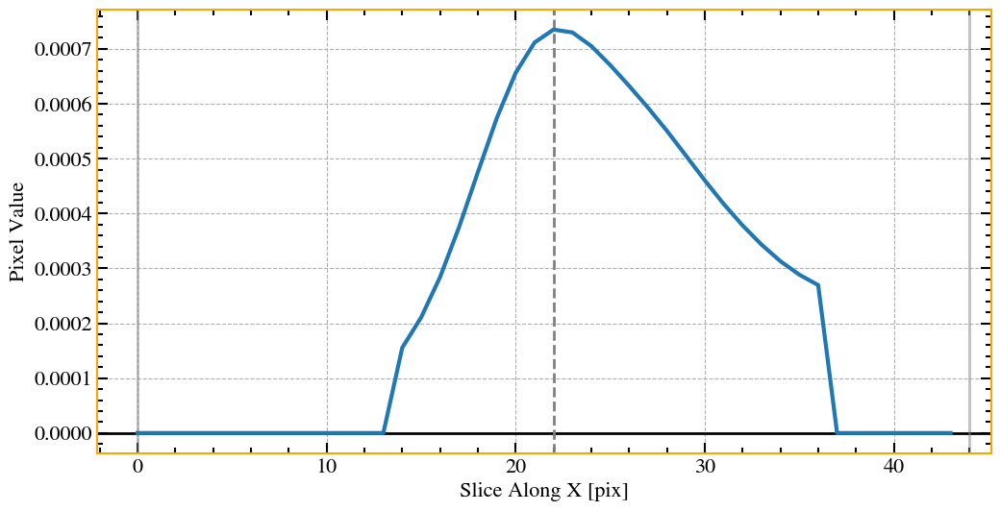

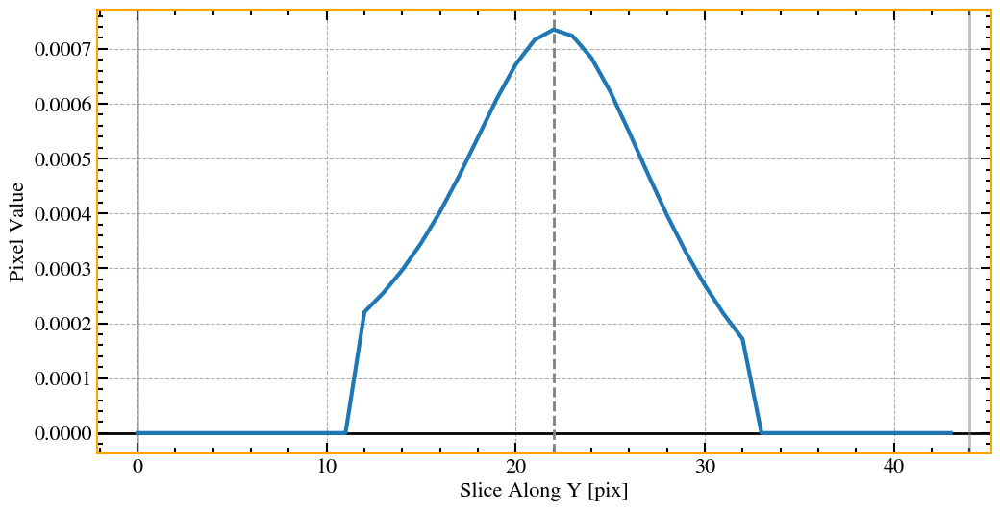

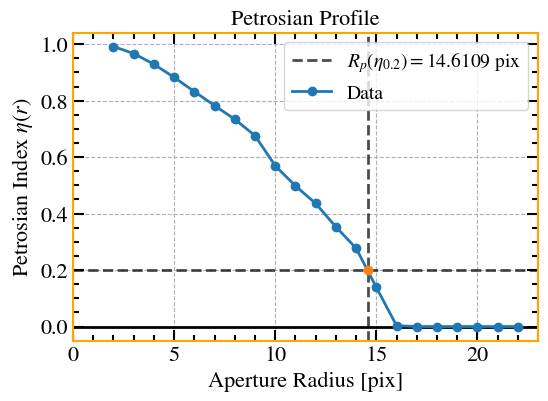

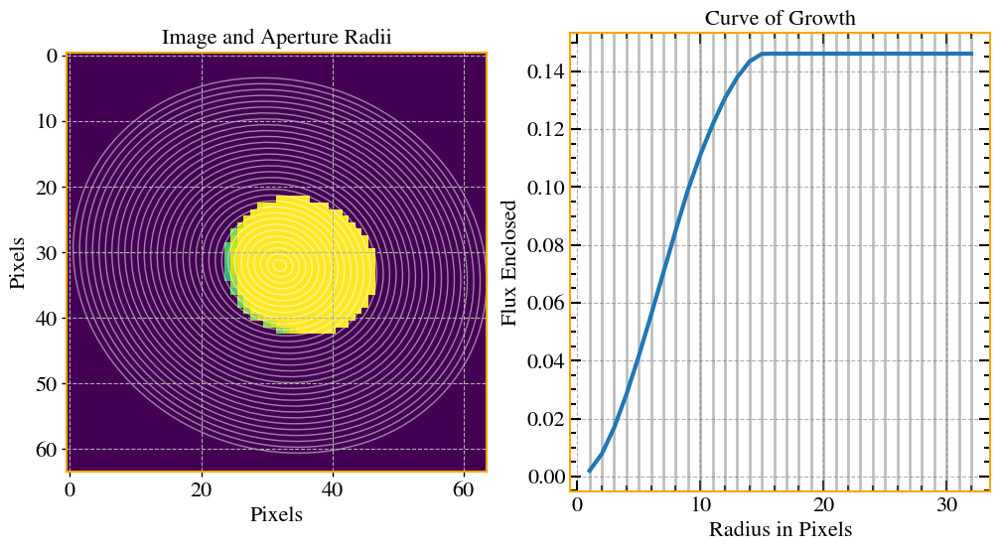

1


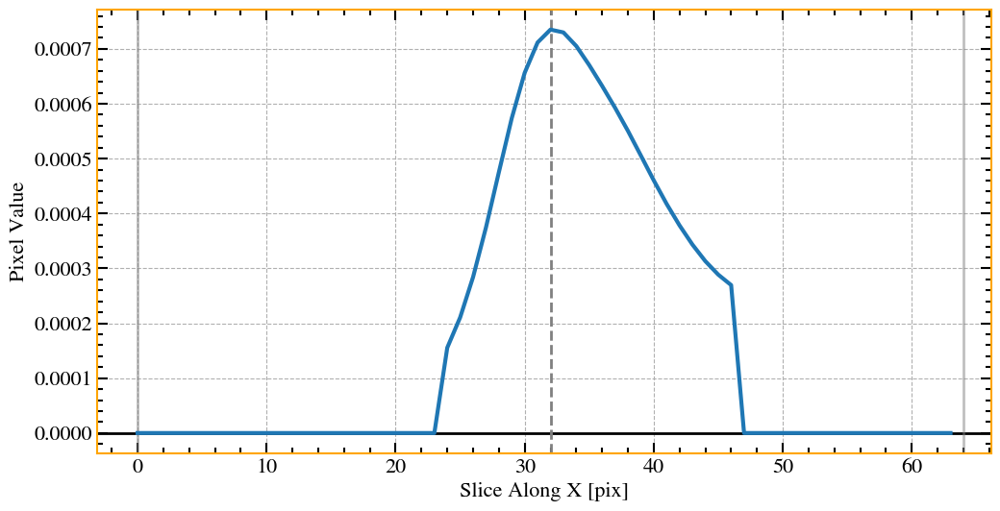

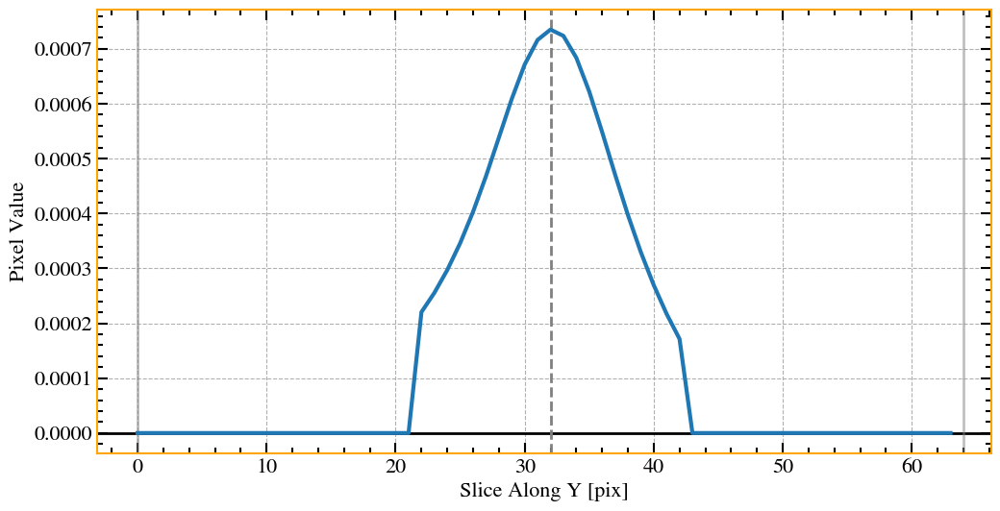

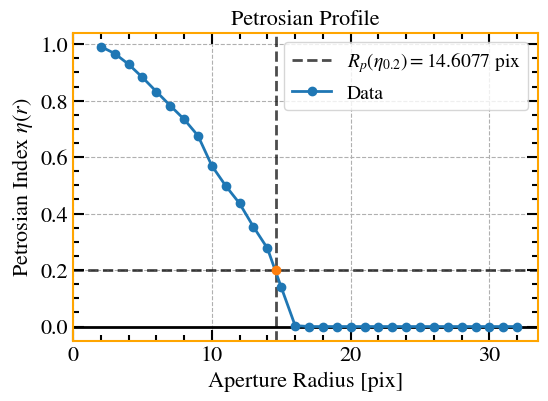

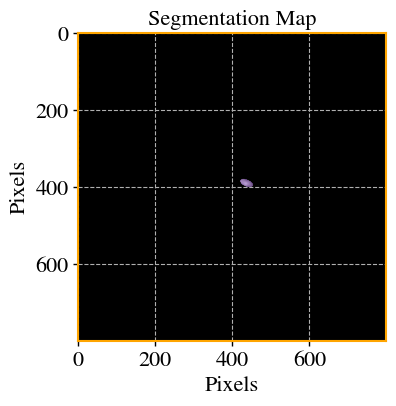

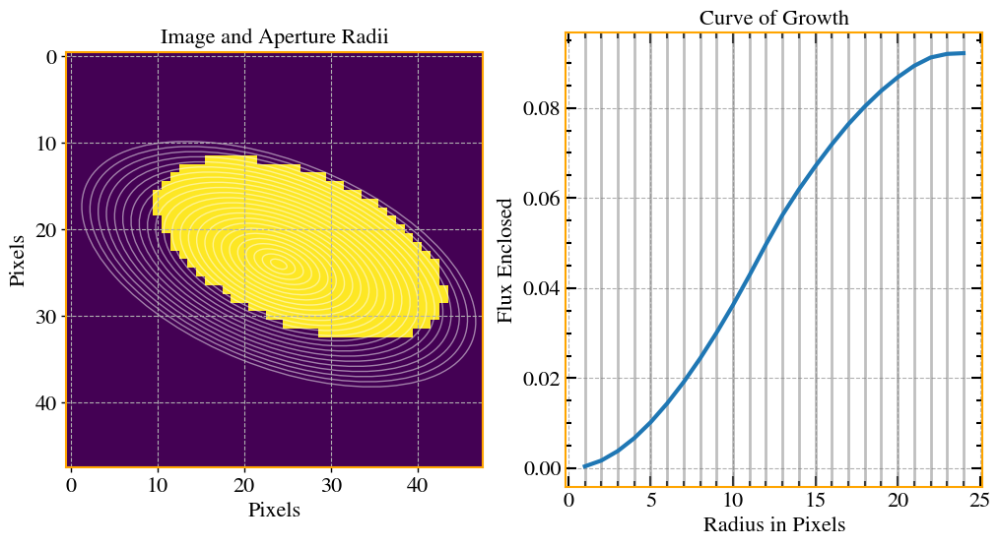

1


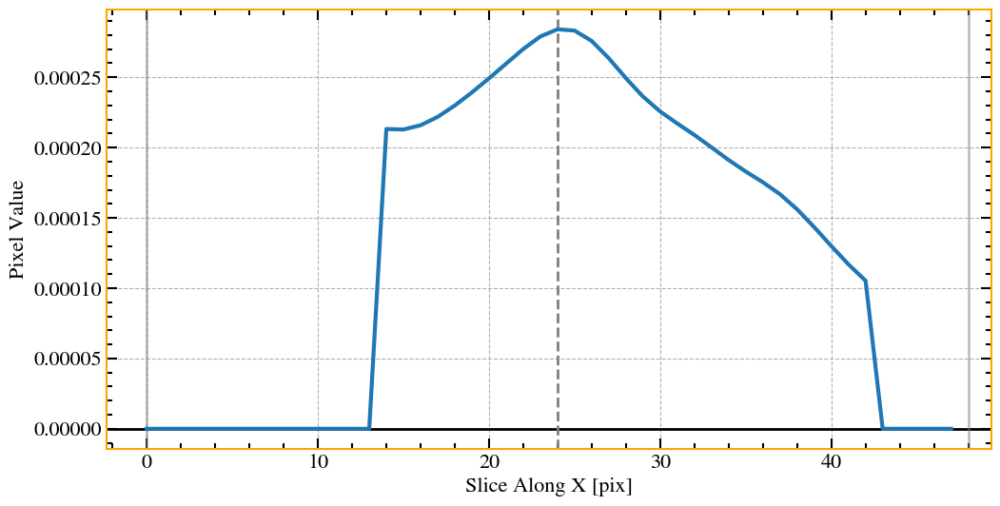

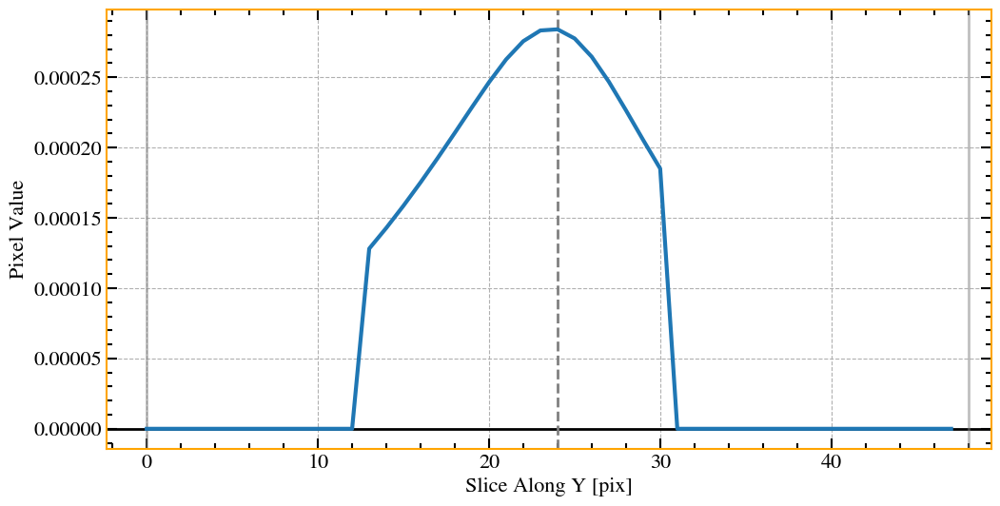

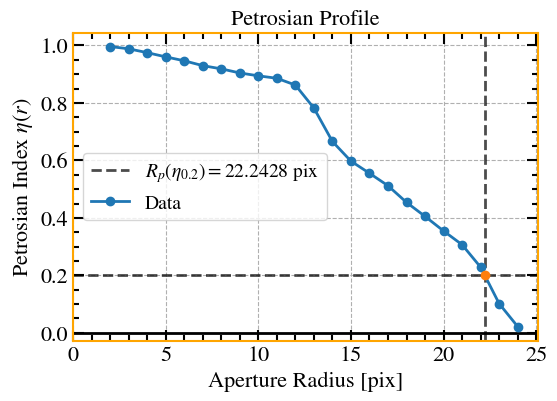

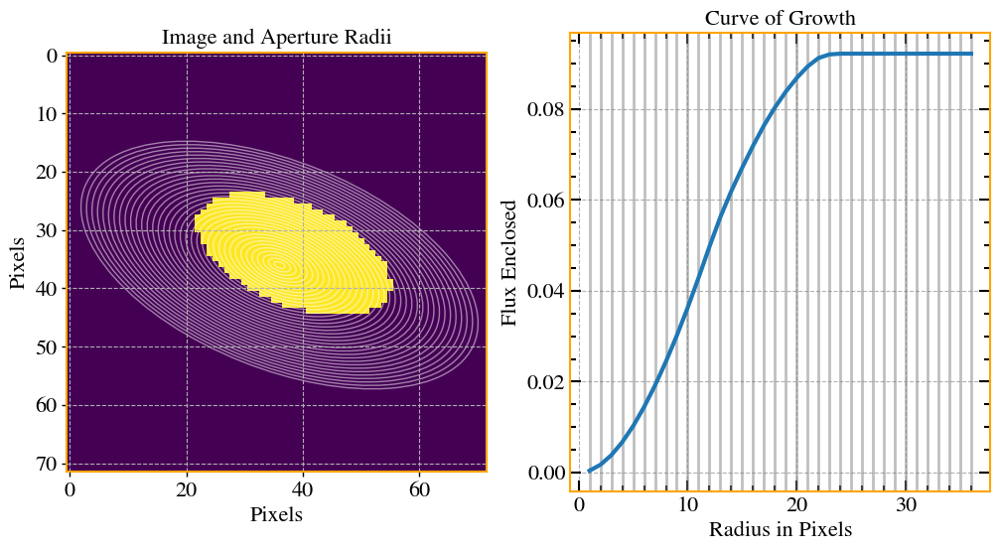

1


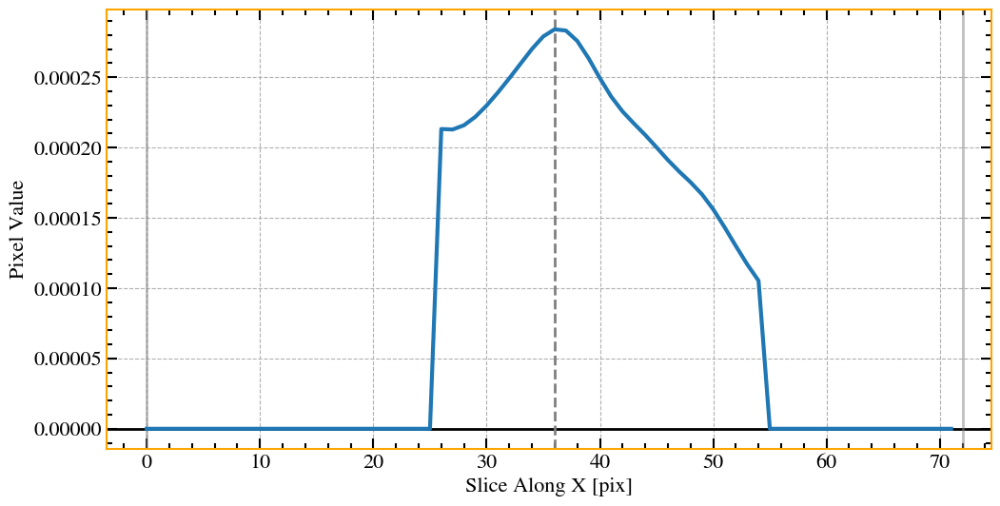

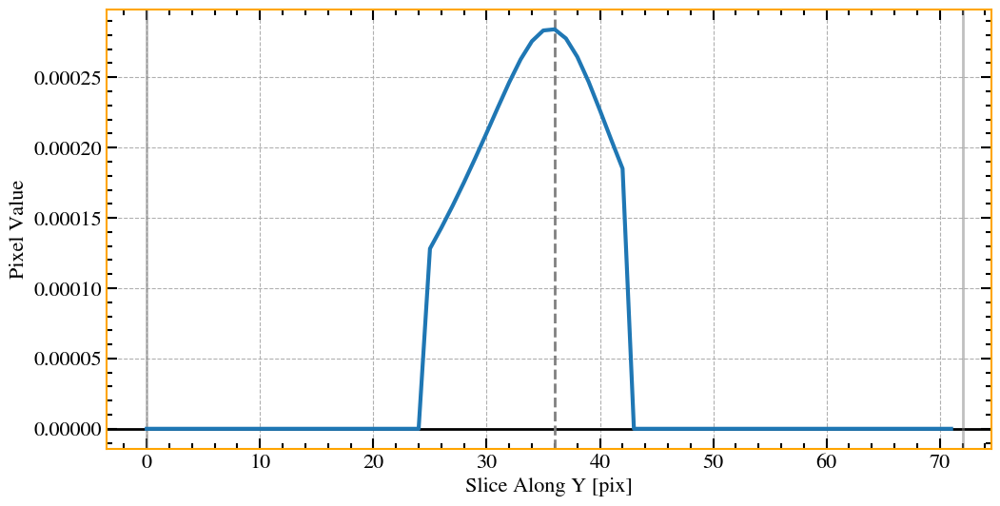

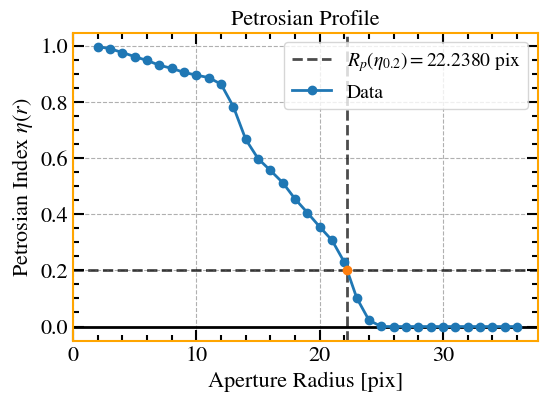

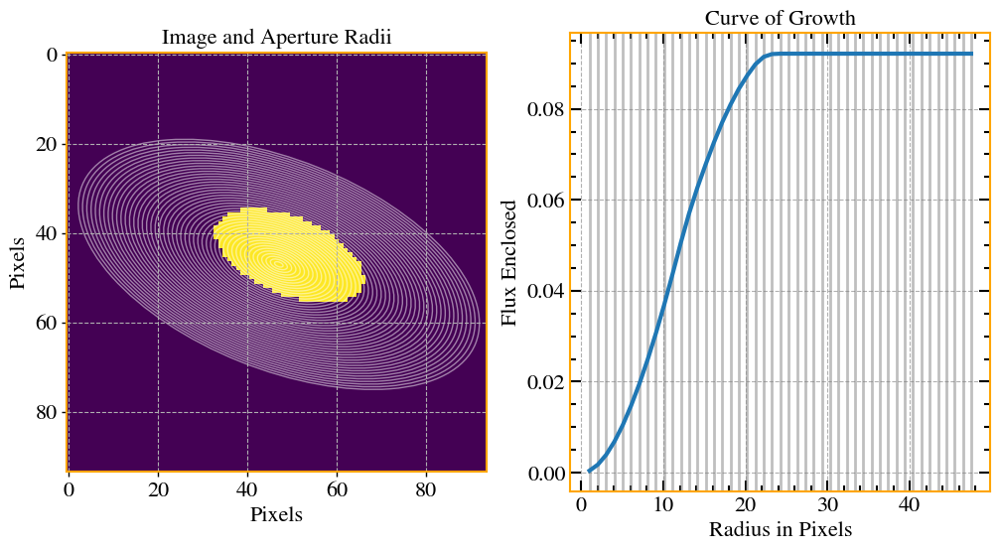

1


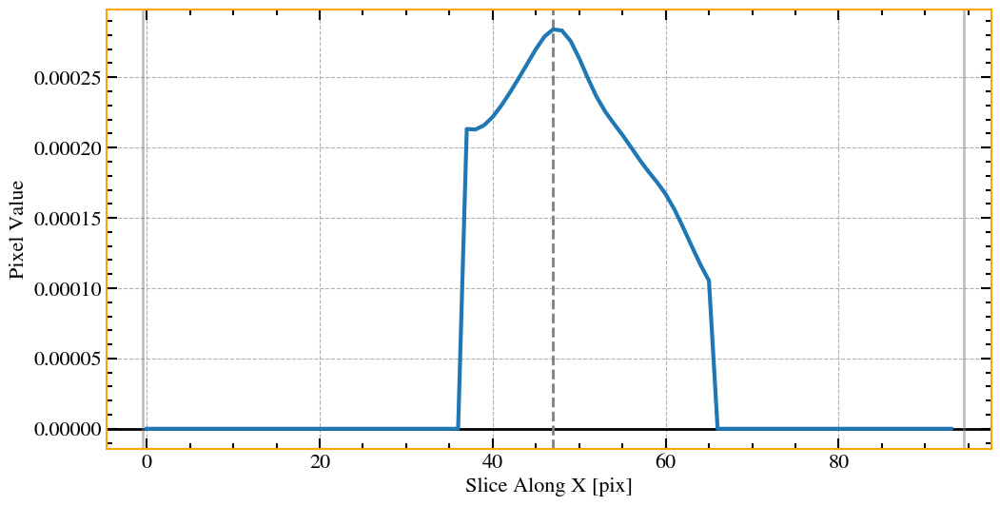

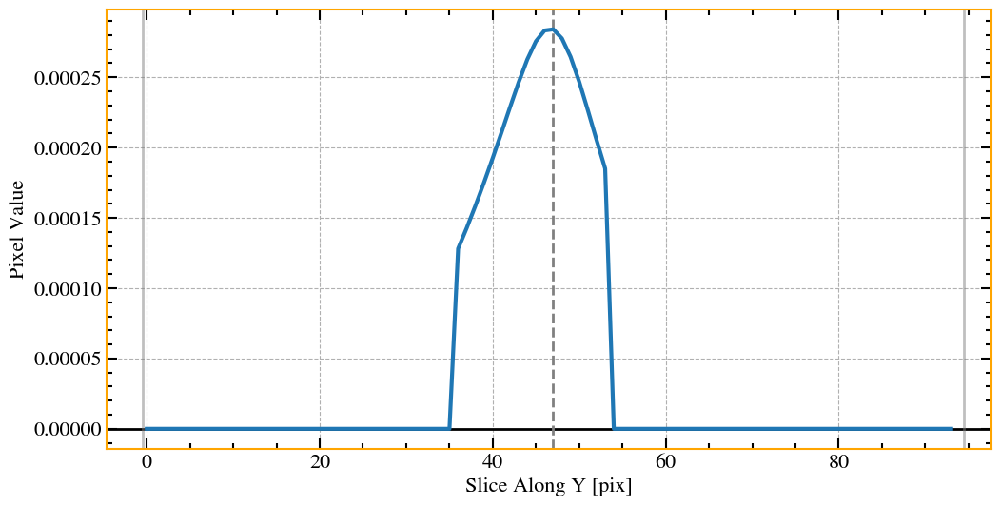

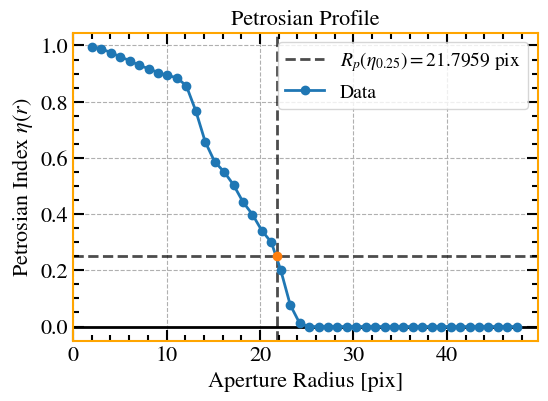

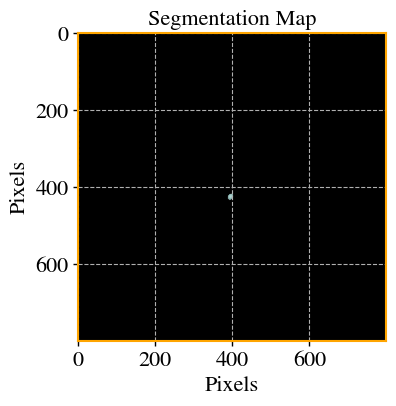

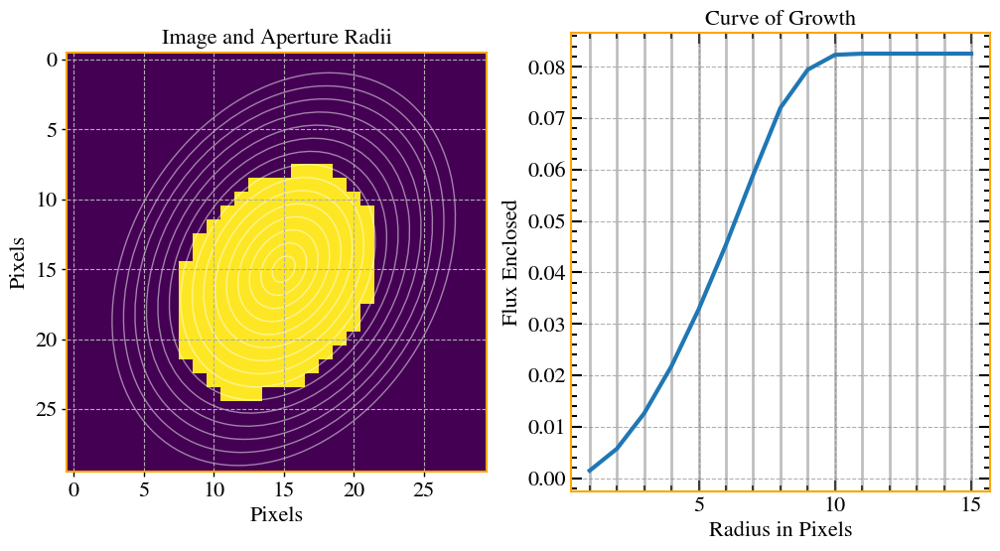

1


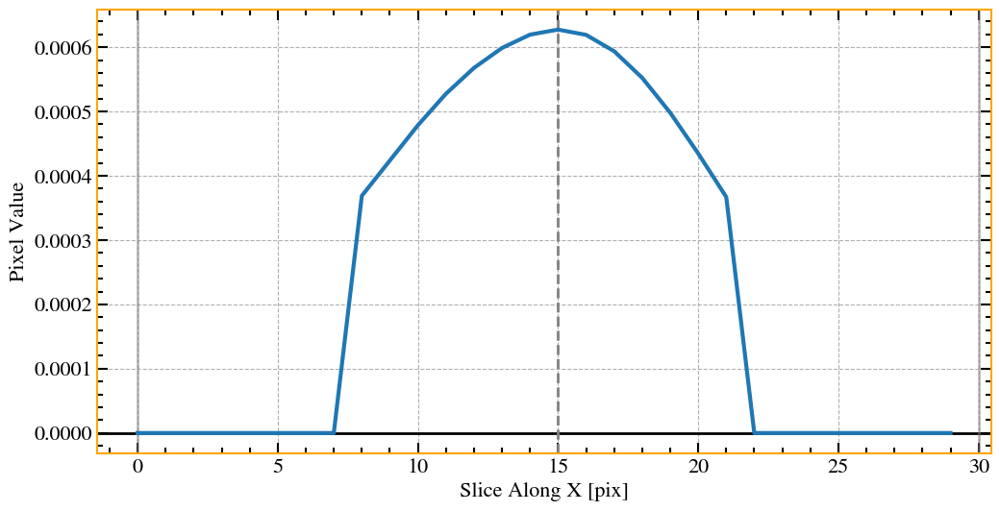

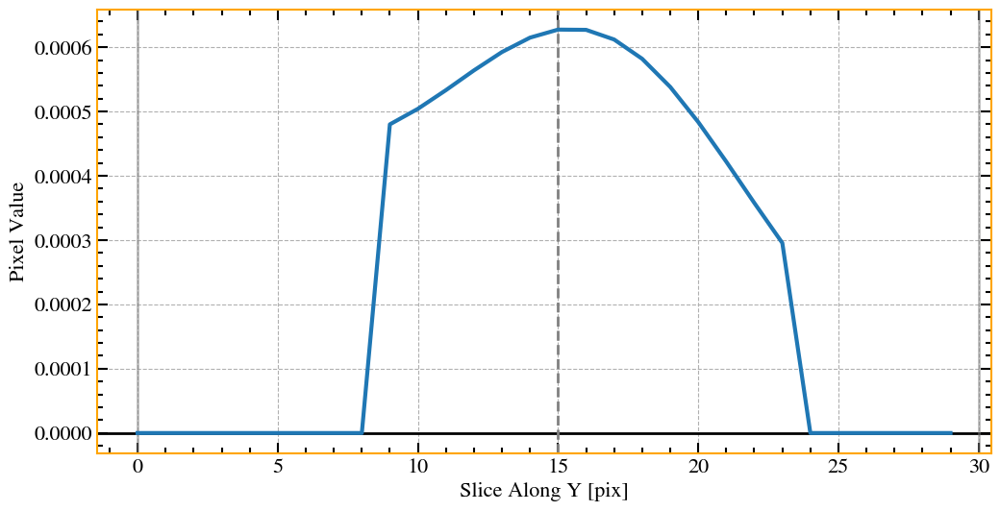

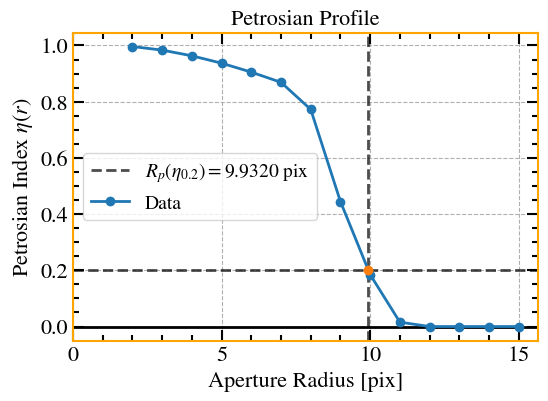

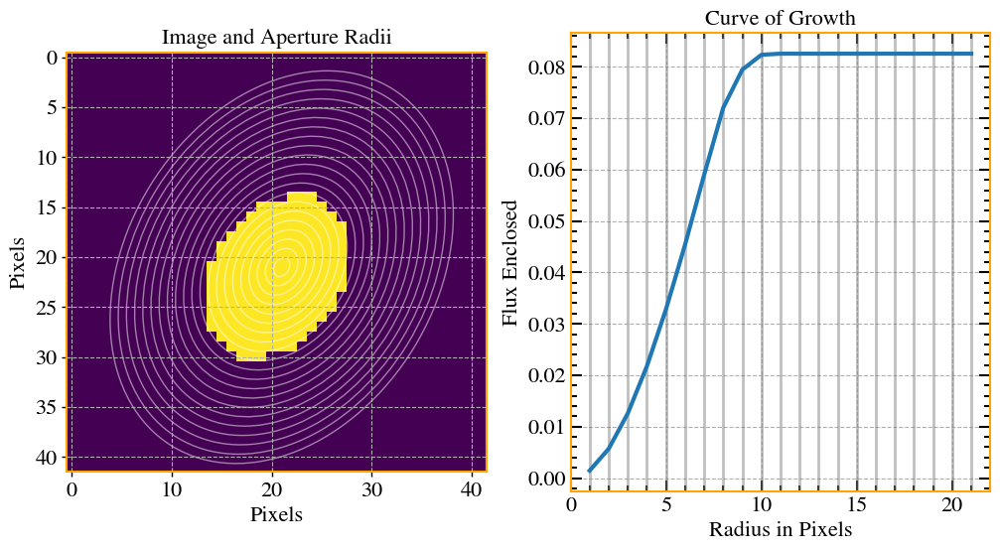

1


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


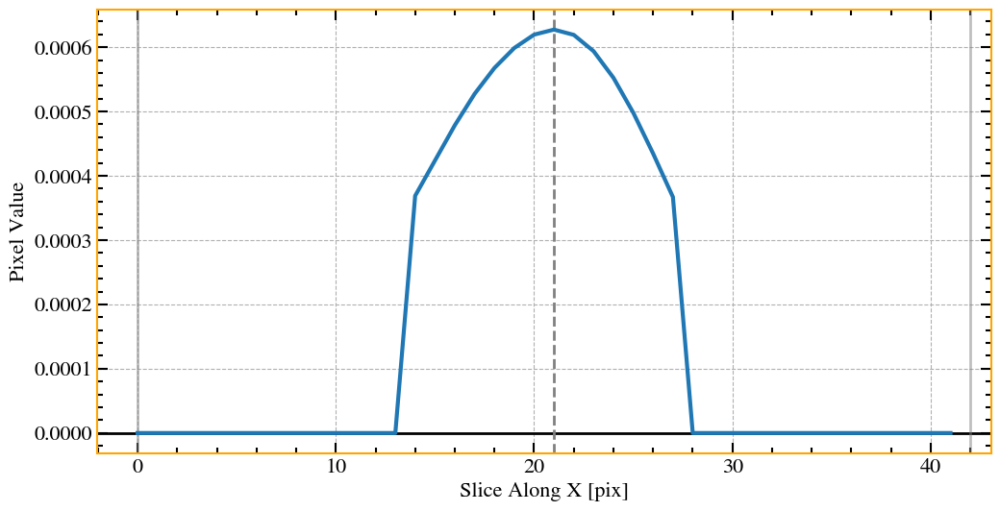

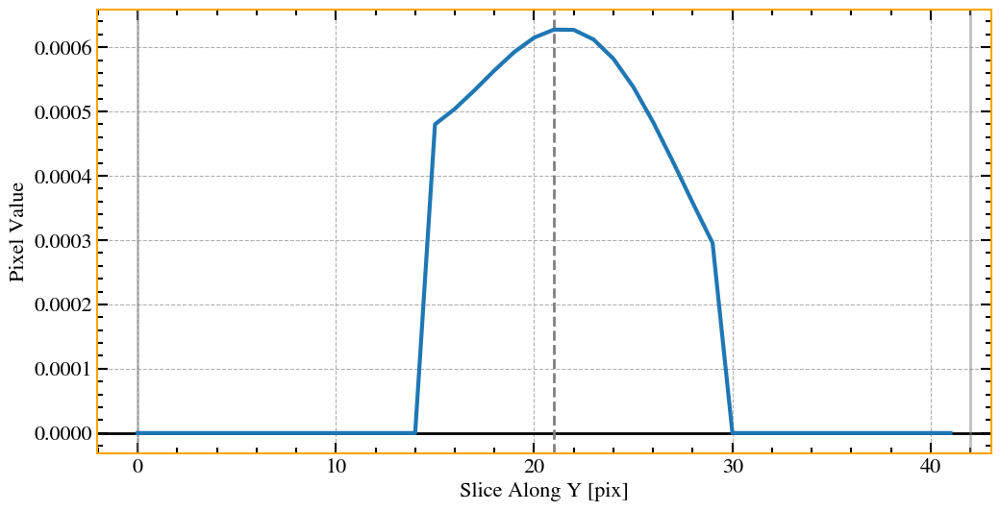

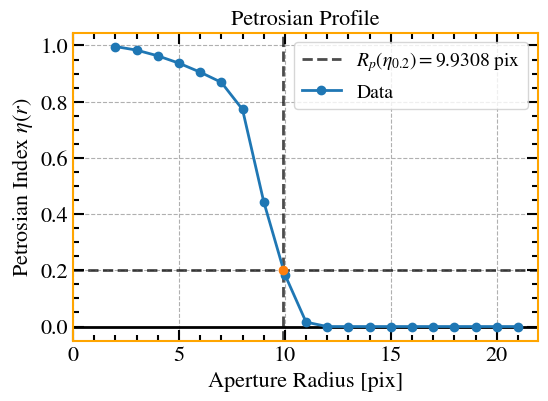

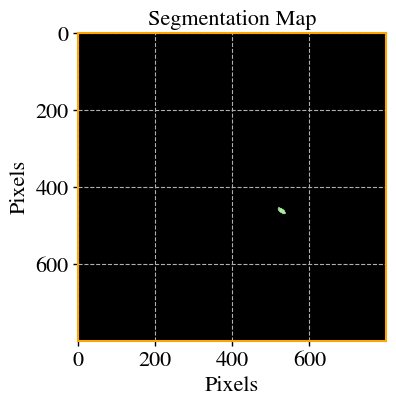

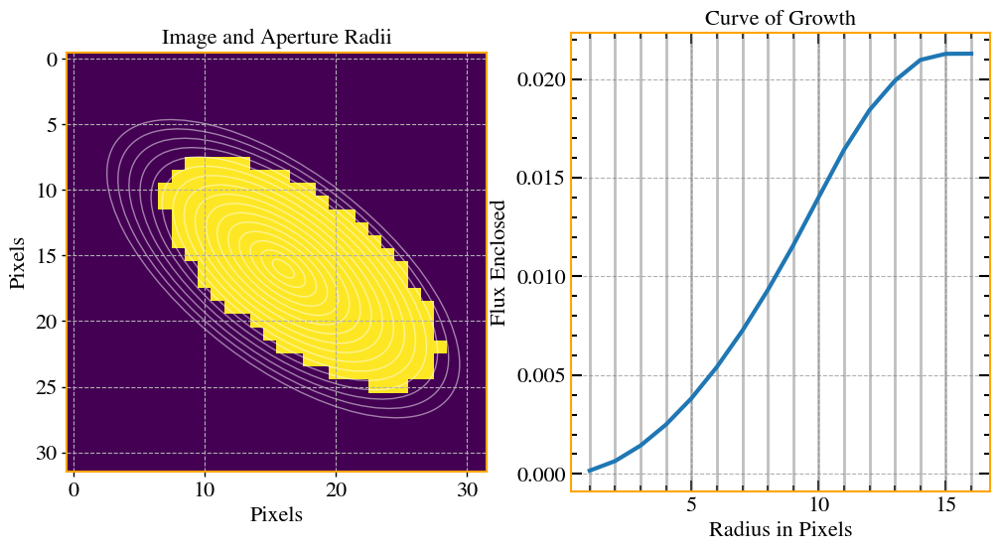

1


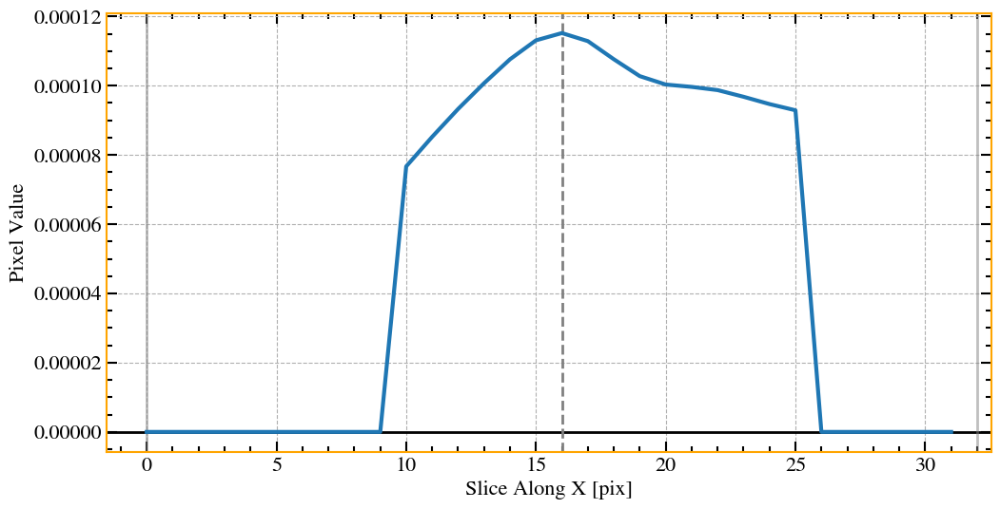

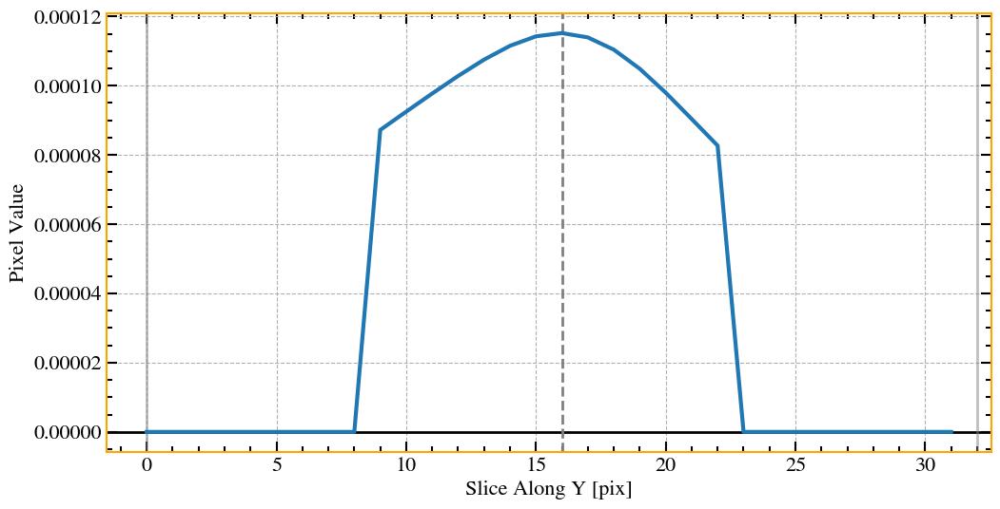

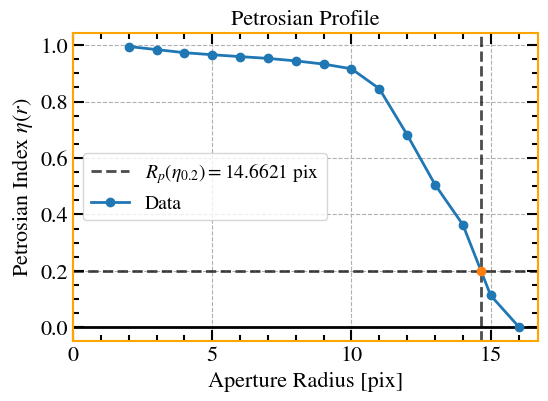

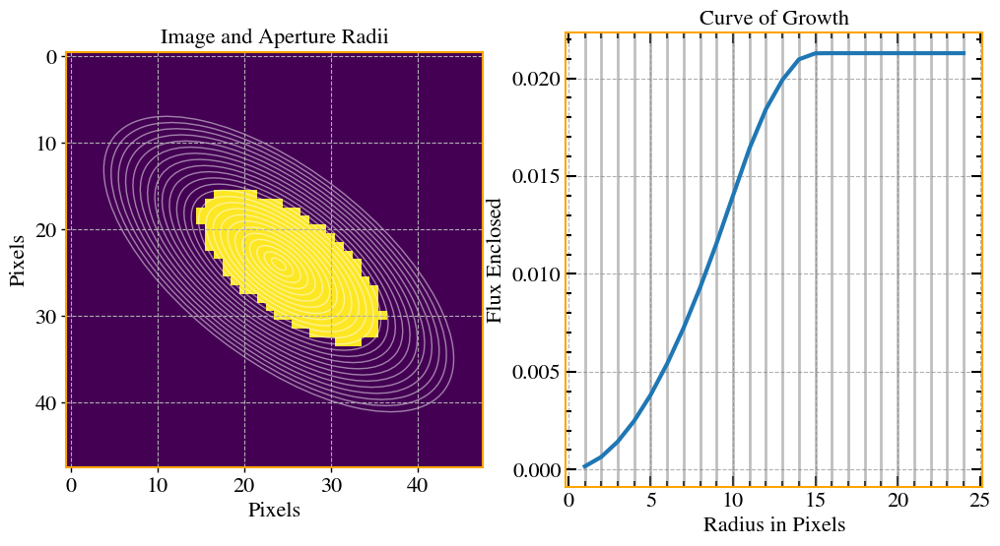

1


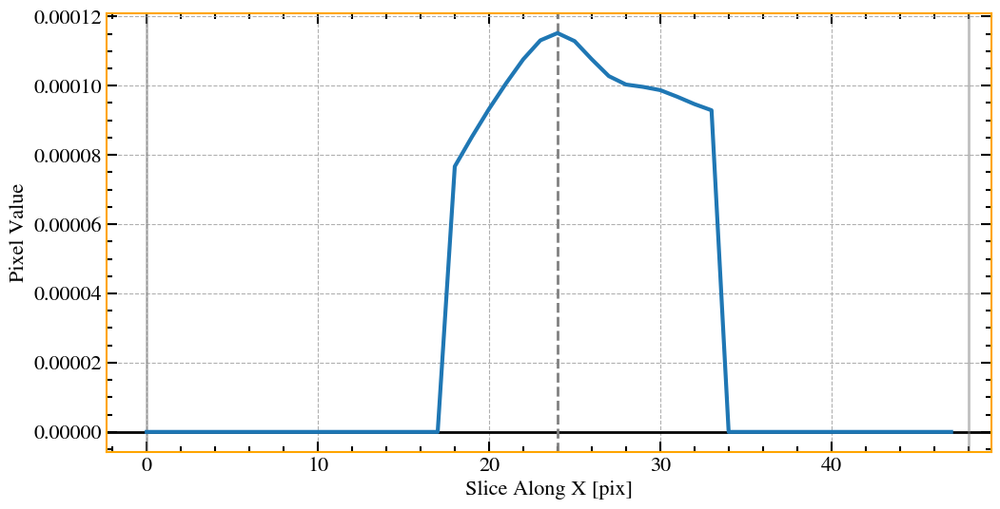

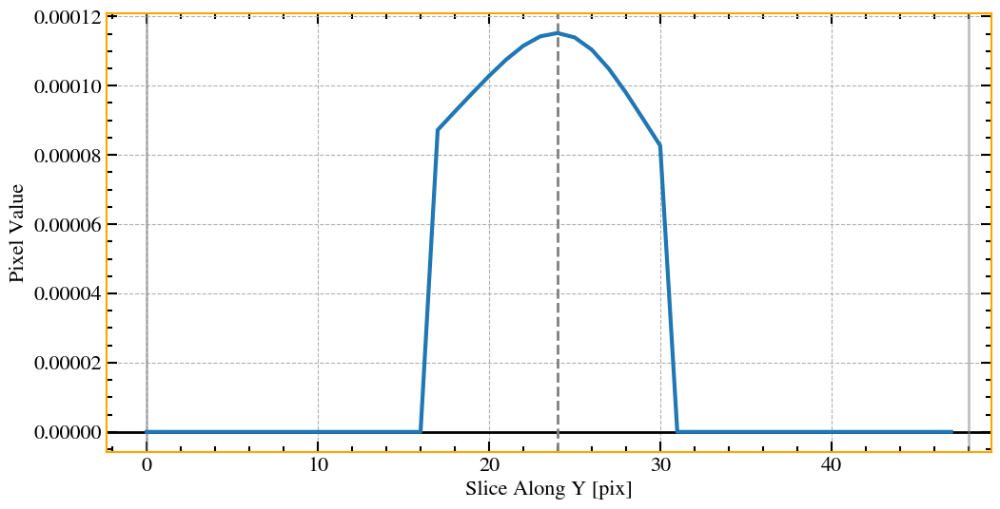

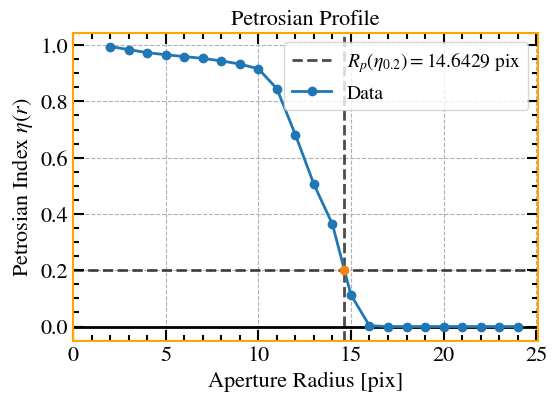

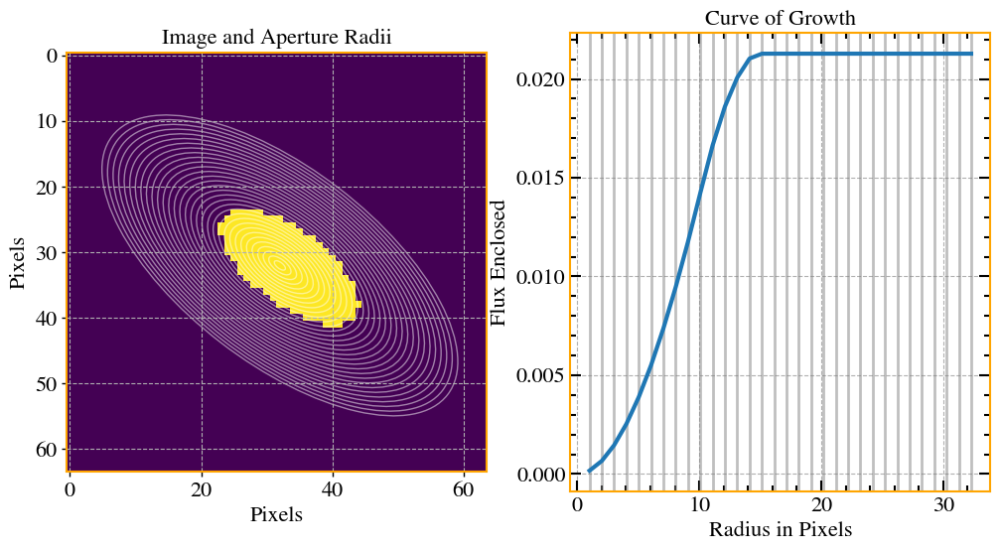

1


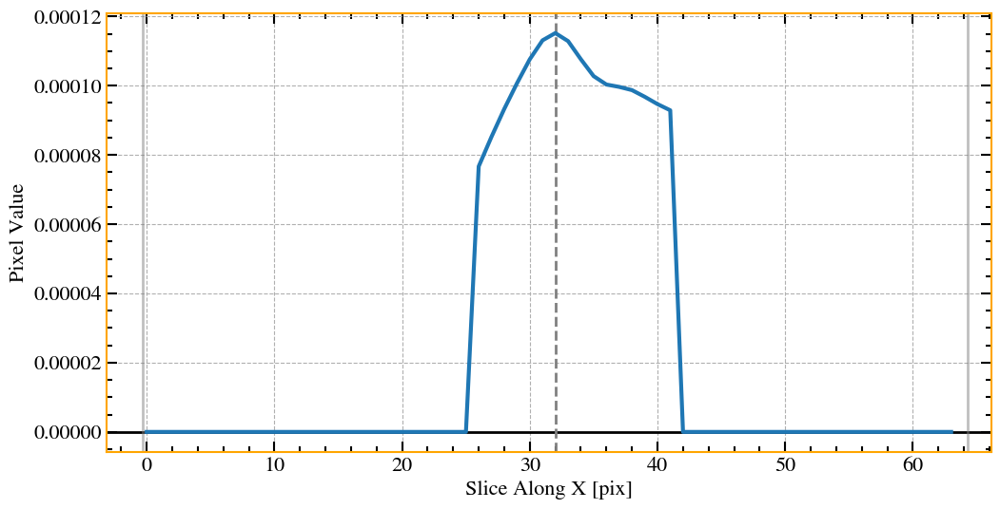

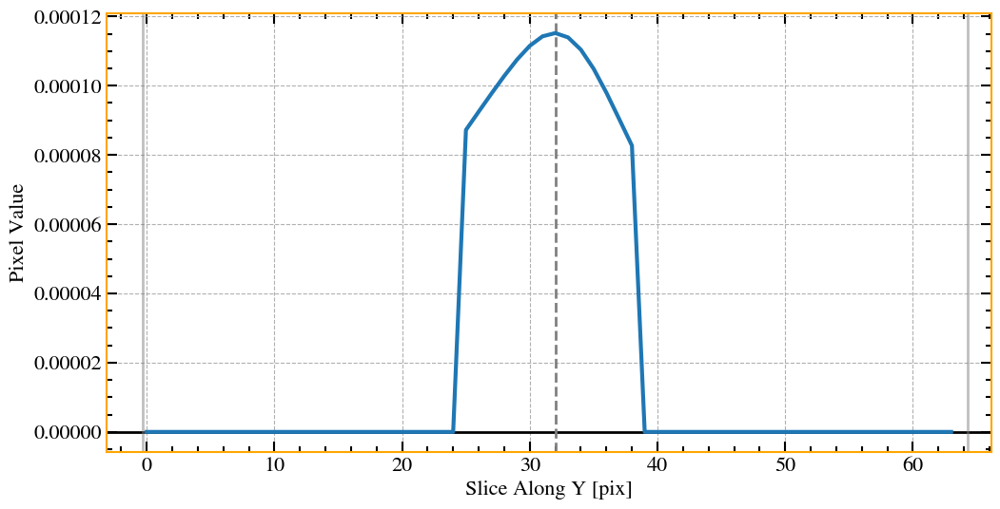

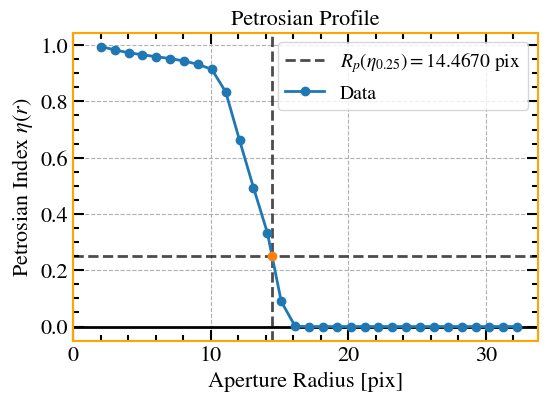

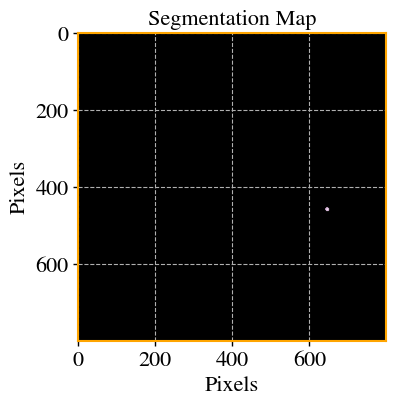

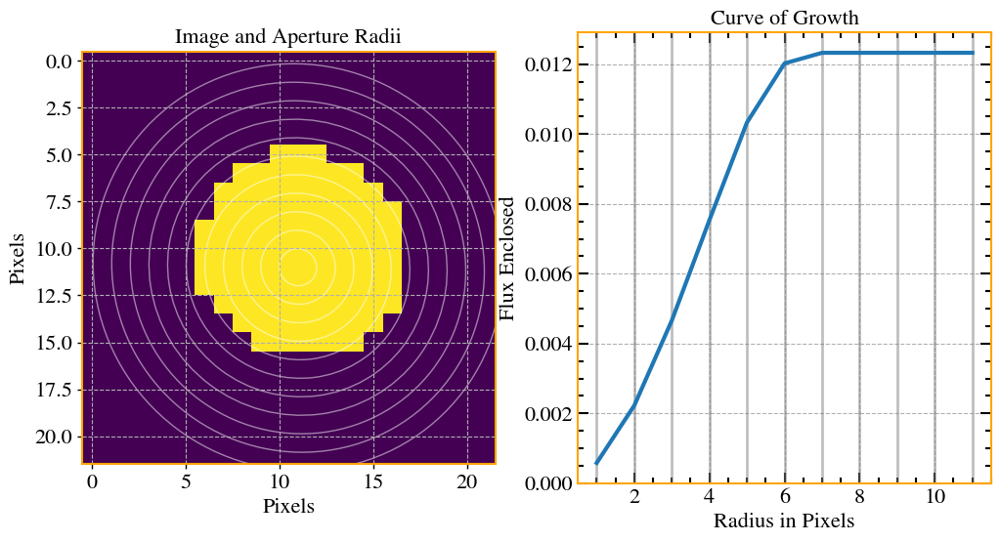

1


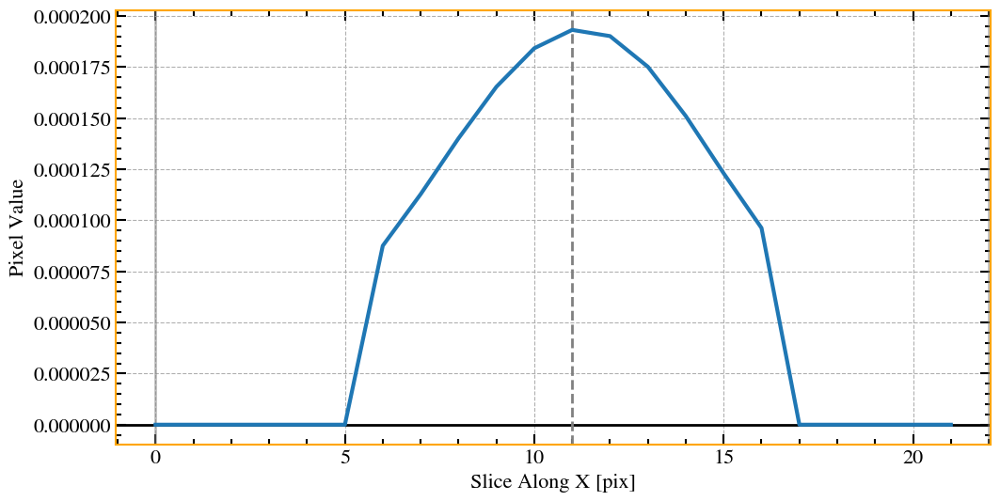

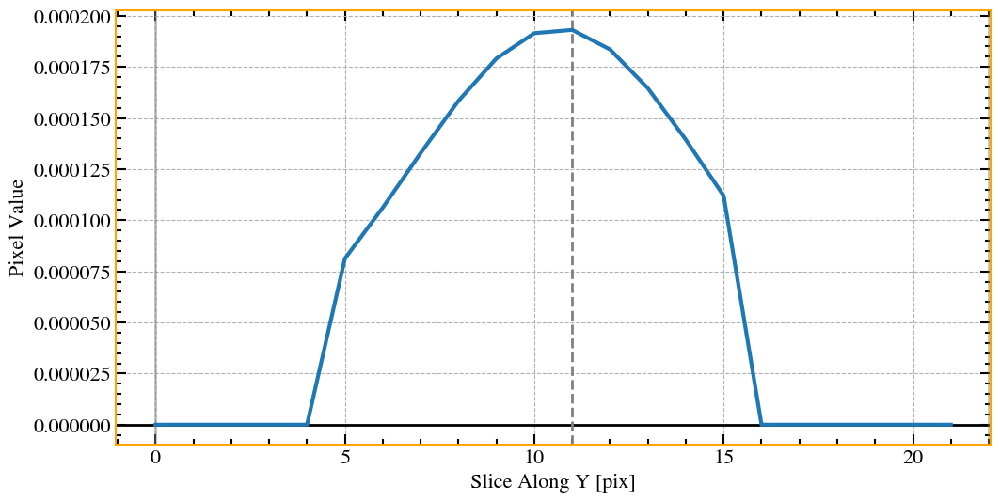

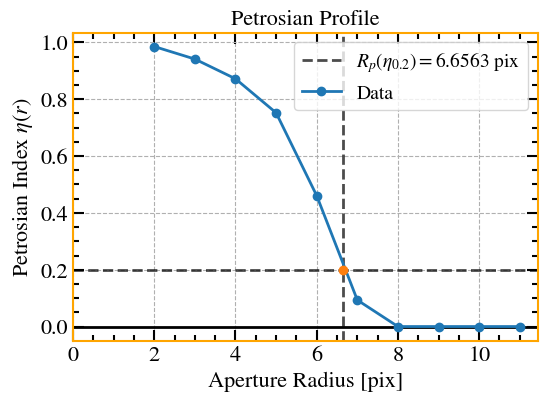

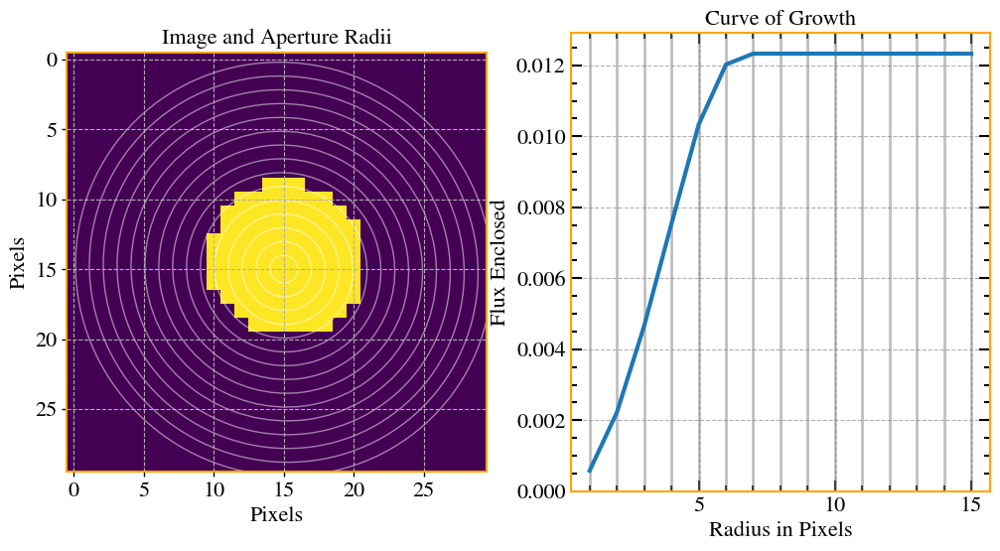

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


PSF SIZE is 800
INFO: Using Elliptical Gaussian for Gaussian beam convolution.
++==>>  PSF major/minor axis = ', 0.45543854925454325arcsec X 0.45543854925454325arcsec


2024-02-06 01:50:02	WARN	componentlist::close	componentlist closed


# of structures (IDs) to be fitted = 6
# of model components (COMPS) to be fitted = 7


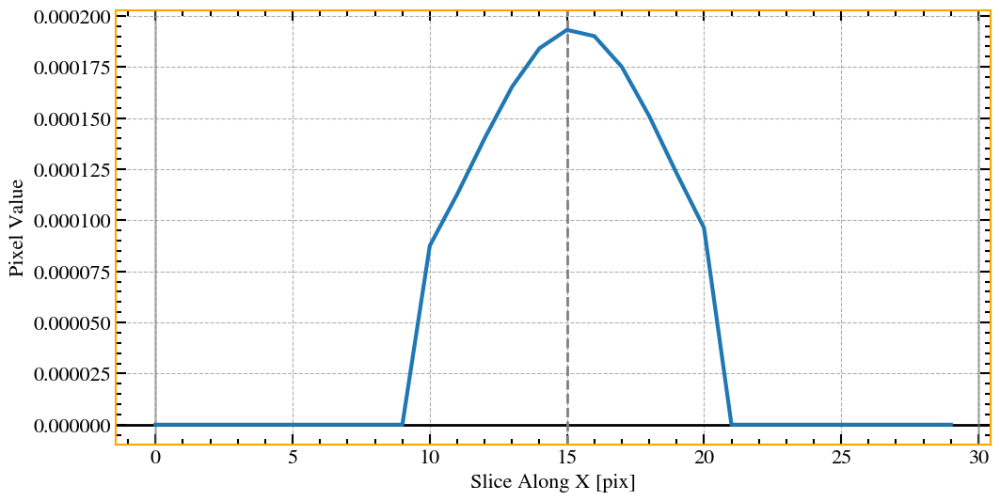

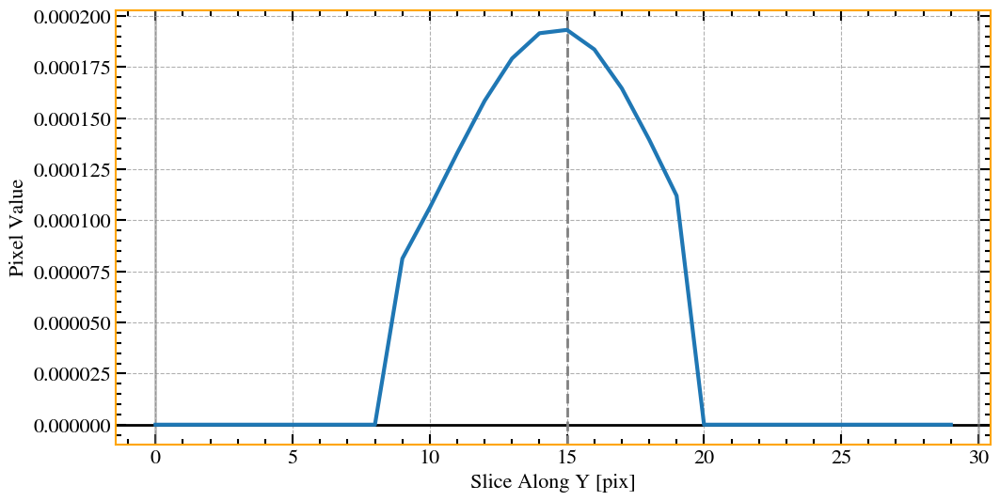

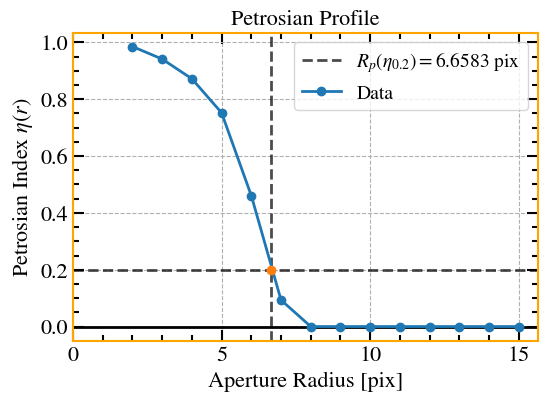

In [155]:
SE = mp.source_extraction(input_data, ids_to_add=['1'],
                          ell_size_factor = ell_size_factor, sigma=sigma,
                          bwf=bwf, bhf=bhf, fwf=fwf, fhf=fhf,
                          clean_param=clean_param, 
                          deblend_cont=deblend_cont, 
                          deblend_nthresh=deblend_nthresh,
                          apply_mask=False,sigma_mask=sigma_mask,
                          show_petro_plots=True,
                          dry_run=False)

In [156]:
SE.sources_photometries

{'c1_PA': 83.10461267280495,
 'c1_q': 0.6962140643272487,
 'c1_area': 751.0,
 'c1_Re': 15.461265295053533,
 'c1_x0c': 399.9819014565752,
 'c1_y0c': 400.2003152084077,
 'c1_label': 1,
 'c1_R50': 10.39147829565913,
 'c1_R20': 5.999399879975995,
 'c1_R80': 14.968393678735746,
 'c1_C1': 0.39706738680131504,
 'c1_Snu': 0.6414376735919066,
 'c1_Rp': 19.263852770554113,
 'c1_Rpidx': 38,
 'c1_rlast': 45,
 'c1_I50': 0.0007943914294146988,
 'c2_PA': 21.151580475949533,
 'c2_q': 0.8770953076680243,
 'c2_area': 382.0,
 'c2_Re': 11.026984017500345,
 'c2_x0c': 348.037153676371,
 'c2_y0c': 405.2410455422316,
 'c2_label': 1,
 'c2_R50': 7.232246449289858,
 'c2_R20': 4.088217643528706,
 'c2_R80': 10.642928585717144,
 'c2_C1': 0.41552713985503287,
 'c2_Snu': 0.14607532278753083,
 'c2_Rp': 14.607721544308863,
 'c2_Rpidx': 29,
 'c2_rlast': 32,
 'c2_I50': 0.00033734003227436915,
 'c3_PA': 21.887997532201037,
 'c3_q': 0.49302875428327375,
 'c3_area': 482.0,
 'c3_Re': 12.386499309352384,
 'c3_x0c': 436.237619

We also need to specify which components are compact. For this example, we are going to consider that `COMP_1`, `COMP_2` and `COMP_6` are compact.
Then, we just specify `comp_ids = ['1','2','6']`.

2024-02-06 01:50:59 - INFO -  ++>> Fitting without a mask.


Fitting final_image_cb_MCG12-02-001.calibrated.avg12s_trial_1_2048x2048_0.06asec_100000.briggs.multiscale..0.5-MFS-image.cutout.fits
rms res =  0.9457711235195636
rms data =  6.654629945010466 ; rms res =  6.29375683969948 ; ratio =  0.9457711235195636
 ==>  Dilation size is 3 [px]


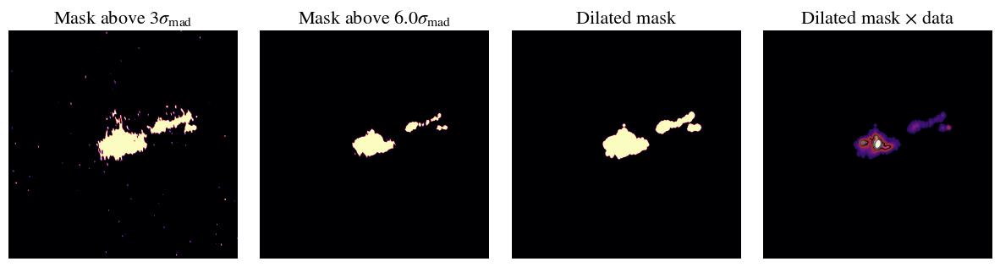

PSF BEAM SIZE is >=>  7
PSF SIZE is >=>  800
INFO: Using Elliptical Gaussian for Gaussian beam convolution.
++==>>  PSF major/minor axis = ', 0.45543854925454325arcsec X 0.45543854925454325arcsec


2024-02-06 01:51:00	WARN	componentlist::close	componentlist closed
2024-02-06 01:50:59 - DEBUG - ---------------------------------------
2024-02-06 01:50:59 - DEBUG -  <<< PERFORMING CONVOLUTION WITH JAX >>> 
2024-02-06 01:50:59 - DEBUG - ---------------------------------------
2024-02-06 01:50:59 - DEBUG -  ==> Using clean shuffled background for optmization... 


Limiting  x0
Limiting  y0
Fixing Sersic Index of component 0  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 1  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 2  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 3  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 4  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 5  to 0.5.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 6  to 0.5.
{'f1_x0': {'value': 399.9819014565752, 'min': 396.9819014565752, 'max': 402.9819014565752}, 'f1_y0': {'value': 400.2003152084077, 'min': 397.2003152084077, 'max': 403.2003152084077}, 'f1_PA': {'value': 83.10461267280495, 'min': -6.895387327195053, 'max': 173.10461267280493}, 'f1_ell': {'value': 0.30378593567275125, 'min': 0.06075718713455025, 'max': 0.75}, 'f1_n': {'value': 0.5, 'min': 0.49, 'max': 0.51}, 'f1_In': {'value': 0.0007943914294146988, 'min': 7.943914294146987e-06, 'max': 0.3971957147073494}, '

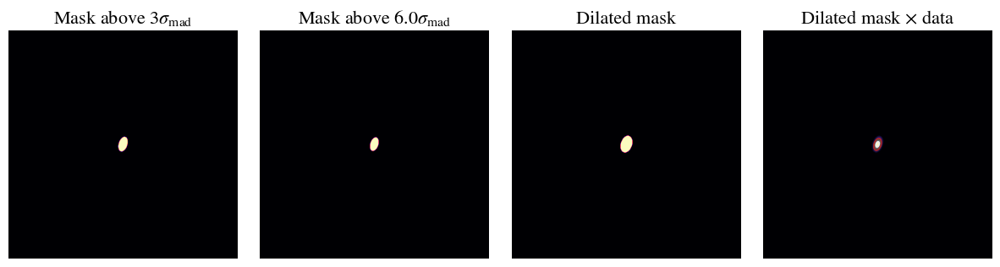

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...
100 400 300


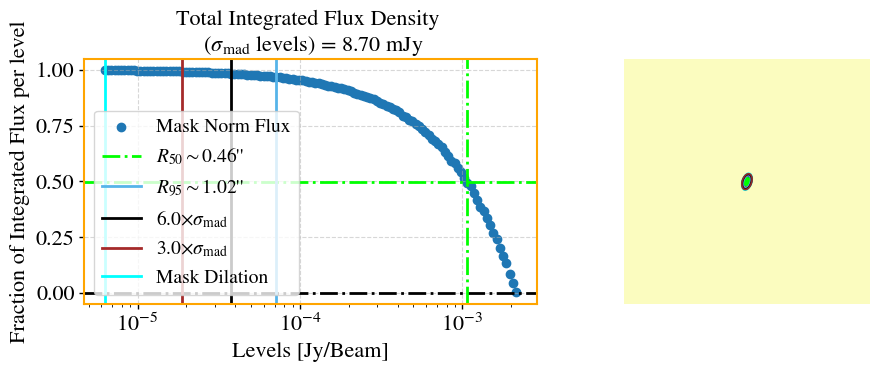

     >> CALC: Computing Petrosian properties.
Rlast     >>  36
Rp        >>  22.166033206641327
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 10.25
r_total_flux (old vs new) = 36.00
R50 =  10.246049209841969
Rp= 20.65373074614923


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 31.02it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  8.712065074153038 +/- 0.21542736196409132 mJy
Fractional error flux =  0.024727473926155742
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


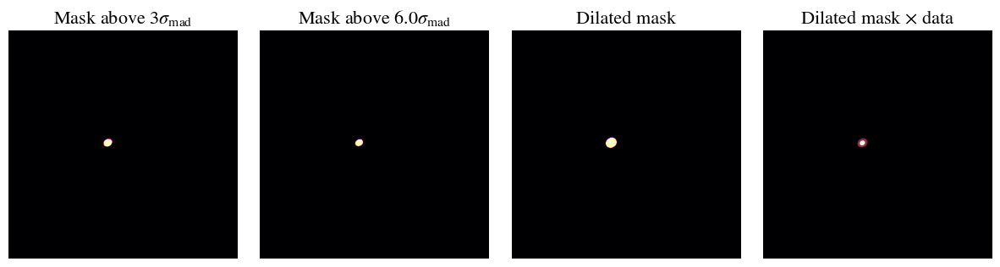

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


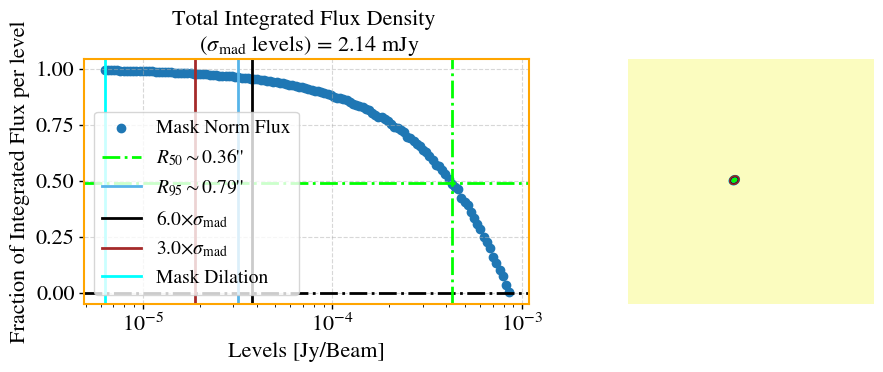

     >> CALC: Computing Petrosian properties.
Rlast     >>  27
Rp        >>  15.031206241248249
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 6.81
r_total_flux (old vs new) = 21.88
R50 =  6.80996199239848
Rp= 14.053610722144429


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 39.34it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  2.1541714642935017 +/- 0.12159360496211179 mJy
Fractional error flux =  0.0564456483513909
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


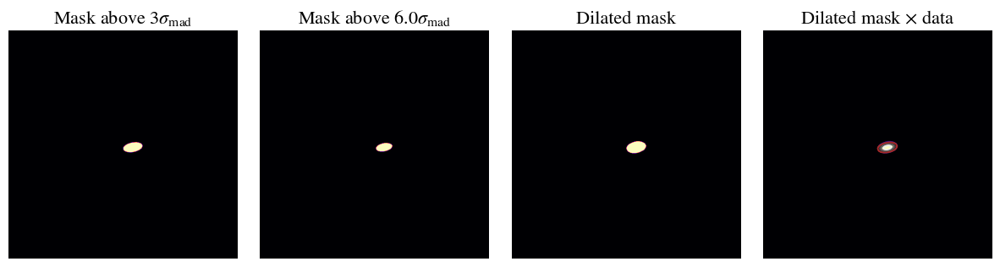

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


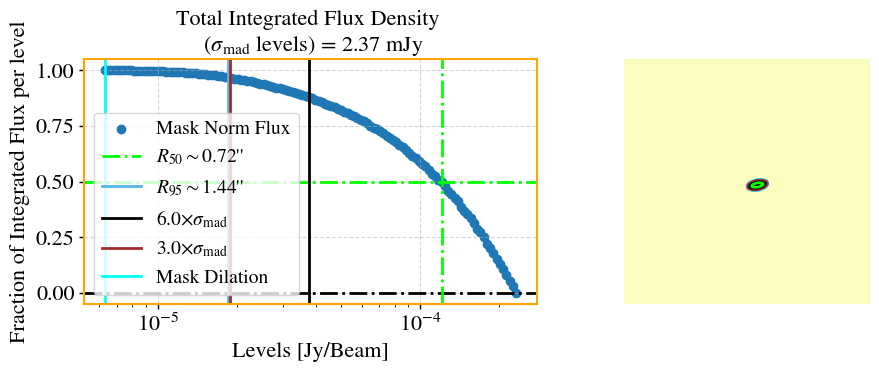

     >> CALC: Computing Petrosian properties.
Rlast     >>  39
Rp        >>  35.6375275055011
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 16.99
r_total_flux (old vs new) = 40.91


R50 =  16.988397679535908
Rp= 34.54530906181236
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 44.80it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  2.3703802259193636 +/- 0.23029687554484354 mJy
Fractional error flux =  0.09715609041394267
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


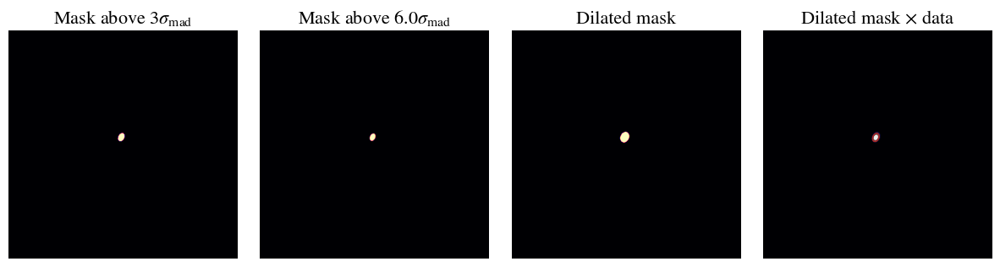

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


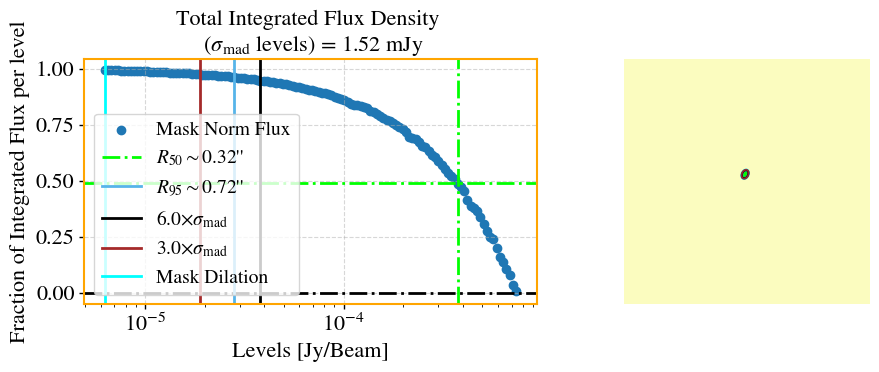

     >> CALC: Computing Petrosian properties.
Rlast     >>  25
Rp        >>  14.672934586917384
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 6.66
r_total_flux (old vs new) = 22.40
R50 =  6.655731146229246
Rp= 13.742748549709942


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 42.44it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  1.5290647453869401 +/- 0.09574311275084814 mJy
Fractional error flux =  0.06261547330791391
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


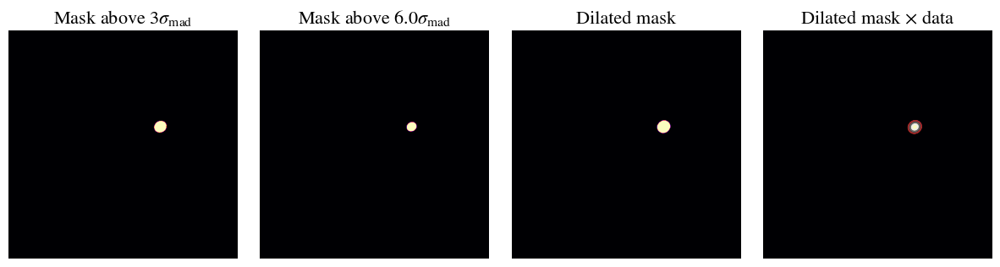

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:168: RuntimeWarning: Mean of empty slice.
  remove_indexes = np.where(np.logical_or(abs(y - y.mean()) >
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:169: RuntimeWarning: Mean of empty slice.
  abs(y - y.mean()).mean() * 1.5, \
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:170: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()) >
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:171: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()).mean() * 1.5) == True)[0]
/media/sagauga/xfs_evo/cloud/

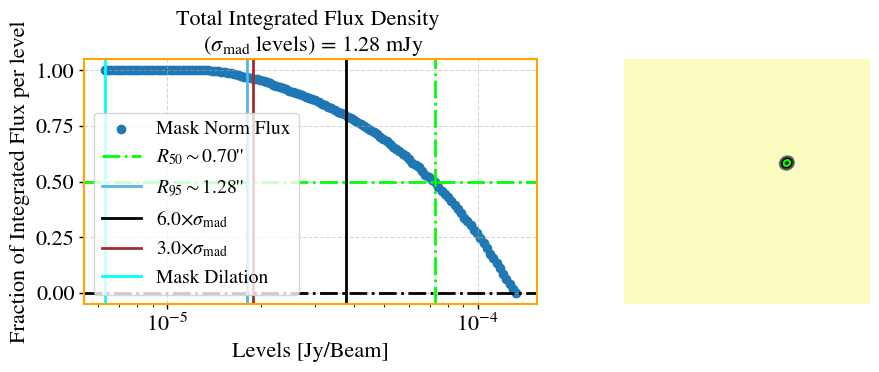

     >> CALC: Computing Petrosian properties.
Rlast     >>  33
Rp        >>  24.3126625325065
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 12.36
r_total_flux (old vs new) = 26.00
R50 =  12.364272854570913
Rp= 24.05521104220844


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 42.39it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  1.2819769858158794 +/- 0.1588061646641331 mJy
Fractional error flux =  0.12387598718323732
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


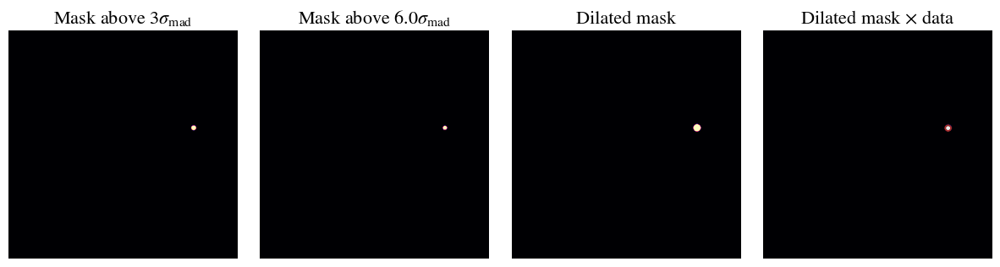

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300
non real ellipse
non real ellipse
non real ellipse
non real ellipse
non real ellipse
non real ellipse
non real ellipse


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:262: RuntimeWarning: invalid value encountered in divide
  qmedian = np.nanmedian(BB / AA)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:264: RuntimeWarning: invalid value encountered in divide
  qmi = np.nanmedian((BB / AA)[:rsplit])
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:265: RuntimeWarning: invalid value encountered in divide
  qmo = np.nanmedian((BB / AA)[rsplit:])


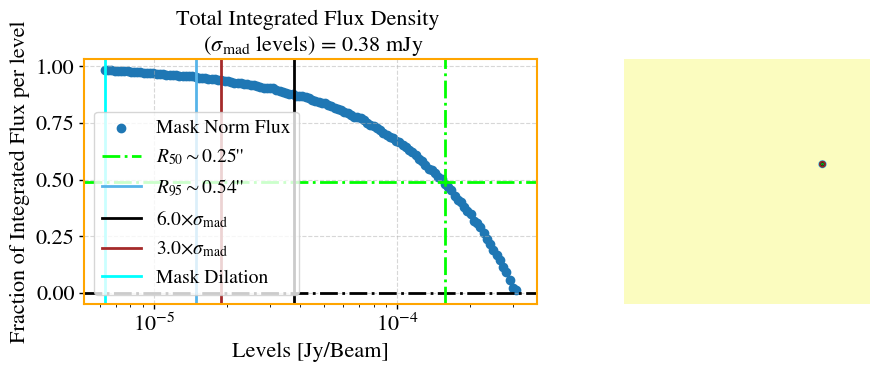

     >> CALC: Computing Petrosian properties.
Rlast     >>  18
Rp        >>  9.94518903780756
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 4.40
r_total_flux (old vs new) = 14.00
R50 =  4.3990798159631925
Rp= 9.311062212442488


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 32.62it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  0.38488132583935847 +/- 0.04744187715121615 mJy
Fractional error flux =  0.12326365028948537
-----------------------------------------------------------------


     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


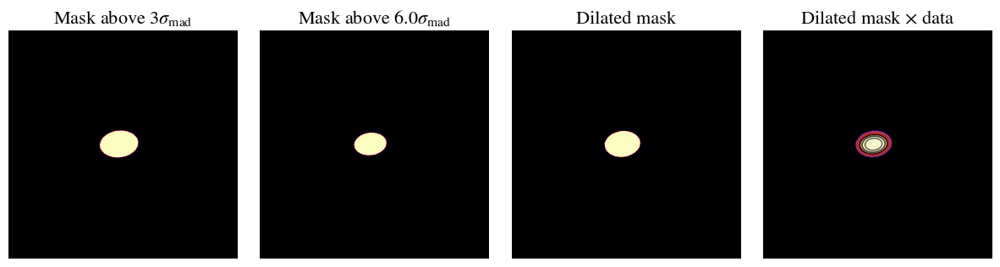

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: divide by zero encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:168: RuntimeWarning: Mean of empty slice.
  remove_indexes = np.where(np.logical_or(abs(y - y.mean()) >
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:169: RuntimeWarning: Mean of empty slice.
  abs(y - y.mean()).mean() * 1.5, \
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:170: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()) >
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:171: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()).mean() * 1.5) == True)[0]
/media/sagauga/xfs_evo/cloud/

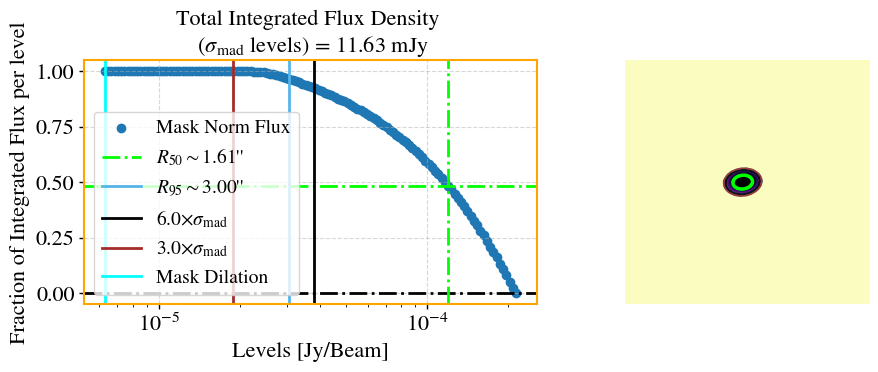

     >> CALC: Computing Petrosian properties.
Rlast     >>  79
Rp        >>  63.48129625925185
Rtotal    >>  nan


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


eta = 0.2
epsilon = 2
r_half_light (old vs new) = 32.99
r_total_flux (old vs new) = 67.37
R50 =  32.985597119423886
Rp= 62.46769353870775
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 41.47it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  11.632768453403724 +/- 0.9667155346463502 mJy
Fractional error flux =  0.08310279178328278
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


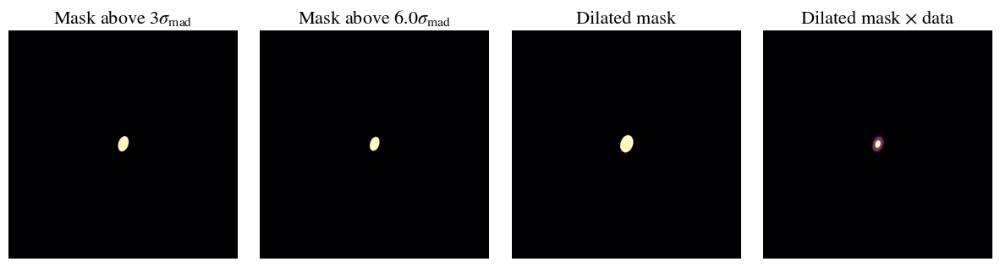

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...
100 400 300


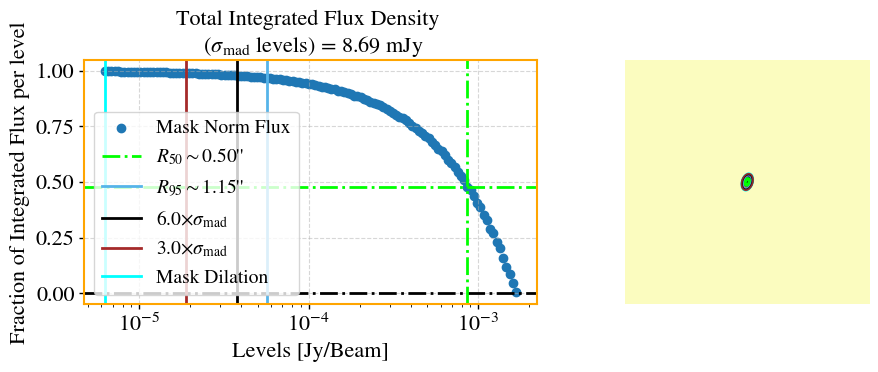

     >> CALC: Computing Petrosian properties.
Rlast     >>  38
Rp        >>  23.534306861372272
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 10.91
r_total_flux (old vs new) = 35.37


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


R50 =  10.9123824764953
Rp= 21.995599119823964
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 33.07it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  8.703785451871356 +/- 0.24434254692395618 mJy
Fractional error flux =  0.028073135335777533
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


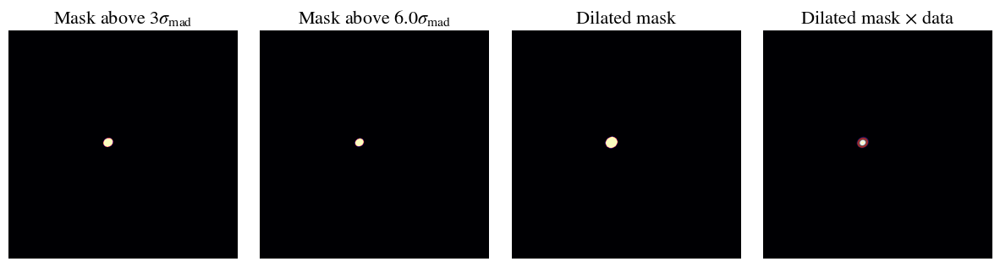

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


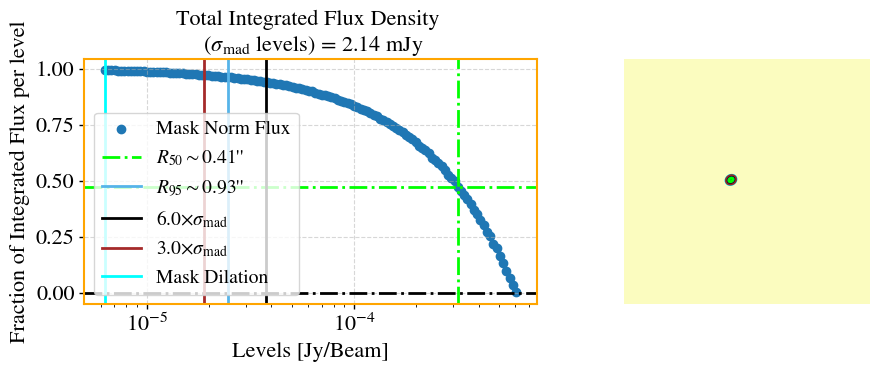

     >> CALC: Computing Petrosian properties.
Rlast     >>  29
Rp        >>  17.055411082216445
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 7.79
r_total_flux (old vs new) = 22.38
R50 =  7.787357471494299
Rp= 15.944988997799559


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 30.31it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  2.1473185480229784 +/- 0.14046674124031616 mJy
Fractional error flux =  0.06541495269513829
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


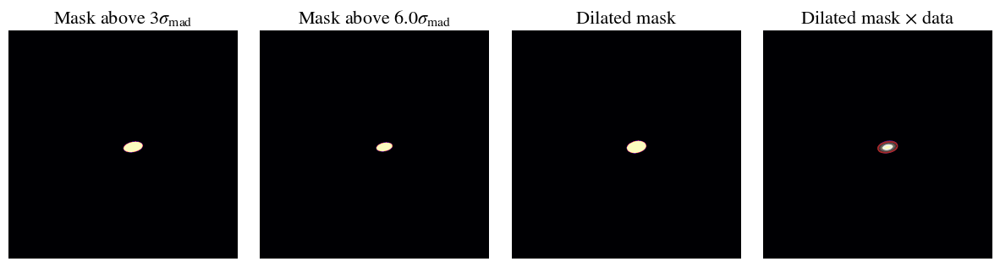

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


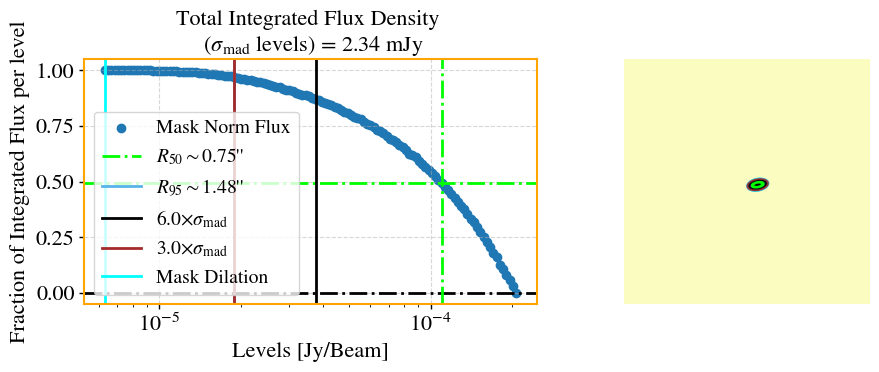

     >> CALC: Computing Petrosian properties.
Rlast     >>  39
Rp        >>  35.50490098019604
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 17.21
r_total_flux (old vs new) = 40.01


R50 =  17.211642328465693
Rp= 34.71954390878175
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 30.33it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  2.3408966032404392 +/- 0.23221084437755163 mJy
Fractional error flux =  0.09919739473162056
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


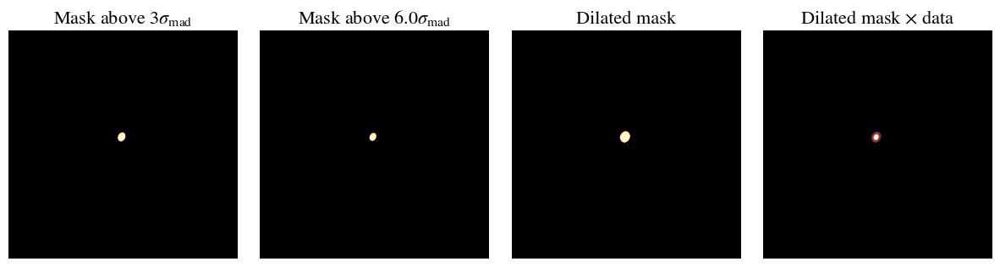

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


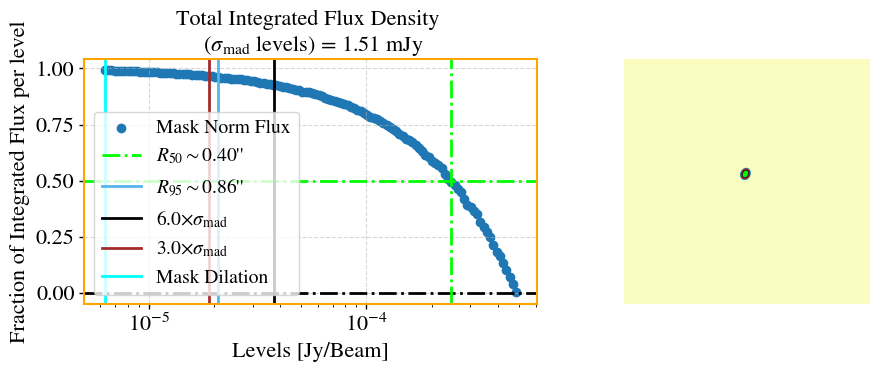

     >> CALC: Computing Petrosian properties.
Rlast     >>  27
Rp        >>  16.743348669733948
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 7.64
r_total_flux (old vs new) = 23.00
R50 =  7.636927385477096
Rp= 15.652330466093218


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 44.23it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  1.5232429234101317 +/- 0.11502760853750146 mJy
Fractional error flux =  0.07551494693964213
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


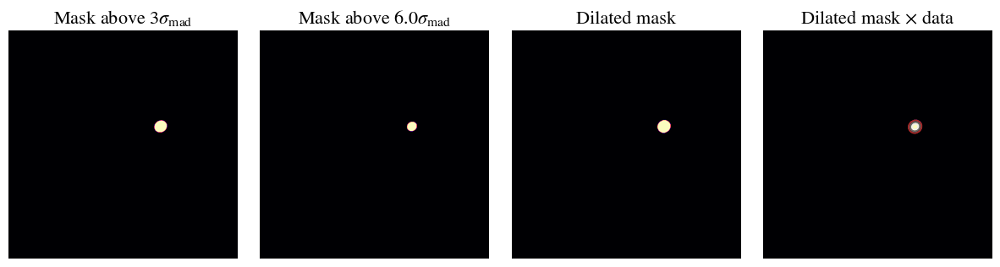

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300
non real ellipse


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:168: RuntimeWarning: Mean of empty slice.
  remove_indexes = np.where(np.logical_or(abs(y - y.mean()) >
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:169: RuntimeWarning: Mean of empty slice.
  abs(y - y.mean()).mean() * 1.5, \
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:170: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()) >
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:171: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()).mean() * 1.5) == True)[0]
/media/sagauga/xfs_evo/cloud/

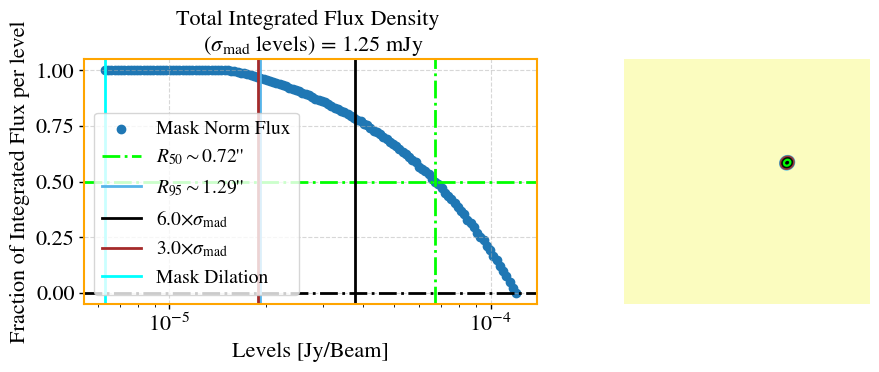

     >> CALC: Computing Petrosian properties.
Rlast     >>  33
Rp        >>  24.30606121224245
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 12.62
r_total_flux (old vs new) = 24.50
R50 =  12.624324864972994
Rp= 24.068413682736548


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 47.56it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  1.2531906063937182 +/- 0.15910761172112284 mJy
Fractional error flux =  0.12696202070887178
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: divide by zero encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/astropy/visualization/mpl_normalize.py:180: RuntimeWarning: invalid value encountered in divide
  np.true_divide(values, self.vmax - self.vmin, out=values)


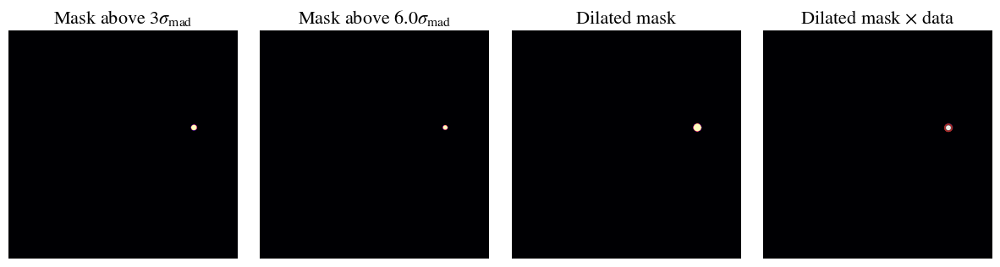

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: invalid value encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


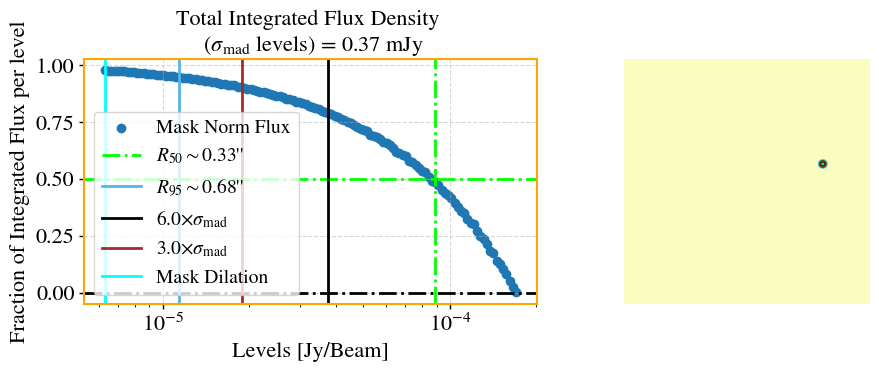

     >> CALC: Computing Petrosian properties.
Rlast     >>  20
Rp        >>  12.898579715943189
Rtotal    >>  nan
eta = 0.2
epsilon = 2
r_half_light (old vs new) = 5.77
r_total_flux (old vs new) = 15.09
R50 =  5.768953790758152
Rp= 12.081016203240647


--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 46.33it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  0.37963482983933783 +/- 0.055305243665919934 mJy
Fractional error flux =  0.14568010972366582
-----------------------------------------------------------------
     >> CALC: Performing mask dilation.
 ==>  Dilation size is 3 [px]


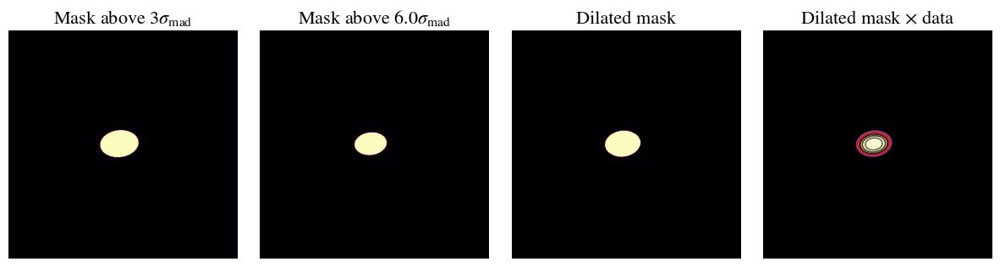

     >> CALC: Performing level statistics.
     >> CALC: Computing image properties.
Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: divide by zero encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:168: RuntimeWarning: Mean of empty slice.
  remove_indexes = np.where(np.logical_or(abs(y - y.mean()) >
/home/sagauga/miniconda3/envs/morphen_stable/lib/python3.8/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:169: RuntimeWarning: Mean of empty slice.
  abs(y - y.mean()).mean() * 1.5, \
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:170: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()) >
/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/fitEllipse.py:171: RuntimeWarning: Mean of empty slice.
  abs(x - x.mean()).mean() * 1.5) == True)[0]
/media/sagauga/xfs_evo/cloud/

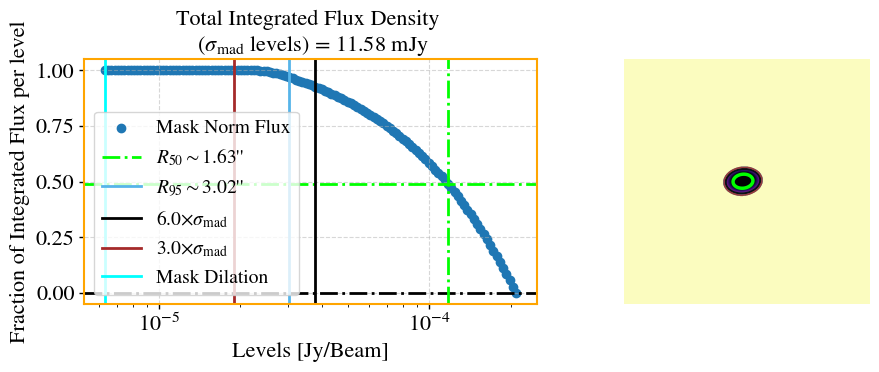

     >> CALC: Computing Petrosian properties.
Rlast     >>  79
Rp        >>  63.40228045609121
Rtotal    >>  nan


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


eta = 0.2
epsilon = 2
r_half_light (old vs new) = 32.97
r_total_flux (old vs new) = 65.01
R50 =  32.97159431886377
Rp= 63.05461092218443
--==>> Computing image statistics...


100%|██████████| 10/10 [00:00<00:00, 35.95it/s]


-----------------------------------------------------------------
Estimate of flux error (based on rms of residual x area): 
Flux =  11.584340423156442 +/- 0.9711405004576051 mJy
Fractional error flux =  0.08383217904373305
-----------------------------------------------------------------
*************************************
{'comp_ID_1': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_class': 'D', 'AC2_deconv_class': 'D', 'final_class': 'D'}, 'comp_ID_2': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_class': 'D', 'AC2_deconv_class': 'D', 'final_class': 'D'}, 'comp_ID_3': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_class': 'D', 'AC2_deconv_class': 'D', 'final_class': 'D'}, 'comp_ID_4': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_class': 'D', 'AC2_deconv_class': 'D', 'final_class': 'D'}, 'comp_ID_5': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_class': 'D', 'AC2_deconv_class': 'D', 'final_class': 'D'}, 'comp_ID_6': {'Spk_class': 'D', 'I50_class': 'D', 'AC1_deconv_clas

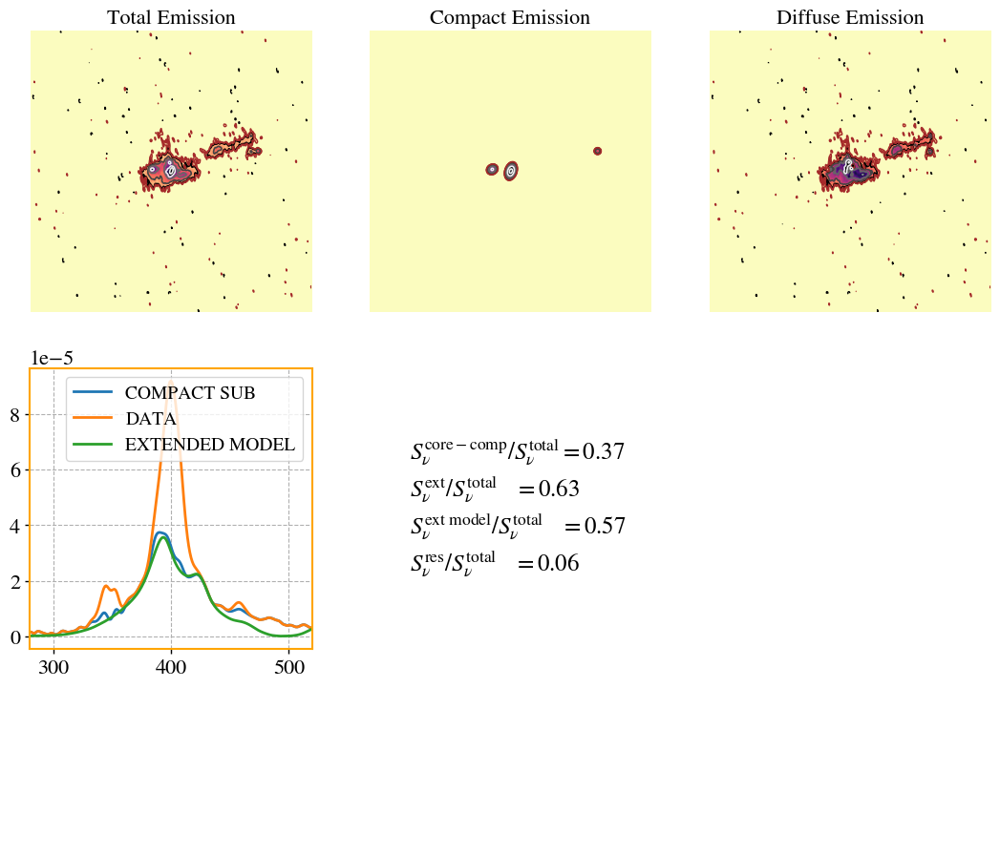

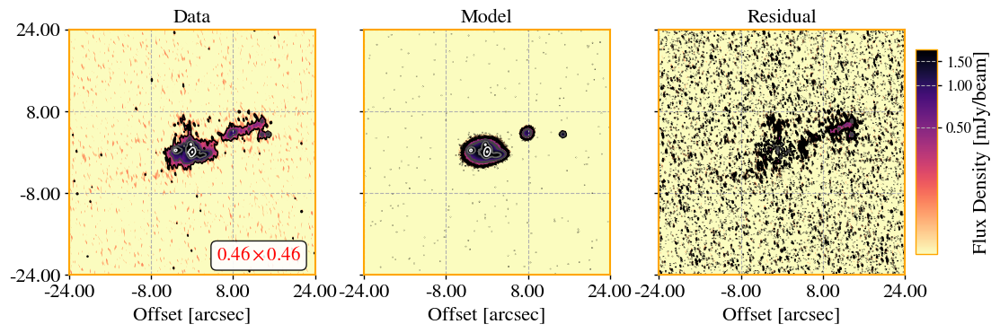

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


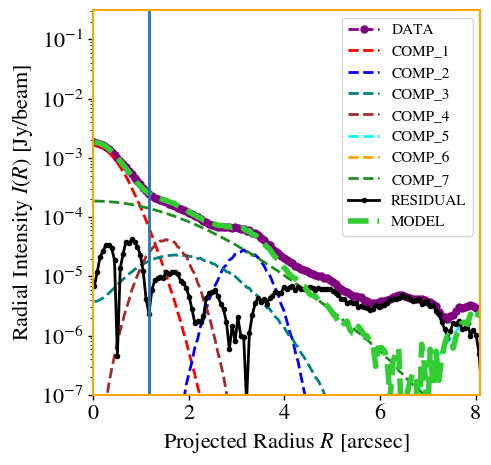

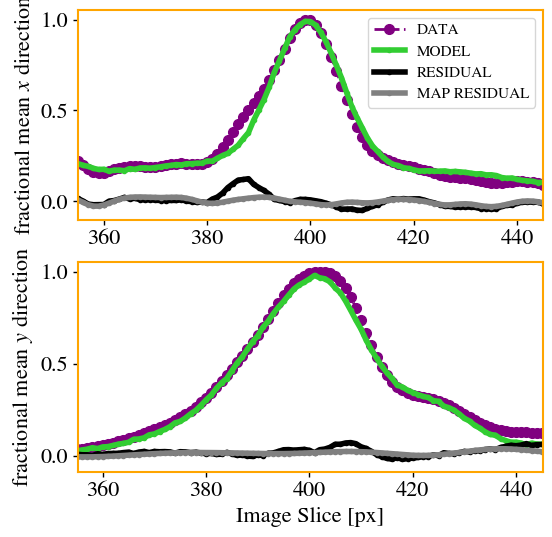

Using rms provided...
100 400 300


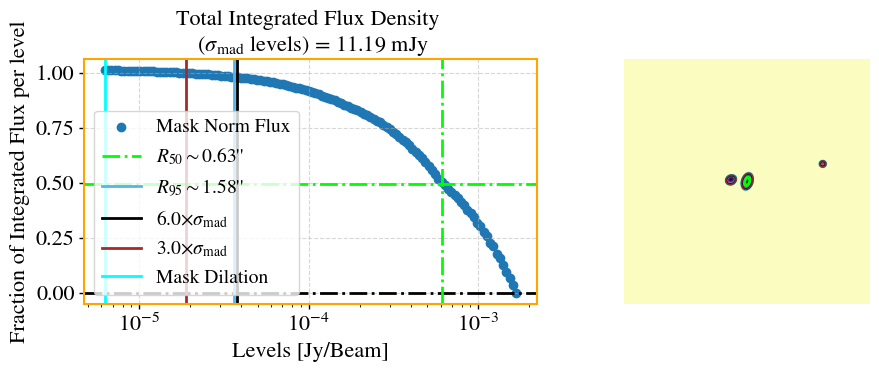

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


Using rms provided...
100 400 300


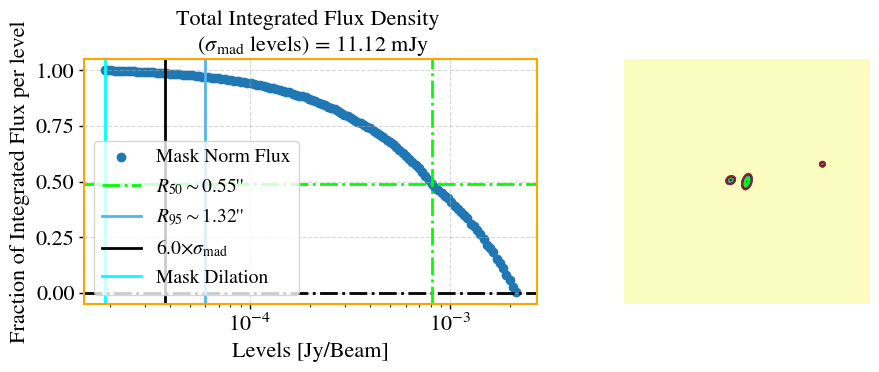

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: divide by zero encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


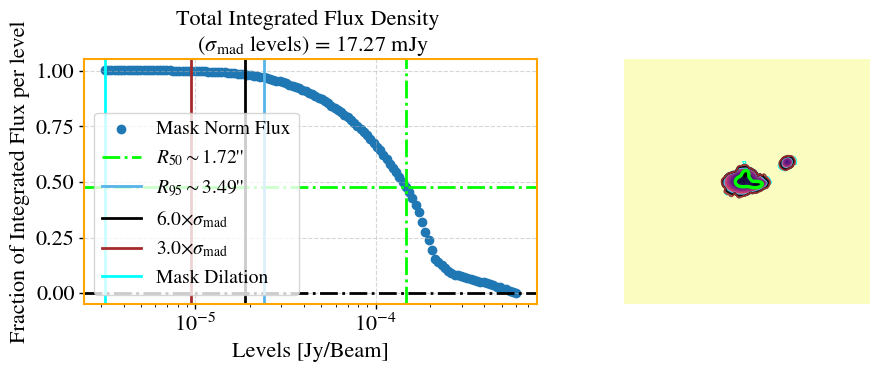

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \


Using rms provided...


/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:4571: RuntimeWarning: divide by zero encountered in divide
  y0peak, x0peak = nd.maximum_position((image / rr2))


100 400 300


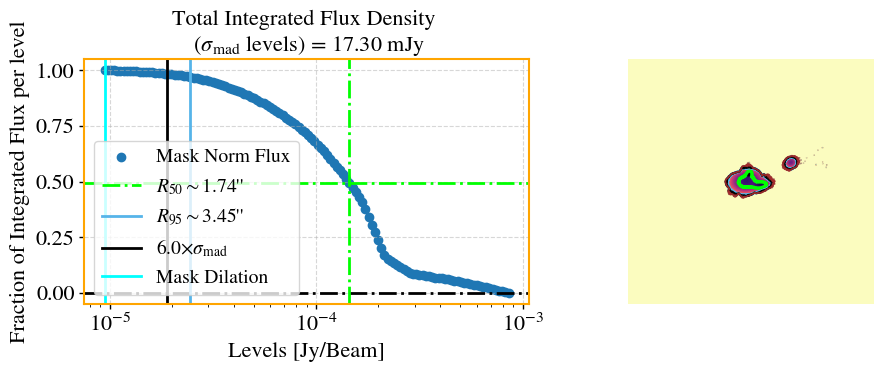

/media/sagauga/xfs_evo/cloud/OnedriveUoM/PhD_UoM/GitHub/morphen_dev/image_decomposition/../libs/libs.py:2343: RuntimeWarning: invalid value encountered in divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \
2024-02-06 01:55:23 - INFO - +--------------------------------+
2024-02-06 01:55:23 - INFO - | Core-Compact Component Sizes |
2024-02-06 01:55:23 - INFO - +--------------------------------+
2024-02-06 01:55:23 - INFO -  >=> Beam Size = 7.00 px
2024-02-06 01:55:23 - INFO -  >=> Beam Size = 138.65  pc
2024-02-06 01:55:23 - INFO -  >=> Rn Main Compact = 194.60  pc
2024-02-06 01:55:23 - INFO -  >=> C50 Compact Deconv Radii = 181.22  pc
2024-02-06 01:55:23 - INFO -  >=> C50 Compact Conv Radii = 207.86  pc
2024-02-06 01:55:23 - INFO -  >=> C95 Compact Deconv Radii = 436.53  pc
2024-02-06 01:55:23 - INFO -  >=> C95 Compact Conv Radii = 523.07  pc
2024-02-06 01:55:23 - INFO - +----------------------------+
2024-02-06 01:55:23 - INFO - | Extended Component S

In [157]:
smfr = mp.sersic_multifit_radio(input_data,
                                SE, #source extraction object, from previous step
                                convolution_mode='GPU',
                                which_residual = 'shuffled', #natural or shuffled (natural is experimental!)
                                fix_geometry=True, #for stability purposes, keep True for now. 
                                comp_ids=['1','2','6'],# which component label is compact?
                                dr_fix=[3,3,3,3,3,150,150,150],#for each component, radial element size to fix (x0,y0) positions
                                fix_value_n=[0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5],#for each component, the Sersic index value to be fixed. 
                                fix_n=[True,True,True,True,True,True,True,True],#for each component, fix or not the Sersic index. 
                                aspect='elliptical',#elliptical or circular gaussian for beam convolution? 
                                z = mlibs.find_z_NED('MCG+12-02-001'))

## The structure of the diffuse emission
Lets visualise the model images of our fitting. 
Note that we explicitly specify below the model components that are compact 
(the same ones that were specified when running `mp.sersic_multifit_radio`).

Text(0.5, 1.0, 'Data')

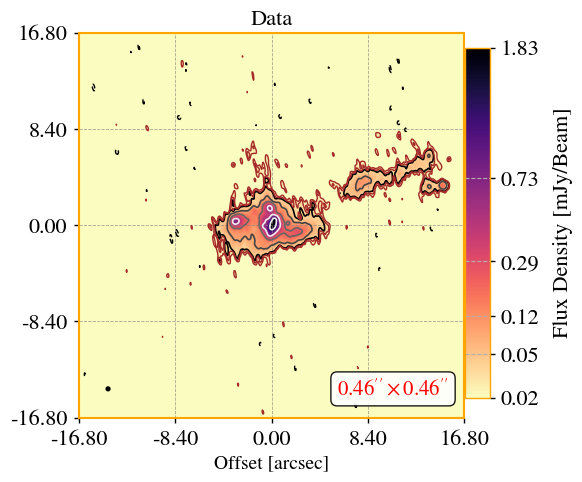

In [196]:
center = mlibs.nd.maximum_position(input_data.image_data_2D)
# center = (center[1]+90,center[0])
# center = (int(smfr.results_fit['f1_x0'][0]),int(smfr.results_fit['f1_y0'][0]))
rms = input_data.rms_res
ax = mlibs.eimshow(input_data.filename,
                   center=center,add_beam=True,
                   crop=True,box_size=280,vmax_factor=1.0,
                   vmax=input_data.image_data_2D.max(),rms=rms)
ax.set_title('Data')

Text(0.5, 1.0, 'Diffuse Emission')

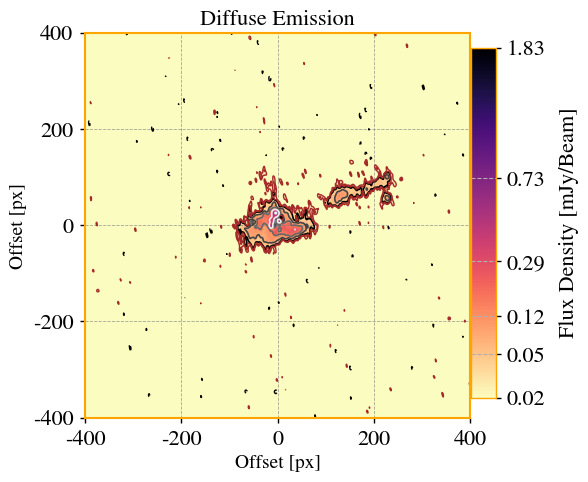

In [198]:
ax = mlibs.eimshow(input_data.image_data_2D
                   -smfr.compact_model,
                   crop=False,box_size=280,vmax_factor=1.0,
                   center=center,
                   rms=rms,add_beam=True,
                   vmax=input_data.image_data_2D.max())
# ax = mlibs.add_beam_to_image(input_data.filename, ax=ax, dx=3,
#                         cell_size=mlibs.get_cell_size(input_data.filename))
ax.set_title('Diffuse Emission')

Input image is not a string.
Input image is not a string.


Text(0.5, 1.0, 'Compact Deconvolved')

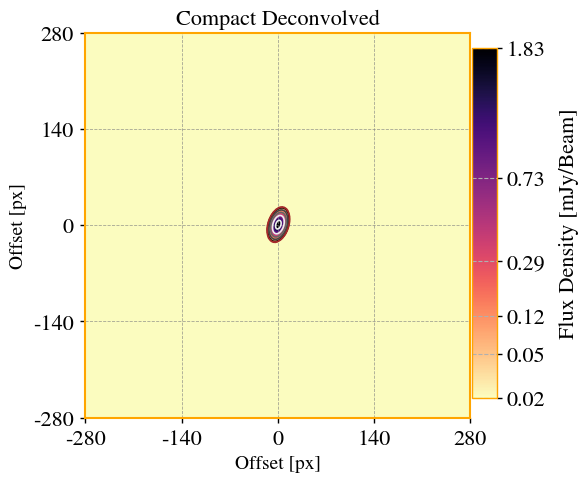

In [199]:
ax=mlibs.eimshow(smfr.models[0]['model_c1'],
           crop=True,box_size=280,
           rms=input_data.rms_res,
           vmax=input_data.image_data_2D.max())
ax.set_title('Compact Deconvolved')

Text(0.5, 1.0, 'Compact Convolved')

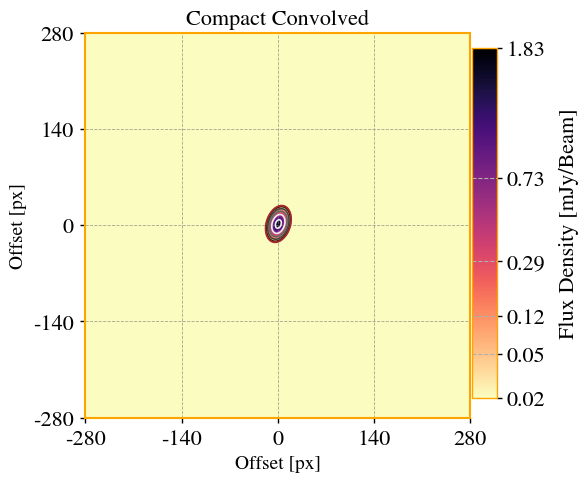

In [200]:
ax=mlibs.eimshow(smfr.models[0]['model_c1_conv'],
           crop=True,box_size=280,
           center=center,
           rms=input_data.rms_res,
           vmax=input_data.image_data_2D.max())
ax.set_title('Compact Convolved')

Text(0.5, 1.0, 'Model Deconvolved')

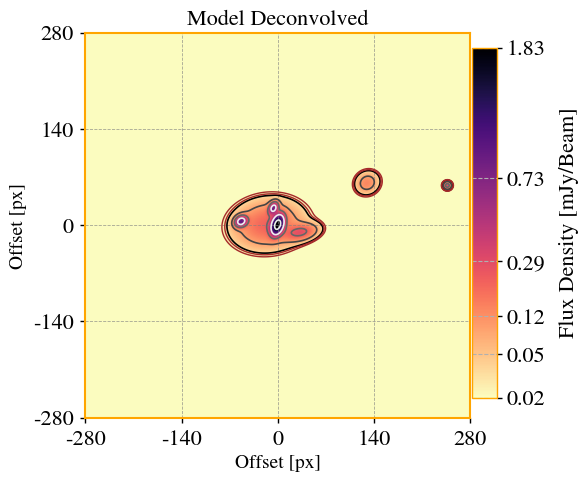

In [201]:
ax=mlibs.eimshow(smfr.models[0]['model_total'],
           crop=True,box_size=280,rms=rms,
           center=center,
           vmax=input_data.image_data_2D.max())
ax.set_title('Model Deconvolved')

Input image is not a string.
Input image is not a string.


Text(0.5, 1.0, 'Model Convolved')

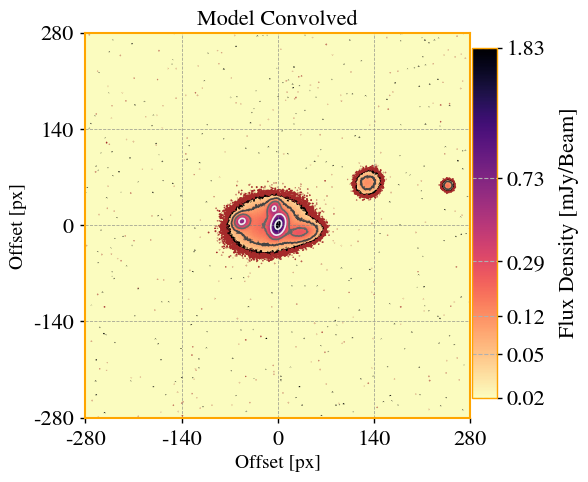

In [202]:
ax=mlibs.eimshow(smfr.models[0]['model_total_conv'],
           crop=True,box_size=280,rms=input_data.rms_res,
           vmax=input_data.image_data_2D.max())
ax.set_title('Model Convolved')

Text(0.5, 1.0, 'Residual')

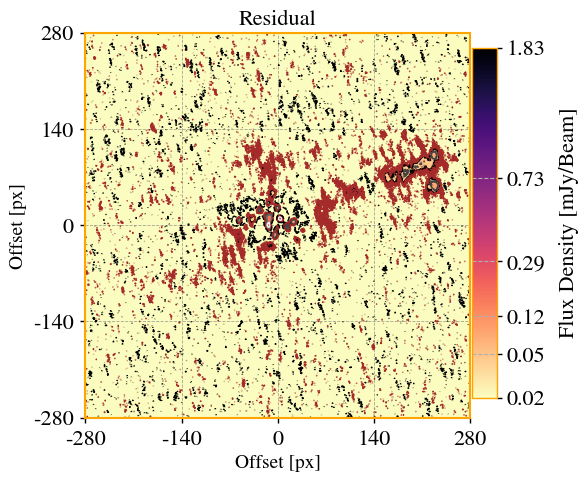

In [208]:
ax = mlibs.eimshow(input_data.image_data_2D- smfr.models[0]['model_total_conv'],
             center=center,
             crop=True,box_size=280,vmax_factor=1.0,vmin_factor=3,
             rms=rms,
             vmax=input_data.image_data_2D.max()
            )
ax.set_title('Residual')

In [210]:
print(f"Total flux in model = {smfr.results_fit['flux_density_model'][0]:.2f} mJy")
print(f"Total flux in data = {smfr.results_fit['flux_data'][0]:.2f} mJy")
print(f"Total flux in res = {smfr.results_fit['flux_res'][0]:.2f} mJy")


Total flux in model = 28.38 mJy
Total flux in data = 30.12 mJy
Total flux in res = 1.74 mJy


#### Analysing fit statistics (model parameters)

In [212]:
smfr.lmfit_results[0]

name,value,standard error,relative error,initial value,min,max,vary
f1_x0,399.140525,0.00394285,(0.00%),399.14054953769227,396.981901,402.981901,True
f1_y0,399.099784,0.00595477,(0.00%),399.09962473024603,397.200315,403.200315,True
f1_PA,72.5686918,0.05925312,(0.08%),72.57000077423652,-6.89538733,173.104613,True
f1_ell,0.42877732,6.6998e-04,(0.16%),0.42876976804726646,0.06075719,0.75000000,True
f1_n,0.50264770,0.00339478,(0.68%),0.5026392209579681,0.49000000,0.51000000,True
f1_In,0.00109553,6.3595e-06,(0.58%),0.0010955266351251511,7.9439e-06,0.39719571,True
f1_Rn,9.82468821,0.14779341,(1.50%),9.824810816566062,0.51957391,15.5872174,True
f1_cg,-0.00999880,0.01046829,(104.70%),-0.009998793107358588,-0.01000000,0.01000000,True
f2_x0,346.041336,0.01202683,(0.00%),346.04130453473397,345.037154,351.037154,True
f2_y0,403.999765,0.01184367,(0.00%),403.9998693709782,402.241046,408.241046,True


### Check decomposition results: Compact vs Extended
Now, we can investigate the integrated fluxes between core-compact structures in relation to diffuse ones. 

Note that we consider that the diffuse flux density is the sum between the flux density from the extended model component and the flux density of the residual map.

In [213]:
print(f"Total flux in compact = {smfr.results_fit['flux_density_compact'][0]:.2f} mJy")
print(f"Total flux in extended = {smfr.results_fit['flux_density_extended_model'][0] + smfr.results_fit['flux_res'][0]:.2f} mJy")

# The total flux density in the diffuse regions are saved in:
print(f"Total flux in extended (alternative computation) = {smfr.results_fit['flux_density_ext2'][0]:.2f} mJy")


Total flux in compact = 11.26 mJy
Total flux in extended = 18.86 mJy
Total flux in extended (alternative computation) = 18.87 mJy


### Physical Sizes of the components

In [215]:
print(f"1px = {smfr.results_compact_conv_morpho['pix_to_pc'][0]} pc")

1px = 19.806792829208664 pc


In [217]:
# The effective radius in terms of the Sersic Rn parameter.
# This is a deconvolved quantity.
print(f"#############################")
print(f"Component 1 (in this case, the compact component)")
print(f"-----------------------------")
print(f"Rn ={smfr.results_fit['f1_Rn'][0] * pix_to_pc : .0f} pc")
print(f"In ={smfr.results_fit['f1_In'][0]} Jy/beam")
print(f"q (axis ratio) ={1-smfr.results_fit['f1_ell'][0]}")
print(f"-----------------------------")

#############################
Component 1 (in this case, the compact component)
-----------------------------
Rn = 316 pc
In =0.001095531794408336 Jy/beam
q (axis ratio) =0.5712226795614868
-----------------------------


In [219]:
print(f"#############################")
print(f"Component 1 (in this case, the compact component)")
print(f"-----------------------------")
# The deconvolved effective radius measured in the deconvolved model image. 
print(f"Deconv R50 ={smfr.results_compact_deconv_morpho['C50radii'][0] * pix_to_pc : .0f} pc")
# The convolved effective radius measured in the convolved model image. 
print(f"Conv R50 ={smfr.results_compact_conv_morpho['C50radii'][0] * pix_to_pc : .0f} pc")
# The deconvolved effective radius measured in the deconvolved model image. 
print(f"Deconv R95 ={smfr.results_compact_deconv_morpho['C95radii'][0] * pix_to_pc : .0f} pc (full estimated size)")
# The convolved effective radius measured in the convolved model image. 
print(f"Conv R95 ={smfr.results_compact_conv_morpho['C95radii'][0] * pix_to_pc : .0f} pc (full estimated size)")

#############################
Component 1 (in this case, the compact component)
-----------------------------
Deconv R50 = 294 pc
Conv R50 = 338 pc
Deconv R95 = 709 pc (full estimated size)
Conv R95 = 850 pc (full estimated size)


### Compute SFR Estimates for Diffuse Structures and the Brightness Temperature

In [220]:
SFR = mp.radio_star_formation(input_data,smfr,z=mlibs.find_z_NED('MCG+12-02-001'))

2024-02-06 02:12:52 - INFO - Using frequency of 6.00 GHz for star formation estimate.
2024-02-06 02:12:52 - INFO - +-----------------+
2024-02-06 02:12:52 - INFO - | SFR Estimates |
2024-02-06 02:12:52 - INFO - +-----------------+
2024-02-06 02:12:52 - INFO -  ==> SFR =19.71 +/- 2.01 Mo/yr
2024-02-06 02:12:52 - INFO - +------------------+
2024-02-06 02:12:52 - INFO - | sSFR Estimates |
2024-02-06 02:12:52 - INFO - +------------------+
2024-02-06 02:12:52 - INFO -  >=> Deconvolved A50 sSFR = 19.11 Mo/(yr kpc^2)
2024-02-06 02:12:52 - INFO -  >=> Convolved A50 sSFR = 19.37 Mo/(yr kpc^2)
2024-02-06 02:12:52 - INFO -  >=> Deconvolved A95 sSFR = 4.83 Mo/(yr kpc^2)
2024-02-06 02:12:52 - INFO -  >=> Convolved A95 sSFR = 4.73 Mo/(yr kpc^2)
2024-02-06 02:12:52 - INFO - +--------------------------+
2024-02-06 02:12:52 - INFO - | Brightness Temperature |
2024-02-06 02:12:52 - INFO - +--------------------------+
2024-02-06 02:12:52 - INFO -  ==> TB Rn Fit = 0.01 e5 K
2024-02-06 02:12:52 - INFO -  =

### Estimating the brightness temperatures for all model components

In [222]:
components_conv_props_df = mlibs.pd.DataFrame(smfr.components_conv_props[0]).T
components_deconv_props_df = mlibs.pd.DataFrame(smfr.components_deconv_props[0]).T

In [223]:
components_deconv_props_df['qmo']

model_c_deconv_1_props    0.580276
model_c_deconv_2_props    0.817996
model_c_deconv_3_props    0.519018
model_c_deconv_4_props    0.713623
model_c_deconv_5_props     0.91499
model_c_deconv_6_props    0.951798
model_c_deconv_7_props    0.710886
Name: qmo, dtype: object

In [224]:
components_deconv_props_df['total_flux_mask']

model_c_deconv_1_props    0.008712
model_c_deconv_2_props    0.002154
model_c_deconv_3_props     0.00237
model_c_deconv_4_props    0.001529
model_c_deconv_5_props    0.001282
model_c_deconv_6_props    0.000385
model_c_deconv_7_props    0.011633
Name: total_flux_mask, dtype: object

In [229]:
components_deconv_props_df['C50radii']

model_c_deconv_1_props     7.611334
model_c_deconv_2_props     5.944106
model_c_deconv_3_props    12.034575
model_c_deconv_4_props     5.382026
model_c_deconv_5_props    11.603667
model_c_deconv_6_props      4.14593
model_c_deconv_7_props    26.904213
Name: C50radii, dtype: object

In [225]:
theta1_R50fit = 2 * components_deconv_props_df['cell_size'] * components_deconv_props_df['C50radii']
theta2_R50fit = (2 * (1 - components_deconv_props_df['qm']) * components_deconv_props_df['cell_size'] * components_deconv_props_df['C50radii'])

In [227]:

TB_R50fit  = mlibs.Tb_source(Snu=components_deconv_props_df['total_flux_mask'],
                            freq=6, #in GHz
                            theta1=theta1_R50fit, theta2=theta2_R50fit,
                            z=mlibs.find_z_NED('MCG+12-02-001'))

In [228]:
print(TB_R50fit,'x 10^5 K')

model_c_deconv_1_props    0.012665
model_c_deconv_2_props     0.01204
model_c_deconv_3_props    0.001203
model_c_deconv_4_props    0.006557
model_c_deconv_5_props    0.004052
model_c_deconv_6_props    0.015826
model_c_deconv_7_props    0.001948
dtype: object x 10^5 K
